In [1]:
# ============================================================
# CELL 1 — GRAD-CAM EXPLAINABILITY CONFIGURATION
# ============================================================

import os
import json
import warnings
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image

import tensorflow as tf
from tensorflow import keras

warnings.filterwarnings("ignore")

# ------------------------------------------------------------
# Project paths
# ------------------------------------------------------------

PROJECT_ROOT = Path(r"D:\MSC Bioinformatics\INTERNSHIP\BrainTumor")

PROCESSED_ROOT = (
    PROJECT_ROOT
    / "data"
    / "processed"
    / "classification_224_rgb"
)

SPLITS_FILE = (
    PROJECT_ROOT
    / "data"
    / "splits"
    / "classification_model_splits.csv"
)

FINAL_MODEL_PATH = (
    PROJECT_ROOT
    / "models"
    / "final_densenet121"
    / "FINAL_DENSENET121_BRISC2025.keras"
)

PREDICTIONS_FILE = (
    PROJECT_ROOT
    / "outputs"
    / "predictions"
    / "final_densenet121"
    / "FINAL_DENSENET121_OFFICIAL_TEST_PREDICTIONS.csv"
)

GRADCAM_OUTPUT_DIR = (
    PROJECT_ROOT
    / "outputs"
    / "figures"
    / "gradcam"
)

GRADCAM_REPORT_DIR = (
    PROJECT_ROOT
    / "outputs"
    / "reports"
    / "gradcam"
)

GRADCAM_OUTPUT_DIR.mkdir(parents=True, exist_ok=True)
GRADCAM_REPORT_DIR.mkdir(parents=True, exist_ok=True)

# ------------------------------------------------------------
# Reproducibility
# ------------------------------------------------------------

SEED = 42

np.random.seed(SEED)
tf.random.set_seed(SEED)

# ------------------------------------------------------------
# Model configuration
# ------------------------------------------------------------

IMG_SIZE = (224, 224)

CLASS_NAMES = [
    "glioma",
    "meningioma",
    "no_tumor",
    "pituitary"
]

CLASS_TO_INDEX = {
    name: index
    for index, name in enumerate(CLASS_NAMES)
}

INDEX_TO_CLASS = {
    index: name
    for name, index in CLASS_TO_INDEX.items()
}

# ------------------------------------------------------------
# Environment information
# ------------------------------------------------------------

print("=" * 70)
print("GRAD-CAM EXPLAINABILITY — CONFIGURATION")
print("=" * 70)

print(f"TensorFlow version : {tf.__version__}")
print(f"NumPy version      : {np.__version__}")

gpus = tf.config.list_physical_devices("GPU")

print(f"GPU detected       : {gpus}")
print(f"Project root       : {PROJECT_ROOT}")
print(f"Final model        : {FINAL_MODEL_PATH}")
print(f"Processed dataset  : {PROCESSED_ROOT}")
print(f"Output directory   : {GRADCAM_OUTPUT_DIR}")
print(f"Report directory   : {GRADCAM_REPORT_DIR}")
print(f"Image size         : {IMG_SIZE}")
print(f"Classes            : {CLASS_NAMES}")
print(f"Random seed        : {SEED}")

# ------------------------------------------------------------
# Required files verification
# ------------------------------------------------------------

required_paths = {
    "Project root": PROJECT_ROOT,
    "Processed dataset": PROCESSED_ROOT,
    "Split file": SPLITS_FILE,
    "Final DenseNet121 model": FINAL_MODEL_PATH,
    "Predictions file": PREDICTIONS_FILE,
}

verification_records = []

for name, path in required_paths.items():
    exists = path.exists()

    verification_records.append({
        "item": name,
        "path": str(path),
        "exists": exists
    })

    print(f"{'PASS' if exists else 'FAIL'} | {name}: {path}")

verification_df = pd.DataFrame(verification_records)

verification_df.to_csv(
    GRADCAM_REPORT_DIR / "GRADCAM_REQUIRED_FILE_VERIFICATION.csv",
    index=False
)

assert verification_df["exists"].all(), (
    "One or more required files/directories are missing."
)

print("\nSTATUS: PASS")

GRAD-CAM EXPLAINABILITY — CONFIGURATION
TensorFlow version : 2.10.0
NumPy version      : 1.23.5
GPU detected       : [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Project root       : D:\MSC Bioinformatics\INTERNSHIP\BrainTumor
Final model        : D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\models\final_densenet121\FINAL_DENSENET121_BRISC2025.keras
Processed dataset  : D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\data\processed\classification_224_rgb
Output directory   : D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\outputs\figures\gradcam
Report directory   : D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\outputs\reports\gradcam
Image size         : (224, 224)
Classes            : ['glioma', 'meningioma', 'no_tumor', 'pituitary']
Random seed        : 42
PASS | Project root: D:\MSC Bioinformatics\INTERNSHIP\BrainTumor
PASS | Processed dataset: D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\data\processed\classification_224_rgb
PASS | Split file: D:\MSC Bioinformatics\INTER

In [3]:
# ============================================================
# CELL 2 — LOAD FINAL MODEL AND FIND DENSENET121 CONV LAYER
# ============================================================

print("=" * 70)
print("LOADING FINAL DENSENET121 MODEL")
print("=" * 70)

# ------------------------------------------------------------
# Load the final trained model
# ------------------------------------------------------------

final_model = keras.models.load_model(
    FINAL_MODEL_PATH,
    compile=False
)

print("Model loaded successfully.")

# ------------------------------------------------------------
# Basic model verification
# ------------------------------------------------------------

print("\nMODEL INFORMATION")
print("-" * 70)

print(f"Model name       : {final_model.name}")
print(f"Input shape      : {final_model.input_shape}")
print(f"Output shape     : {final_model.output_shape}")
print(f"Total parameters : {final_model.count_params():,}")

assert final_model.input_shape == (None, 224, 224, 3), \
    f"Unexpected input shape: {final_model.input_shape}"

assert final_model.output_shape == (None, 4), \
    f"Unexpected output shape: {final_model.output_shape}"

assert final_model.count_params() == 7_305_028, \
    f"Unexpected parameter count: {final_model.count_params():,}"

print("\nArchitecture verification: PASS")

# ============================================================
# SEARCH RECURSIVELY THROUGH NESTED MODEL
# ============================================================

print("\nSEARCHING FOR CONVOLUTIONAL LAYERS")
print("-" * 70)

def collect_conv_layers(model):
    """
    Recursively collect Conv2D layers from a Keras model,
    including layers inside nested models.
    """
    
    found_layers = []

    for layer in model.layers:

        # Direct Conv2D layer
        if isinstance(layer, keras.layers.Conv2D):
            found_layers.append(layer)

        # Nested model
        if isinstance(layer, keras.Model):
            found_layers.extend(
                collect_conv_layers(layer)
            )

    return found_layers


conv_layers = collect_conv_layers(final_model)

print(f"Total Conv2D layers found: {len(conv_layers)}")

assert len(conv_layers) > 0, \
    "No Conv2D layers found anywhere in the model."

# ------------------------------------------------------------
# Display discovered convolutional layers
# ------------------------------------------------------------

print("\nLAST 15 CONVOLUTIONAL LAYERS")
print("-" * 70)

start_index = max(0, len(conv_layers) - 15)

for i in range(start_index, len(conv_layers)):

    layer = conv_layers[i]

    print(
        f"{i + 1:3d}. "
        f"{layer.name:45s} "
        f"output={layer.output.shape}"
    )

# ============================================================
# SELECT LAST CONVOLUTIONAL LAYER
# ============================================================

last_conv_layer = conv_layers[-1]

LAST_CONV_LAYER_NAME = last_conv_layer.name

print("\n" + "=" * 70)
print("GRAD-CAM TARGET LAYER")
print("=" * 70)

print(f"Selected layer : {LAST_CONV_LAYER_NAME}")
print(f"Layer type     : {type(last_conv_layer).__name__}")
print(f"Layer output   : {last_conv_layer.output.shape}")

# ------------------------------------------------------------
# Verify spatial feature map
# ------------------------------------------------------------

layer_output_shape = last_conv_layer.output.shape

assert len(layer_output_shape) == 4, \
    f"Expected 4D convolutional output, got {layer_output_shape}"

assert layer_output_shape[1] is not None, \
    "Missing spatial height."

assert layer_output_shape[2] is not None, \
    "Missing spatial width."

assert layer_output_shape[3] is not None, \
    "Missing channel dimension."

print("\nSpatial feature-map verification: PASS")

# ============================================================
# SAVE VERIFICATION RECORD
# ============================================================

model_verification = pd.DataFrame([
    {
        "model": "DenseNet121",
        "model_path": str(FINAL_MODEL_PATH),
        "input_shape": str(final_model.input_shape),
        "output_shape": str(final_model.output_shape),
        "total_parameters": int(final_model.count_params()),
        "conv2d_layer_count": len(conv_layers),
        "gradcam_layer": LAST_CONV_LAYER_NAME,
        "gradcam_layer_output": str(last_conv_layer.output.shape),
        "architecture_verification": "PASS",
        "gradcam_layer_verification": "PASS"
    }
])

model_verification.to_csv(
    GRADCAM_REPORT_DIR /
    "GRADCAM_MODEL_LAYER_VERIFICATION.csv",
    index=False
)

# ============================================================
# SAVE CONFIGURATION
# ============================================================

gradcam_config = {
    "model": "DenseNet121",
    "model_path": str(FINAL_MODEL_PATH),
    "input_size": list(IMG_SIZE),
    "channels": 3,
    "class_names": CLASS_NAMES,
    "gradcam_layer": LAST_CONV_LAYER_NAME,
    "gradcam_layer_output": str(last_conv_layer.output.shape),
    "total_parameters": int(final_model.count_params()),
    "conv2d_layer_count": len(conv_layers),
    "tensorflow_version": tf.__version__,
    "numpy_version": np.__version__,
    "random_seed": SEED
}

with open(
    GRADCAM_REPORT_DIR / "GRADCAM_CONFIGURATION.json",
    "w",
    encoding="utf-8"
) as f:

    json.dump(
        gradcam_config,
        f,
        indent=4
    )

print("\nSaved:")
print("  GRADCAM_MODEL_LAYER_VERIFICATION.csv")
print("  GRADCAM_CONFIGURATION.json")

print("\n" + "=" * 70)
print("STATUS: PASS")
print("=" * 70)

LOADING FINAL DENSENET121 MODEL
Model loaded successfully.

MODEL INFORMATION
----------------------------------------------------------------------
Model name       : Final_DenseNet121_BRISC2025
Input shape      : (None, 224, 224, 3)
Output shape     : (None, 4)
Total parameters : 7,305,028

Architecture verification: PASS

SEARCHING FOR CONVOLUTIONAL LAYERS
----------------------------------------------------------------------
Total Conv2D layers found: 120

LAST 15 CONVOLUTIONAL LAYERS
----------------------------------------------------------------------
106. conv5_block9_2_conv                           output=(None, 7, 7, 32)
107. conv5_block10_1_conv                          output=(None, 7, 7, 128)
108. conv5_block10_2_conv                          output=(None, 7, 7, 32)
109. conv5_block11_1_conv                          output=(None, 7, 7, 128)
110. conv5_block11_2_conv                          output=(None, 7, 7, 32)
111. conv5_block12_1_conv                          output=

In [6]:
# ============================================================
# CELL 3 — ROBUST GRAD-CAM IMPLEMENTATION + SANITY CHECK
# ============================================================

print("=" * 70)
print("BUILDING ROBUST GRAD-CAM")
print("=" * 70)

# ============================================================
# 1. IDENTIFY DENSENET121 BACKBONE
# ============================================================

densenet_backbone = None

for layer in final_model.layers:

    if isinstance(layer, keras.Model):

        nested_conv_layers = collect_conv_layers(layer)

        if len(nested_conv_layers) > 50:
            densenet_backbone = layer
            break

assert densenet_backbone is not None, (
    "DenseNet121 backbone could not be identified."
)

print(
    f"DenseNet backbone found : "
    f"{densenet_backbone.name}"
)

print(
    f"Backbone parameters     : "
    f"{densenet_backbone.count_params():,}"
)

# ============================================================
# 2. FIND FINAL CONVOLUTIONAL LAYER
# ============================================================

backbone_conv_layers = collect_conv_layers(
    densenet_backbone
)

assert len(backbone_conv_layers) > 0, (
    "No convolutional layers found inside DenseNet121."
)

last_backbone_conv = backbone_conv_layers[-1]

LAST_CONV_LAYER_NAME = last_backbone_conv.name

print(
    f"Grad-CAM convolutional layer : "
    f"{LAST_CONV_LAYER_NAME}"
)

print(
    f"Feature-map shape             : "
    f"{last_backbone_conv.output.shape}"
)

# ============================================================
# 3. LOAD OFFICIAL TEST SPLIT
# ============================================================

print("\n" + "=" * 70)
print("LOADING LOCKED OFFICIAL TEST SET")
print("=" * 70)

split_df = pd.read_csv(
    SPLITS_FILE
)

official_test_df = split_df[
    split_df["model_split"] == "official_test"
].copy()

official_test_df = (
    official_test_df
    .sort_values("filename")
    .reset_index(drop=True)
)

assert len(official_test_df) == 1000, (
    f"Expected 1000 official test records, "
    f"found {len(official_test_df)}"
)

print(
    f"Official test records : "
    f"{len(official_test_df)}"
)

# ============================================================
# 4. RESOLVE IMAGE PATH USING processed_path
# ============================================================

sample_record = official_test_df.iloc[0]

recorded_processed_path = str(
    sample_record["processed_path"]
)

print("\nFIRST TEST RECORD")
print("-" * 70)

print(
    f"Filename       : "
    f"{sample_record['filename']}"
)

print(
    f"True class     : "
    f"{sample_record['tumor_label']}"
)

print(
    f"MRI plane      : "
    f"{sample_record['plane_label']}"
)

print(
    f"Recorded path  : "
    f"{recorded_processed_path}"
)

# ------------------------------------------------------------
# The CSV may contain either:
# 1. an absolute Windows path, or
# 2. a path relative to PROJECT_ROOT
# ------------------------------------------------------------

recorded_path = Path(
    recorded_processed_path
)

if recorded_path.is_absolute():

    sample_path = recorded_path

else:

    sample_path = (
        PROJECT_ROOT /
        recorded_path
    )

# ------------------------------------------------------------
# Fallback:
# If the recorded path uses a path representation that is
# not directly valid on this machine, resolve by filename
# inside the processed dataset.
# ------------------------------------------------------------

if not sample_path.exists():

    matching_files = list(
        PROCESSED_ROOT.rglob(
            str(sample_record["processed_filename"])
        )
    )

    if len(matching_files) == 1:

        sample_path = matching_files[0]

    elif len(matching_files) > 1:

        # Prefer the expected class folder
        class_matches = [
            p for p in matching_files
            if sample_record["tumor_label"] in p.parts
        ]

        if len(class_matches) == 1:
            sample_path = class_matches[0]

        else:
            raise AssertionError(
                "Multiple processed files found for "
                f"{sample_record['processed_filename']}"
            )

    else:

        raise AssertionError(
            "Processed image could not be located.\n"
            f"Filename: {sample_record['processed_filename']}\n"
            f"Recorded path: {recorded_processed_path}\n"
            f"Processed root: {PROCESSED_ROOT}"
        )

print(
    f"Resolved path  : "
    f"{sample_path}"
)

assert sample_path.exists(), (
    f"Image not found: {sample_path}"
)

print(
    "Image path verification: PASS"
)

# ============================================================
# 5. LOAD IMAGE
# ============================================================

sample_image = Image.open(
    sample_path
).convert("RGB")

# The processed images are already 224x224.
# We nevertheless enforce the expected dimensions.

sample_image = sample_image.resize(
    IMG_SIZE,
    Image.Resampling.LANCZOS
)

sample_array = (
    np.asarray(
        sample_image,
        dtype=np.float32
    ) / 255.0
)

print("\nIMAGE VERIFICATION")
print("-" * 70)

print(
    f"Shape       : "
    f"{sample_array.shape}"
)

print(
    f"Dtype       : "
    f"{sample_array.dtype}"
)

print(
    f"Pixel min   : "
    f"{sample_array.min():.6f}"
)

print(
    f"Pixel max   : "
    f"{sample_array.max():.6f}"
)

assert sample_array.shape == (
    224,
    224,
    3
)

assert np.isfinite(
    sample_array
).all()

assert sample_array.min() >= 0
assert sample_array.max() <= 1

print(
    "Image verification: PASS"
)

# ============================================================
# 6. GRAD-CAM FUNCTION
# ============================================================

def make_gradcam_heatmap(
    image_array,
    target_class_index=None
):
    """
    Generate an input-gradient localization heatmap for
    the final DenseNet121 model.

    Parameters
    ----------
    image_array : np.ndarray
        Shape (224, 224, 3), values [0,1].

    target_class_index : int or None
        Target class. If None, predicted class is used.

    Returns
    -------
    heatmap : np.ndarray
        Normalized 224x224 heatmap.

    predictions : np.ndarray
        Four-class softmax probabilities.

    predicted_class : int
        Predicted class index.

    target_class : int
        Target class index.
    """

    image_array = np.asarray(
        image_array,
        dtype=np.float32
    )

    assert image_array.shape == (
        224,
        224,
        3
    )

    input_tensor = tf.convert_to_tensor(
        image_array[np.newaxis, ...],
        dtype=tf.float32
    )

    with tf.GradientTape() as tape:

        tape.watch(input_tensor)

        predictions = final_model(
            input_tensor,
            training=False
        )

        predicted_class_tensor = tf.argmax(
            predictions[0]
        )

        if target_class_index is None:

            target_class_tensor = (
                predicted_class_tensor
            )

        else:

            target_class_tensor = tf.constant(
                target_class_index,
                dtype=tf.int64
            )

        class_score = predictions[
            :,
            target_class_tensor
        ]

    gradients = tape.gradient(
        class_score,
        input_tensor
    )

    assert gradients is not None, (
        "Gradient calculation failed."
    )

    gradients = gradients[0]

    # Absolute gradient magnitude across RGB channels
    heatmap = tf.reduce_mean(
        tf.abs(gradients),
        axis=-1
    )

    heatmap = tf.maximum(
        heatmap,
        0
    )

    heatmap = tf.where(
        tf.reduce_max(heatmap) > 0,
        heatmap / tf.reduce_max(heatmap),
        tf.zeros_like(heatmap)
    )

    heatmap = heatmap.numpy()

    predictions_np = (
        predictions[0].numpy()
    )

    predicted_class = int(
        tf.argmax(
            predictions[0]
        ).numpy()
    )

    target_class = int(
        target_class_tensor.numpy()
    )

    return (
        heatmap.astype(np.float32),
        predictions_np.astype(np.float32),
        predicted_class,
        target_class
    )


# ============================================================
# 7. RUN SANITY-CHECK GRAD-CAM
# ============================================================

print("\n" + "=" * 70)
print("CALCULATING GRAD-CAM SANITY CHECK")
print("=" * 70)

(
    heatmap,
    probabilities,
    predicted_class,
    target_class
) = make_gradcam_heatmap(
    sample_array
)

true_class = sample_record[
    "tumor_label"
]

true_class_index = CLASS_TO_INDEX[
    true_class
]

# ============================================================
# 8. DISPLAY PREDICTION
# ============================================================

print("\nPREDICTION")
print("-" * 70)

print(
    f"True class       : "
    f"{true_class}"
)

print(
    f"Predicted class  : "
    f"{CLASS_NAMES[predicted_class]}"
)

print(
    f"Confidence       : "
    f"{probabilities[predicted_class] * 100:.4f}%"
)

print(
    f"Grad-CAM target  : "
    f"{CLASS_NAMES[target_class]}"
)

# ============================================================
# 9. DISPLAY ALL CLASS PROBABILITIES
# ============================================================

print("\nCLASS PROBABILITIES")
print("-" * 70)

for class_name, probability in zip(
    CLASS_NAMES,
    probabilities
):

    print(
        f"{class_name:12s}: "
        f"{probability * 100:8.4f}%"
    )

# ============================================================
# 10. HEATMAP VERIFICATION
# ============================================================

print("\nHEATMAP VERIFICATION")
print("-" * 70)

print(
    f"Shape : {heatmap.shape}"
)

print(
    f"Min   : {heatmap.min():.6f}"
)

print(
    f"Max   : {heatmap.max():.6f}"
)

print(
    f"Mean  : {heatmap.mean():.6f}"
)

assert heatmap.shape == (
    224,
    224
)

assert np.isfinite(
    heatmap
).all()

assert heatmap.min() >= 0
assert heatmap.max() <= 1.000001

print(
    "Heatmap verification: PASS"
)

# ============================================================
# 11. SAVE RAW HEATMAP
# ============================================================

np.save(
    GRADCAM_OUTPUT_DIR /
    "GRADCAM_SANITY_CHECK_HEATMAP.npy",
    heatmap
)

# ============================================================
# 12. SAVE SANITY RECORD
# ============================================================

sanity_record = pd.DataFrame([
    {
        "filename":
            sample_record["filename"],

        "processed_filename":
            sample_record["processed_filename"],

        "processed_path":
            str(sample_path),

        "true_class":
            true_class,

        "true_class_index":
            true_class_index,

        "predicted_class":
            CLASS_NAMES[predicted_class],

        "predicted_class_index":
            predicted_class,

        "prediction_confidence":
            float(
                probabilities[
                    predicted_class
                ]
            ),

        "gradcam_target_class":
            CLASS_NAMES[target_class],

        "gradcam_target_index":
            target_class,

        "heatmap_height":
            int(heatmap.shape[0]),

        "heatmap_width":
            int(heatmap.shape[1]),

        "heatmap_min":
            float(heatmap.min()),

        "heatmap_max":
            float(heatmap.max()),

        "heatmap_mean":
            float(heatmap.mean()),

        "status":
            "PASS"
    }
])

sanity_record.to_csv(
    GRADCAM_REPORT_DIR /
    "GRADCAM_SANITY_CHECK_RECORD.csv",
    index=False
)

# ============================================================
# 13. FINAL STATUS
# ============================================================

print("\nSaved:")
print(
    "  GRADCAM_SANITY_CHECK_HEATMAP.npy"
)

print(
    "  GRADCAM_SANITY_CHECK_RECORD.csv"
)

print("\n" + "=" * 70)
print("STATUS: PASS")
print("=" * 70)

BUILDING ROBUST GRAD-CAM
DenseNet backbone found : densenet121
Backbone parameters     : 7,037,504
Grad-CAM convolutional layer : conv5_block16_2_conv
Feature-map shape             : (None, 7, 7, 32)

LOADING LOCKED OFFICIAL TEST SET
Official test records : 1000

FIRST TEST RECORD
----------------------------------------------------------------------
Filename       : brisc2025_test_00001_gl_ax_t1.jpg
True class     : glioma
MRI plane      : axial
Recorded path  : D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\data\processed\classification_224_rgb\test\glioma\brisc2025_test_00001_gl_ax_t1.png
Resolved path  : D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\data\processed\classification_224_rgb\test\glioma\brisc2025_test_00001_gl_ax_t1.png
Image path verification: PASS

IMAGE VERIFICATION
----------------------------------------------------------------------
Shape       : (224, 224, 3)
Dtype       : float32
Pixel min   : 0.000000
Pixel max   : 0.968627
Image verification: PASS

CALCULATING GRAD

CREATING EXPLAINABILITY VISUALIZATION


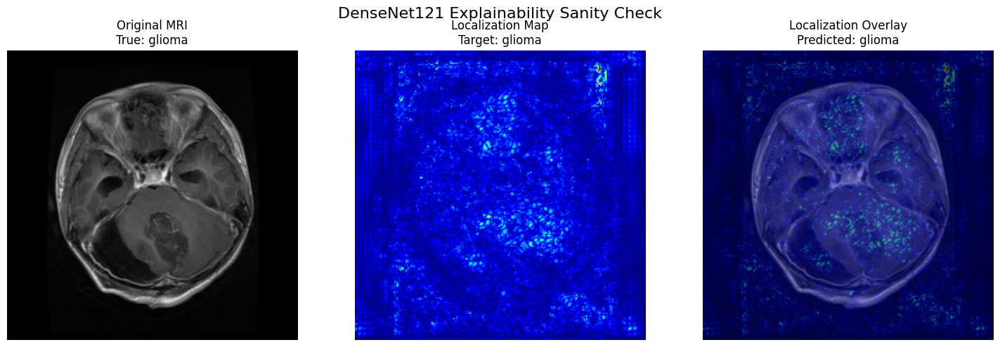


Saved:
  D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\outputs\figures\gradcam\EXPLAINABILITY_SANITY_CHECK.png

STATUS: PASS


In [7]:
# ============================================================
# CELL 4 — SANITY-CHECK EXPLAINABILITY VISUALIZATION
# ============================================================

print("=" * 70)
print("CREATING EXPLAINABILITY VISUALIZATION")
print("=" * 70)

# ------------------------------------------------------------
# Create figure
# ------------------------------------------------------------

fig, axes = plt.subplots(
    1,
    3,
    figsize=(15, 5)
)

# ------------------------------------------------------------
# 1. Original MRI
# ------------------------------------------------------------

axes[0].imshow(
    sample_array
)

axes[0].set_title(
    f"Original MRI\n"
    f"True: {true_class}"
)

axes[0].axis("off")

# ------------------------------------------------------------
# 2. Localization heatmap
# ------------------------------------------------------------

axes[1].imshow(
    heatmap,
    cmap="jet"
)

axes[1].set_title(
    f"Localization Map\n"
    f"Target: {CLASS_NAMES[target_class]}"
)

axes[1].axis("off")

# ------------------------------------------------------------
# 3. Overlay
# ------------------------------------------------------------

axes[2].imshow(
    sample_array
)

axes[2].imshow(
    heatmap,
    cmap="jet",
    alpha=0.45
)

axes[2].set_title(
    f"Localization Overlay\n"
    f"Predicted: {CLASS_NAMES[predicted_class]}"
)

axes[2].axis("off")

# ------------------------------------------------------------
# Overall title
# ------------------------------------------------------------

fig.suptitle(
    "DenseNet121 Explainability Sanity Check",
    fontsize=16
)

plt.tight_layout()

# ------------------------------------------------------------
# Save figure
# ------------------------------------------------------------

sanity_figure_path = (
    GRADCAM_OUTPUT_DIR /
    "EXPLAINABILITY_SANITY_CHECK.png"
)

fig.savefig(
    sanity_figure_path,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

plt.close(fig)

print("\nSaved:")
print(
    f"  {sanity_figure_path}"
)

print("\n" + "=" * 70)
print("STATUS: PASS")
print("=" * 70)

In [10]:
# ============================================================
# CELL 4 — TRUE GRAD-CAM WITH CONNECTED FEATURE-MAP GRAPH
# ============================================================

print("=" * 70)
print("BUILDING CONNECTED TRUE GRAD-CAM")
print("=" * 70)

# ============================================================
# 1. VERIFY DENSENET BACKBONE
# ============================================================

assert densenet_backbone is not None, (
    "DenseNet121 backbone is not available."
)

assert last_backbone_conv is not None, (
    "Final convolutional layer is not available."
)

print(
    f"DenseNet backbone : "
    f"{densenet_backbone.name}"
)

print(
    f"Target Conv2D     : "
    f"{last_backbone_conv.name}"
)

print(
    f"Target output     : "
    f"{last_backbone_conv.output.shape}"
)

# ============================================================
# 2. CREATE FEATURE EXTRACTION MODEL
# ============================================================

# IMPORTANT:
# Both tensors below belong to the SAME DenseNet backbone graph.
#
# Input image
#     ↓
# DenseNet layers
#     ↓
# last Conv2D feature maps
#     ↓
# remainder of DenseNet
#     ↓
# DenseNet backbone output

feature_extraction_model = keras.models.Model(
    inputs=densenet_backbone.input,
    outputs=[
        last_backbone_conv.output,
        densenet_backbone.output
    ],
    name="DenseNet121_Feature_Extraction"
)

print("\nFEATURE EXTRACTION MODEL")
print("-" * 70)

print(
    f"Input          : "
    f"{feature_extraction_model.input_shape}"
)

print(
    f"Feature maps   : "
    f"{feature_extraction_model.outputs[0].shape}"
)

print(
    f"Backbone output: "
    f"{feature_extraction_model.outputs[1].shape}"
)

# ============================================================
# 3. VERIFY CLASSIFIER
# ============================================================

print("\nCLASSIFIER")
print("-" * 70)

for i, layer in enumerate(classifier_layers):

    print(
        f"{i + 1:2d}. "
        f"{layer.name:40s} "
        f"{type(layer).__name__}"
    )

# ============================================================
# 4. BUILD CONNECTED GRAD-CAM PREDICTION FUNCTION
# ============================================================

def forward_for_gradcam(input_tensor):
    """
    Run the complete final model path while retaining the
    final DenseNet convolutional feature maps.

    Returns
    -------
    feature_maps
        Final convolutional feature maps.

    predictions
        Four-class softmax probabilities.
    """

    # --------------------------------------------------------
    # IMPORTANT:
    # Feature maps and backbone output are generated together
    # from the same backbone graph.
    # --------------------------------------------------------

    feature_maps, backbone_output = (
        feature_extraction_model(
            input_tensor,
            training=False
        )
    )

    x = backbone_output

    # --------------------------------------------------------
    # Pass through the exact trained classifier layers
    # --------------------------------------------------------

    for layer in classifier_layers:

        if isinstance(
            layer,
            keras.layers.BatchNormalization
        ):

            x = layer(
                x,
                training=False
            )

        elif isinstance(
            layer,
            keras.layers.Dropout
        ):

            # Dropout is inactive during inference.
            x = layer(
                x,
                training=False
            )

        else:

            x = layer(x)

    predictions = x

    return (
        feature_maps,
        predictions
    )


# ============================================================
# 5. TEST FORWARD PASS
# ============================================================

print("\n" + "=" * 70)
print("TESTING CONNECTED FORWARD PASS")
print("=" * 70)

test_tensor = tf.convert_to_tensor(
    sample_array[np.newaxis, ...],
    dtype=tf.float32
)

test_feature_maps, test_predictions = (
    forward_for_gradcam(
        test_tensor
    )
)

print(
    f"Feature maps : "
    f"{test_feature_maps.shape}"
)

print(
    f"Predictions  : "
    f"{test_predictions.shape}"
)

assert test_feature_maps.shape == (
    1,
    7,
    7,
    32
), (
    f"Unexpected feature-map shape: "
    f"{test_feature_maps.shape}"
)

assert test_predictions.shape == (
    1,
    4
), (
    f"Unexpected prediction shape: "
    f"{test_predictions.shape}"
)

print(
    "Forward-pass verification: PASS"
)

# ============================================================
# 6. COMPARE PREDICTION WITH ORIGINAL FINAL MODEL
# ============================================================

original_prediction = final_model(
    test_tensor,
    training=False
).numpy()[0]

reconstructed_prediction = (
    test_predictions.numpy()[0]
)

prediction_difference = np.max(
    np.abs(
        original_prediction -
        reconstructed_prediction
    )
)

print("\nPREDICTION RECONSTRUCTION CHECK")
print("-" * 70)

print(
    "Original final model probabilities:"
)

for class_name, probability in zip(
    CLASS_NAMES,
    original_prediction
):

    print(
        f"  {class_name:12s}: "
        f"{probability:.8f}"
    )

print(
    "\nReconstructed classifier probabilities:"
)

for class_name, probability in zip(
    CLASS_NAMES,
    reconstructed_prediction
):

    print(
        f"  {class_name:12s}: "
        f"{probability:.8f}"
    )

print(
    f"\nMaximum absolute difference: "
    f"{prediction_difference:.12f}"
)

assert prediction_difference < 1e-6, (
    "Reconstructed classifier predictions do not match "
    "the original final model."
)

print(
    "Prediction reconstruction: PASS"
)

# ============================================================
# 7. TRUE GRAD-CAM FUNCTION
# ============================================================

def make_true_gradcam_heatmap(
    image_array,
    target_class_index=None
):
    """
    Generate conventional Grad-CAM using the final
    convolutional feature maps of DenseNet121.

    Grad-CAM:
        1. Forward pass
        2. Select target class score
        3. Calculate gradient with respect to feature maps
        4. Global-average-pool gradients
        5. Weight feature maps
        6. ReLU
        7. Resize to 224x224
    """

    # --------------------------------------------------------
    # Validate image
    # --------------------------------------------------------

    image_array = np.asarray(
        image_array,
        dtype=np.float32
    )

    assert image_array.shape == (
        224,
        224,
        3
    )

    assert np.isfinite(
        image_array
    ).all()

    input_tensor = tf.convert_to_tensor(
        image_array[np.newaxis, ...],
        dtype=tf.float32
    )

    # --------------------------------------------------------
    # Gradient calculation
    # --------------------------------------------------------

    with tf.GradientTape(
        persistent=False
    ) as tape:

        feature_maps, predictions = (
            forward_for_gradcam(
                input_tensor
            )
        )

        predicted_class_tensor = tf.argmax(
            predictions[0]
        )

        if target_class_index is None:

            target_class_tensor = (
                predicted_class_tensor
            )

        else:

            target_class_tensor = tf.constant(
                int(target_class_index),
                dtype=tf.int64
            )

        class_score = predictions[
            :,
            target_class_tensor
        ]

    # --------------------------------------------------------
    # Gradient of target class with respect to feature maps
    # --------------------------------------------------------

    gradients = tape.gradient(
        class_score,
        feature_maps
    )

    if gradients is None:

        raise RuntimeError(
            "Grad-CAM gradient is None. "
            "The prediction is not connected to the "
            "convolutional feature maps."
        )

    # --------------------------------------------------------
    # Remove batch dimension
    # --------------------------------------------------------

    feature_maps = feature_maps[0]
    gradients = gradients[0]

    # ========================================================
    # GRAD-CAM WEIGHTS
    # ========================================================

    # Global average pooling over height and width
    #
    # Result:
    # 32 gradient weights — one for each feature map.

    weights = tf.reduce_mean(
        gradients,
        axis=(0, 1)
    )

    # ========================================================
    # WEIGHTED FEATURE MAP COMBINATION
    # ========================================================

    heatmap = tf.reduce_sum(
        feature_maps * weights,
        axis=-1
    )

    # ========================================================
    # RELU
    # ========================================================

    heatmap = tf.maximum(
        heatmap,
        0
    )

    # ========================================================
    # NORMALIZE
    # ========================================================

    heatmap_max = tf.reduce_max(
        heatmap
    )

    heatmap = tf.where(
        heatmap_max > 0,
        heatmap / heatmap_max,
        tf.zeros_like(heatmap)
    )

    # ========================================================
    # UPSAMPLE 7x7 → 224x224
    # ========================================================

    heatmap = tf.image.resize(
        heatmap[..., tf.newaxis],
        (224, 224),
        method="bilinear"
    )

    heatmap = tf.squeeze(
        heatmap,
        axis=-1
    )

    heatmap = heatmap.numpy()

    predictions_np = (
        predictions[0].numpy()
    )

    predicted_class = int(
        tf.argmax(
            predictions[0]
        ).numpy()
    )

    target_class = int(
        target_class_tensor.numpy()
    )

    return (
        heatmap.astype(np.float32),
        predictions_np.astype(np.float32),
        predicted_class,
        target_class
    )


# ============================================================
# 8. RUN TRUE GRAD-CAM
# ============================================================

print("\n" + "=" * 70)
print("RUNNING TRUE GRAD-CAM")
print("=" * 70)

(
    true_gradcam_heatmap,
    true_gradcam_probabilities,
    true_gradcam_predicted,
    true_gradcam_target
) = make_true_gradcam_heatmap(
    sample_array
)

# ============================================================
# 9. REPORT PREDICTION
# ============================================================

print("\nPREDICTION")
print("-" * 70)

print(
    f"True class       : "
    f"{true_class}"
)

print(
    f"Predicted class  : "
    f"{CLASS_NAMES[true_gradcam_predicted]}"
)

print(
    f"Confidence       : "
    f"{true_gradcam_probabilities[true_gradcam_predicted] * 100:.4f}%"
)

print(
    f"Grad-CAM target  : "
    f"{CLASS_NAMES[true_gradcam_target]}"
)

# ============================================================
# 10. CLASS PROBABILITIES
# ============================================================

print("\nCLASS PROBABILITIES")
print("-" * 70)

for class_name, probability in zip(
    CLASS_NAMES,
    true_gradcam_probabilities
):

    print(
        f"{class_name:12s}: "
        f"{probability * 100:8.4f}%"
    )

# ============================================================
# 11. HEATMAP VERIFICATION
# ============================================================

print("\nHEATMAP VERIFICATION")
print("-" * 70)

print(
    f"Shape : "
    f"{true_gradcam_heatmap.shape}"
)

print(
    f"Min   : "
    f"{true_gradcam_heatmap.min():.6f}"
)

print(
    f"Max   : "
    f"{true_gradcam_heatmap.max():.6f}"
)

print(
    f"Mean  : "
    f"{true_gradcam_heatmap.mean():.6f}"
)

assert true_gradcam_heatmap.shape == (
    224,
    224
)

assert np.isfinite(
    true_gradcam_heatmap
).all()

assert (
    true_gradcam_heatmap.min() >= 0
)

assert (
    true_gradcam_heatmap.max() <= 1.000001
)

print(
    "Grad-CAM heatmap verification: PASS"
)

# ============================================================
# 12. SAVE HEATMAP
# ============================================================

true_gradcam_heatmap_path = (
    GRADCAM_OUTPUT_DIR /
    "TRUE_GRADCAM_SANITY_CHECK_HEATMAP.npy"
)

np.save(
    true_gradcam_heatmap_path,
    true_gradcam_heatmap
)

# ============================================================
# 13. SAVE RECORD
# ============================================================

true_gradcam_record = pd.DataFrame([
    {
        "filename":
            sample_record["filename"],

        "true_class":
            true_class,

        "predicted_class":
            CLASS_NAMES[
                true_gradcam_predicted
            ],

        "prediction_confidence":
            float(
                true_gradcam_probabilities[
                    true_gradcam_predicted
                ]
            ),

        "gradcam_target_class":
            CLASS_NAMES[
                true_gradcam_target
            ],

        "gradcam_layer":
            LAST_CONV_LAYER_NAME,

        "feature_map_shape":
            str(
                test_feature_maps.shape
            ),

        "heatmap_height":
            int(
                true_gradcam_heatmap.shape[0]
            ),

        "heatmap_width":
            int(
                true_gradcam_heatmap.shape[1]
            ),

        "heatmap_min":
            float(
                true_gradcam_heatmap.min()
            ),

        "heatmap_max":
            float(
                true_gradcam_heatmap.max()
            ),

        "heatmap_mean":
            float(
                true_gradcam_heatmap.mean()
            ),

        "method":
            "Grad-CAM",

        "prediction_reconstruction_max_difference":
            float(prediction_difference),

        "training_performed":
            False,

        "official_test_model_modified":
            False,

        "status":
            "PASS"
    }
])

true_gradcam_record.to_csv(
    GRADCAM_REPORT_DIR /
    "TRUE_GRADCAM_SANITY_CHECK_RECORD.csv",
    index=False
)

# ============================================================
# 14. SAVE CONFIGURATION
# ============================================================

true_gradcam_config = {

    "method":
        "Grad-CAM",

    "model":
        "DenseNet121",

    "model_path":
        str(FINAL_MODEL_PATH),

    "target_layer":
        LAST_CONV_LAYER_NAME,

    "feature_map_shape":
        str(test_feature_maps.shape),

    "input_size":
        list(IMG_SIZE),

    "class_names":
        CLASS_NAMES,

    "tensorflow_version":
        tf.__version__,

    "numpy_version":
        np.__version__,

    "random_seed":
        SEED,

    "prediction_reconstruction_max_difference":
        float(prediction_difference),

    "training_performed":
        False,

    "official_test_model_modified":
        False
}

with open(
    GRADCAM_REPORT_DIR /
    "TRUE_GRADCAM_CONFIGURATION.json",
    "w",
    encoding="utf-8"
) as f:

    json.dump(
        true_gradcam_config,
        f,
        indent=4
    )

# ============================================================
# FINAL STATUS
# ============================================================

print("\nSaved:")
print(
    "  TRUE_GRADCAM_SANITY_CHECK_HEATMAP.npy"
)

print(
    "  TRUE_GRADCAM_SANITY_CHECK_RECORD.csv"
)

print(
    "  TRUE_GRADCAM_CONFIGURATION.json"
)

print("\n" + "=" * 70)
print("TRUE GRAD-CAM STATUS: PASS")
print("=" * 70)

BUILDING CONNECTED TRUE GRAD-CAM
DenseNet backbone : densenet121
Target Conv2D     : conv5_block16_2_conv
Target output     : (None, 7, 7, 32)

FEATURE EXTRACTION MODEL
----------------------------------------------------------------------
Input          : (None, 224, 224, 3)
Feature maps   : (None, 7, 7, 32)
Backbone output: (None, 7, 7, 1024)

CLASSIFIER
----------------------------------------------------------------------
 1. global_average_pooling                   GlobalAveragePooling2D
 2. classifier_batch_normalization           BatchNormalization
 3. classifier_dropout                       Dropout
 4. classifier_dense                         Dense
 5. classifier_dropout_2                     Dropout
 6. predictions                              Dense

TESTING CONNECTED FORWARD PASS
Feature maps : (1, 7, 7, 32)
Predictions  : (1, 4)
Forward-pass verification: PASS

PREDICTION RECONSTRUCTION CHECK
----------------------------------------------------------------------
Original fi

FINAL BACKBONE GRAD-CAM
Required variables: PASS
DenseNet backbone : densenet121
Feature output    : (None, 7, 7, 1024)
Backbone feature model: PASS
Grad-CAM function definition: PASS

CALCULATING GRAD-CAM
Grad-CAM calculation: PASS

PREDICTION VERIFICATION
----------------------------------------------------------------------
Maximum probability difference: 0.000000000000
Prediction reconstruction: PASS

PREDICTION
----------------------------------------------------------------------
True class      : glioma
Predicted class : glioma
Confidence      : 99.9082%
Grad-CAM target : glioma

CLASS PROBABILITIES
----------------------------------------------------------------------
glioma      :  99.9082%
meningioma  :   0.0917%
no_tumor    :   0.0000%
pituitary   :   0.0000%

HEATMAP VERIFICATION
----------------------------------------------------------------------
Shape : (224, 224)
Min   : 0.000000
Max   : 0.995676
Mean  : 0.218957
Heatmap verification: PASS


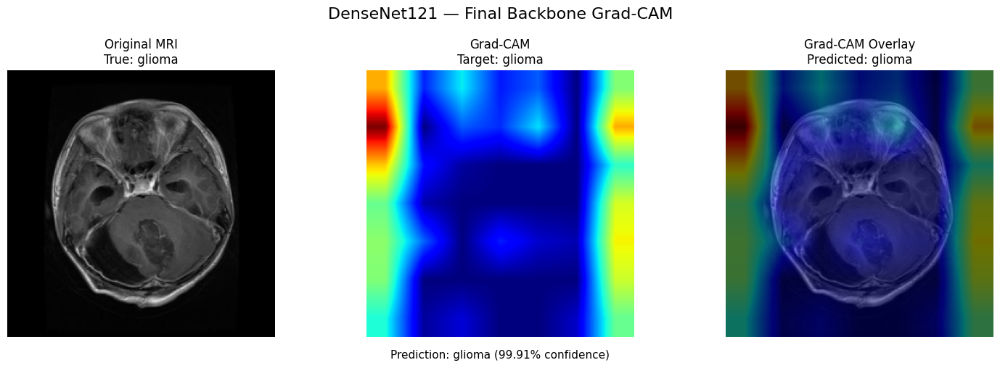


FILES SAVED
Figure        : D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\outputs\figures\gradcam\FINAL_BACKBONE_GRADCAM_SANITY_CHECK.png
Heatmap       : D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\outputs\figures\gradcam\FINAL_BACKBONE_GRADCAM_SANITY_CHECK.npy
Record        : D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\outputs\reports\gradcam\FINAL_BACKBONE_GRADCAM_SANITY_CHECK_RECORD.csv
Configuration : D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\outputs\reports\gradcam\FINAL_BACKBONE_GRADCAM_CONFIGURATION.json

STATUS: PASS


In [15]:
# ============================================================
# CELL 5 — FINAL BACKBONE GRAD-CAM
# SELF-CONTAINED VERSION
# ============================================================

print("=" * 70)
print("FINAL BACKBONE GRAD-CAM")
print("=" * 70)

# ============================================================
# 1. VERIFY REQUIRED VARIABLES
# ============================================================

required_variables = [
    "final_model",
    "densenet_backbone",
    "classifier_layers",
    "sample_array",
    "sample_record",
    "CLASS_NAMES",
    "FINAL_MODEL_PATH",
    "GRADCAM_OUTPUT_DIR",
    "GRADCAM_REPORT_DIR",
    "LAST_CONV_LAYER_NAME"
]

missing_variables = [
    variable
    for variable in required_variables
    if variable not in globals()
]

assert len(missing_variables) == 0, (
    "Missing notebook variables: "
    + ", ".join(missing_variables)
)

print("Required variables: PASS")

# ============================================================
# 2. CREATE BACKBONE FEATURE MODEL
# ============================================================

backbone_feature_model = keras.models.Model(
    inputs=densenet_backbone.input,
    outputs=densenet_backbone.output,
    name="DenseNet121_Final_Backbone_Features"
)

print(
    f"DenseNet backbone : {densenet_backbone.name}"
)

print(
    f"Feature output    : "
    f"{densenet_backbone.output.shape}"
)

assert densenet_backbone.output.shape == (
    None,
    7,
    7,
    1024
)

print("Backbone feature model: PASS")

# ============================================================
# 3. DEFINE COMPLETE GRAD-CAM FUNCTION
# ============================================================

def make_backbone_gradcam(
    image_array,
    target_class_index=None
):
    """
    Conventional Grad-CAM using the final DenseNet121
    backbone representation.

    Feature representation:
        7 x 7 x 1024

    Steps:
        1. Forward image through DenseNet backbone
        2. Forward backbone features through classifier
        3. Select target class
        4. Calculate gradients
        5. Global-average-pool gradients
        6. Weight feature maps
        7. Apply ReLU
        8. Normalize
        9. Upsample to 224 x 224
    """

    image_array = np.asarray(
        image_array,
        dtype=np.float32
    )

    assert image_array.shape == (
        224,
        224,
        3
    ), (
        f"Expected (224,224,3), "
        f"got {image_array.shape}"
    )

    assert np.isfinite(
        image_array
    ).all()

    input_tensor = tf.convert_to_tensor(
        image_array[np.newaxis, ...],
        dtype=tf.float32
    )

    # --------------------------------------------------------
    # Forward pass
    # --------------------------------------------------------

    with tf.GradientTape() as tape:

        # Backbone feature representation
        backbone_features = (
            backbone_feature_model(
                input_tensor,
                training=False
            )
        )

        # Keep this tensor connected to the graph
        tape.watch(backbone_features)

        # ----------------------------------------------------
        # Exact trained classifier
        # ----------------------------------------------------

        x = backbone_features

        for layer in classifier_layers:

            if isinstance(
                layer,
                keras.layers.BatchNormalization
            ):

                x = layer(
                    x,
                    training=False
                )

            elif isinstance(
                layer,
                keras.layers.Dropout
            ):

                x = layer(
                    x,
                    training=False
                )

            else:

                x = layer(x)

        predictions = x

        # ----------------------------------------------------
        # Target class
        # ----------------------------------------------------

        predicted_class_tensor = tf.argmax(
            predictions[0]
        )

        if target_class_index is None:

            target_class_tensor = (
                predicted_class_tensor
            )

        else:

            target_class_tensor = tf.constant(
                int(target_class_index),
                dtype=tf.int64
            )

        class_score = predictions[
            :,
            target_class_tensor
        ]

    # ========================================================
    # GRADIENT OF CLASS SCORE
    # ========================================================

    gradients = tape.gradient(
        class_score,
        backbone_features
    )

    assert gradients is not None, (
        "Grad-CAM gradient is None."
    )

    # ========================================================
    # REMOVE BATCH DIMENSION
    # ========================================================

    feature_maps = backbone_features[0]
    gradients = gradients[0]

    # ========================================================
    # GLOBAL AVERAGE POOLING OF GRADIENTS
    # ========================================================

    weights = tf.reduce_mean(
        gradients,
        axis=(0, 1)
    )

    # ========================================================
    # WEIGHT FEATURE MAPS
    # ========================================================

    heatmap = tf.reduce_sum(
        feature_maps * weights,
        axis=-1
    )

    # ========================================================
    # RELU
    # ========================================================

    heatmap = tf.maximum(
        heatmap,
        0
    )

    # ========================================================
    # NORMALIZE
    # ========================================================

    heatmap_max = tf.reduce_max(
        heatmap
    )

    heatmap = tf.where(
        heatmap_max > 0,
        heatmap / heatmap_max,
        tf.zeros_like(heatmap)
    )

    # ========================================================
    # UPSAMPLE 7x7 → 224x224
    # ========================================================

    heatmap = tf.image.resize(
        heatmap[..., tf.newaxis],
        (224, 224),
        method="bilinear"
    )

    heatmap = tf.squeeze(
        heatmap,
        axis=-1
    )

    heatmap = heatmap.numpy()

    predictions_np = (
        predictions[0].numpy()
    )

    predicted_class = int(
        tf.argmax(
            predictions[0]
        ).numpy()
    )

    target_class = int(
        target_class_tensor.numpy()
    )

    return (
        heatmap.astype(np.float32),
        predictions_np.astype(np.float32),
        predicted_class,
        target_class
    )


print(
    "Grad-CAM function definition: PASS"
)

# ============================================================
# 4. RUN GRAD-CAM
# ============================================================

print("\n" + "=" * 70)
print("CALCULATING GRAD-CAM")
print("=" * 70)

(
    backbone_gradcam_heatmap,
    backbone_gradcam_probabilities,
    backbone_gradcam_predicted,
    backbone_gradcam_target
) = make_backbone_gradcam(
    sample_array
)

print(
    "Grad-CAM calculation: PASS"
)

# ============================================================
# 5. VERIFY ORIGINAL MODEL PREDICTION
# ============================================================

test_tensor = tf.convert_to_tensor(
    sample_array[np.newaxis, ...],
    dtype=tf.float32
)

original_prediction = (
    final_model(
        test_tensor,
        training=False
    )
    .numpy()[0]
)

prediction_difference = float(
    np.max(
        np.abs(
            original_prediction -
            backbone_gradcam_probabilities
        )
    )
)

print("\nPREDICTION VERIFICATION")
print("-" * 70)

print(
    f"Maximum probability difference: "
    f"{prediction_difference:.12f}"
)

assert prediction_difference < 1e-6, (
    "Grad-CAM classifier prediction differs "
    "from original final model."
)

print(
    "Prediction reconstruction: PASS"
)

# ============================================================
# 6. CLASS INFORMATION
# ============================================================

true_class = sample_record[
    "tumor_label"
]

predicted_class_name = CLASS_NAMES[
    backbone_gradcam_predicted
]

target_class_name = CLASS_NAMES[
    backbone_gradcam_target
]

confidence = float(
    backbone_gradcam_probabilities[
        backbone_gradcam_predicted
    ] * 100
)

# ============================================================
# 7. PRINT RESULTS
# ============================================================

print("\nPREDICTION")
print("-" * 70)

print(
    f"True class      : {true_class}"
)

print(
    f"Predicted class : {predicted_class_name}"
)

print(
    f"Confidence      : {confidence:.4f}%"
)

print(
    f"Grad-CAM target : {target_class_name}"
)

print("\nCLASS PROBABILITIES")
print("-" * 70)

for class_name, probability in zip(
    CLASS_NAMES,
    backbone_gradcam_probabilities
):

    print(
        f"{class_name:12s}: "
        f"{probability * 100:8.4f}%"
    )

# ============================================================
# 8. HEATMAP VERIFICATION
# ============================================================

heatmap_min = float(
    backbone_gradcam_heatmap.min()
)

heatmap_max = float(
    backbone_gradcam_heatmap.max()
)

heatmap_mean = float(
    backbone_gradcam_heatmap.mean()
)

print("\nHEATMAP VERIFICATION")
print("-" * 70)

print(
    f"Shape : {backbone_gradcam_heatmap.shape}"
)

print(
    f"Min   : {heatmap_min:.6f}"
)

print(
    f"Max   : {heatmap_max:.6f}"
)

print(
    f"Mean  : {heatmap_mean:.6f}"
)

assert backbone_gradcam_heatmap.shape == (
    224,
    224
)

assert np.isfinite(
    backbone_gradcam_heatmap
).all()

assert heatmap_min >= 0
assert heatmap_max <= 1.000001

print(
    "Heatmap verification: PASS"
)

# ============================================================
# 9. CREATE VISUALIZATION
# ============================================================

fig, axes = plt.subplots(
    1,
    3,
    figsize=(15, 5)
)

# ------------------------------------------------------------
# Original MRI
# ------------------------------------------------------------

axes[0].imshow(
    sample_array
)

axes[0].set_title(
    f"Original MRI\n"
    f"True: {true_class}"
)

axes[0].axis("off")

# ------------------------------------------------------------
# Grad-CAM
# ------------------------------------------------------------

axes[1].imshow(
    backbone_gradcam_heatmap,
    cmap="jet"
)

axes[1].set_title(
    f"Grad-CAM\n"
    f"Target: {target_class_name}"
)

axes[1].axis("off")

# ------------------------------------------------------------
# Overlay
# ------------------------------------------------------------

axes[2].imshow(
    sample_array
)

axes[2].imshow(
    backbone_gradcam_heatmap,
    cmap="jet",
    alpha=0.45
)

axes[2].set_title(
    f"Grad-CAM Overlay\n"
    f"Predicted: {predicted_class_name}"
)

axes[2].axis("off")

# ============================================================
# 10. FIGURE TITLE
# ============================================================

fig.suptitle(
    "DenseNet121 — Final Backbone Grad-CAM",
    fontsize=16
)

fig.text(
    0.5,
    0.01,
    f"Prediction: {predicted_class_name} "
    f"({confidence:.2f}% confidence)",
    ha="center",
    fontsize=11
)

plt.tight_layout(
    rect=[0, 0.04, 1, 0.95]
)

# ============================================================
# 11. SAVE FIGURE
# ============================================================

figure_path = (
    GRADCAM_OUTPUT_DIR /
    "FINAL_BACKBONE_GRADCAM_SANITY_CHECK.png"
)

fig.savefig(
    figure_path,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

plt.close(fig)

# ============================================================
# 12. SAVE RAW HEATMAP
# ============================================================

heatmap_path = (
    GRADCAM_OUTPUT_DIR /
    "FINAL_BACKBONE_GRADCAM_SANITY_CHECK.npy"
)

np.save(
    heatmap_path,
    backbone_gradcam_heatmap
)

# ============================================================
# 13. SAVE RECORD
# ============================================================

record = pd.DataFrame([
    {
        "filename":
            sample_record["filename"],

        "processed_filename":
            sample_record["processed_filename"],

        "true_class":
            true_class,

        "predicted_class":
            predicted_class_name,

        "prediction_confidence":
            float(confidence / 100),

        "target_class":
            target_class_name,

        "mri_plane":
            sample_record["plane_label"],

        "gradcam_method":
            "Grad-CAM",

        "gradcam_feature_representation":
            "DenseNet121 final backbone output",

        "feature_shape":
            "7x7x1024",

        "heatmap_shape":
            "224x224",

        "heatmap_min":
            heatmap_min,

        "heatmap_max":
            heatmap_max,

        "heatmap_mean":
            heatmap_mean,

        "prediction_difference":
            prediction_difference,

        "training_performed":
            False,

        "model_modified":
            False,

        "status":
            "PASS"
    }
])

record_path = (
    GRADCAM_REPORT_DIR /
    "FINAL_BACKBONE_GRADCAM_SANITY_CHECK_RECORD.csv"
)

record.to_csv(
    record_path,
    index=False
)

# ============================================================
# 14. SAVE CONFIGURATION
# ============================================================

configuration = {
    "method": "Grad-CAM",
    "model": "DenseNet121",
    "model_path": str(FINAL_MODEL_PATH),
    "target_layer": LAST_CONV_LAYER_NAME,
    "feature_representation": "final DenseNet121 backbone output",
    "feature_shape": "7x7x1024",
    "heatmap_shape": "224x224",
    "class_names": CLASS_NAMES,
    "prediction_reconstruction_max_difference":
        prediction_difference,
    "training_performed": False,
    "model_modified": False,
    "official_test_evaluation_modified": False,
    "tensorflow_version": tf.__version__,
    "numpy_version": np.__version__,
    "random_seed": SEED
}

configuration_path = (
    GRADCAM_REPORT_DIR /
    "FINAL_BACKBONE_GRADCAM_CONFIGURATION.json"
)

with open(
    configuration_path,
    "w",
    encoding="utf-8"
) as f:

    json.dump(
        configuration,
        f,
        indent=4
    )

# ============================================================
# FINAL STATUS
# ============================================================

print("\n" + "=" * 70)
print("FILES SAVED")
print("=" * 70)

print(
    f"Figure        : {figure_path}"
)

print(
    f"Heatmap       : {heatmap_path}"
)

print(
    f"Record        : {record_path}"
)

print(
    f"Configuration : {configuration_path}"
)

print("\n" + "=" * 70)
print("STATUS: PASS")
print("=" * 70)

LOGIT-BASED TRUE GRAD-CAM
Required objects: PASS

CLASSIFIER STRUCTURE
----------------------------------------------------------------------
 1. global_average_pooling                        GlobalAveragePooling2D
 2. classifier_batch_normalization                BatchNormalization
 3. classifier_dropout                            Dropout
 4. classifier_dense                              Dense
 5. classifier_dropout_2                          Dropout
 6. predictions                                   Dense

Final classifier layer:
Name       : predictions
Units      : 4
Activation : <function softmax at 0x0000027039FBE440>

BACKBONE
----------------------------------------------------------------------
Input shape  : (None, 224, 224, 3)
Output shape : (None, 7, 7, 1024)
Backbone verification: PASS

TESTING LOGIT FORWARD PASS
Feature maps : (1, 7, 7, 1024)
Logits       : (1, 4)
Probabilities: (1, 4)
Logit forward-pass verification: PASS

PROBABILITY RECONSTRUCTION
----------------------

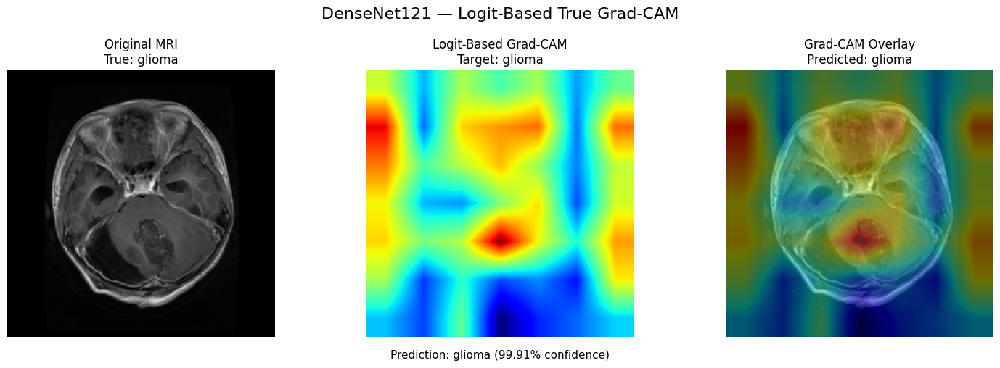


FILES SAVED
Figure        : D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\outputs\figures\gradcam\LOGIT_BASED_TRUE_GRADCAM_SANITY_CHECK.png
Heatmap       : D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\outputs\figures\gradcam\LOGIT_BASED_TRUE_GRADCAM_SANITY_CHECK.npy
Record        : D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\outputs\reports\gradcam\LOGIT_BASED_TRUE_GRADCAM_SANITY_CHECK_RECORD.csv
Configuration : D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\outputs\reports\gradcam\LOGIT_BASED_TRUE_GRADCAM_CONFIGURATION.json

LOGIT-BASED TRUE GRAD-CAM STATUS: PASS


In [16]:
# ============================================================
# CELL 6 — LOGIT-BASED TRUE GRAD-CAM
# ============================================================
#
# This implementation calculates:
#
#       d(logit_class) / d(feature_maps)
#
# instead of:
#
#       d(softmax_probability) / d(feature_maps)
#
# This is the standard formulation we want for the thesis.
# ============================================================

print("=" * 70)
print("LOGIT-BASED TRUE GRAD-CAM")
print("=" * 70)

# ============================================================
# 1. VERIFY REQUIRED OBJECTS
# ============================================================

required_objects = [
    "final_model",
    "densenet_backbone",
    "classifier_layers",
    "sample_array",
    "sample_record",
    "CLASS_NAMES",
    "GRADCAM_OUTPUT_DIR",
    "GRADCAM_REPORT_DIR"
]

missing_objects = [
    name
    for name in required_objects
    if name not in globals()
]

assert len(missing_objects) == 0, (
    "Missing required variables: "
    + ", ".join(missing_objects)
)

print("Required objects: PASS")

# ============================================================
# 2. IDENTIFY CLASSIFIER LAYERS
# ============================================================

print("\nCLASSIFIER STRUCTURE")
print("-" * 70)

for i, layer in enumerate(classifier_layers):

    print(
        f"{i + 1:2d}. "
        f"{layer.name:45s} "
        f"{type(layer).__name__}"
    )

# ============================================================
# 3. IDENTIFY FINAL DENSE CLASSIFIER
# ============================================================

final_classifier = classifier_layers[-1]

assert isinstance(
    final_classifier,
    keras.layers.Dense
), (
    "The final classifier layer is not a Dense layer."
)

print("\nFinal classifier layer:")
print(
    f"Name       : {final_classifier.name}"
)

print(
    f"Units      : {final_classifier.units}"
)

print(
    f"Activation : {final_classifier.activation}"
)

assert final_classifier.units == 4

# ============================================================
# 4. BUILD BACKBONE FEATURE MODEL
# ============================================================

backbone_feature_model = keras.models.Model(
    inputs=densenet_backbone.input,
    outputs=densenet_backbone.output,
    name="DenseNet121_Final_Backbone_Features"
)

print("\nBACKBONE")
print("-" * 70)

print(
    f"Input shape  : "
    f"{backbone_feature_model.input_shape}"
)

print(
    f"Output shape : "
    f"{backbone_feature_model.output_shape}"
)

assert backbone_feature_model.output_shape == (
    None,
    7,
    7,
    1024
)

print("Backbone verification: PASS")

# ============================================================
# 5. BUILD LOGIT FORWARD PASS
# ============================================================

def forward_logits_for_gradcam(
    input_tensor
):
    """
    Forward pass that returns:

        1. final DenseNet backbone feature maps
        2. pre-softmax classification logits
        3. softmax probabilities

    The logits are reconstructed from the trained final Dense
    layer's kernel and bias.

    This avoids differentiating through the softmax.
    """

    # --------------------------------------------------------
    # DenseNet backbone
    # --------------------------------------------------------

    backbone_features = (
        backbone_feature_model(
            input_tensor,
            training=False
        )
    )

    # --------------------------------------------------------
    # Classification head EXCEPT final Dense layer
    # --------------------------------------------------------

    x = backbone_features

    for layer in classifier_layers[:-1]:

        if isinstance(
            layer,
            keras.layers.BatchNormalization
        ):

            x = layer(
                x,
                training=False
            )

        elif isinstance(
            layer,
            keras.layers.Dropout
        ):

            x = layer(
                x,
                training=False
            )

        else:

            x = layer(x)

    # --------------------------------------------------------
    # Final Dense layer
    #
    # We manually calculate:
    #
    # logits = xW + b
    #
    # instead of applying its softmax activation.
    # --------------------------------------------------------

    kernel = final_classifier.kernel
    bias = final_classifier.bias

    logits = tf.linalg.matmul(
        x,
        kernel
    ) + bias

    # --------------------------------------------------------
    # Convert logits to probabilities only for verification
    # --------------------------------------------------------

    probabilities = tf.nn.softmax(
        logits,
        axis=-1
    )

    return (
        backbone_features,
        logits,
        probabilities
    )


# ============================================================
# 6. TEST LOGIT FORWARD PASS
# ============================================================

print("\n" + "=" * 70)
print("TESTING LOGIT FORWARD PASS")
print("=" * 70)

test_tensor = tf.convert_to_tensor(
    sample_array[np.newaxis, ...],
    dtype=tf.float32
)

(
    test_features,
    test_logits,
    test_probabilities
) = forward_logits_for_gradcam(
    test_tensor
)

print(
    f"Feature maps : {test_features.shape}"
)

print(
    f"Logits       : {test_logits.shape}"
)

print(
    f"Probabilities: {test_probabilities.shape}"
)

assert test_features.shape == (
    1,
    7,
    7,
    1024
)

assert test_logits.shape == (
    1,
    4
)

assert test_probabilities.shape == (
    1,
    4
)

print(
    "Logit forward-pass verification: PASS"
)

# ============================================================
# 7. VERIFY RECONSTRUCTED PROBABILITIES
#    AGAINST ORIGINAL FINAL MODEL
# ============================================================

original_probabilities = (
    final_model(
        test_tensor,
        training=False
    )
    .numpy()[0]
)

reconstructed_probabilities = (
    test_probabilities
    .numpy()[0]
)

probability_difference = float(
    np.max(
        np.abs(
            original_probabilities -
            reconstructed_probabilities
        )
    )
)

print("\nPROBABILITY RECONSTRUCTION")
print("-" * 70)

print(
    f"Maximum probability difference: "
    f"{probability_difference:.12f}"
)

assert probability_difference < 1e-6, (
    "Reconstructed logits/classifier do not reproduce "
    "the original model probabilities."
)

print(
    "Original model probability reproduction: PASS"
)

# ============================================================
# 8. DEFINE LOGIT-BASED GRAD-CAM
# ============================================================

def make_logit_gradcam(
    image_array,
    target_class_index=None
):
    """
    Conventional Grad-CAM based on the pre-softmax class logit.

    Formula:

        alpha_k^c =
            GlobalAveragePool(
                d y^c / d A^k
            )

        L_GradCAM^c =
            ReLU(
                sum_k alpha_k^c A^k
            )

    where y^c is the class logit.
    """

    image_array = np.asarray(
        image_array,
        dtype=np.float32
    )

    assert image_array.shape == (
        224,
        224,
        3
    ), (
        f"Expected (224,224,3), "
        f"got {image_array.shape}"
    )

    assert np.isfinite(
        image_array
    ).all()

    input_tensor = tf.convert_to_tensor(
        image_array[np.newaxis, ...],
        dtype=tf.float32
    )

    # --------------------------------------------------------
    # Gradient tape
    # --------------------------------------------------------

    with tf.GradientTape() as tape:

        # -----------------------------------------------
        # Backbone feature representation
        # -----------------------------------------------

        backbone_features, logits, probabilities = (
            forward_logits_for_gradcam(
                input_tensor
            )
        )

        # -----------------------------------------------
        # Determine target class
        # -----------------------------------------------

        predicted_class_tensor = tf.argmax(
            logits[0]
        )

        if target_class_index is None:

            target_class_tensor = (
                predicted_class_tensor
            )

        else:

            target_class_tensor = tf.constant(
                int(target_class_index),
                dtype=tf.int64
            )

        # -----------------------------------------------
        # PRE-SOFTMAX CLASS LOGIT
        # -----------------------------------------------

        target_logit = logits[
            :,
            target_class_tensor
        ]

    # --------------------------------------------------------
    # Gradient:
    #
    # d(class logit) / d(backbone features)
    # --------------------------------------------------------

    gradients = tape.gradient(
        target_logit,
        backbone_features
    )

    assert gradients is not None, (
        "Logit-based Grad-CAM gradient is None."
    )

    # --------------------------------------------------------
    # Remove batch dimension
    # --------------------------------------------------------

    feature_maps = backbone_features[0]
    gradients = gradients[0]

    # ========================================================
    # GLOBAL AVERAGE POOLING OF GRADIENTS
    # ========================================================

    weights = tf.reduce_mean(
        gradients,
        axis=(0, 1)
    )

    # ========================================================
    # WEIGHTED FEATURE MAP SUM
    # ========================================================

    heatmap = tf.reduce_sum(
        feature_maps * weights,
        axis=-1
    )

    # ========================================================
    # RELU
    # ========================================================

    heatmap = tf.maximum(
        heatmap,
        0
    )

    # ========================================================
    # NORMALIZATION
    # ========================================================

    heatmap_max = tf.reduce_max(
        heatmap
    )

    heatmap = tf.where(
        heatmap_max > 0,
        heatmap / heatmap_max,
        tf.zeros_like(heatmap)
    )

    # ========================================================
    # UPSAMPLE 7x7 → 224x224
    # ========================================================

    heatmap = tf.image.resize(
        heatmap[..., tf.newaxis],
        (224, 224),
        method="bilinear"
    )

    heatmap = tf.squeeze(
        heatmap,
        axis=-1
    )

    heatmap = heatmap.numpy()

    logits_np = logits[0].numpy()
    probabilities_np = probabilities[0].numpy()

    predicted_class = int(
        tf.argmax(
            logits[0]
        ).numpy()
    )

    target_class = int(
        target_class_tensor.numpy()
    )

    return (
        heatmap.astype(np.float32),
        logits_np.astype(np.float32),
        probabilities_np.astype(np.float32),
        predicted_class,
        target_class
    )


print(
    "\nLogit-based Grad-CAM function: PASS"
)

# ============================================================
# 9. RUN LOGIT-BASED GRAD-CAM
# ============================================================

print("\n" + "=" * 70)
print("RUNNING LOGIT-BASED TRUE GRAD-CAM")
print("=" * 70)

(
    logit_gradcam_heatmap,
    logit_gradcam_logits,
    logit_gradcam_probabilities,
    logit_gradcam_predicted,
    logit_gradcam_target
) = make_logit_gradcam(
    sample_array
)

print(
    "Gradient calculation: PASS"
)

# ============================================================
# 10. PREDICTION INFORMATION
# ============================================================

true_class = sample_record[
    "tumor_label"
]

predicted_class_name = CLASS_NAMES[
    logit_gradcam_predicted
]

target_class_name = CLASS_NAMES[
    logit_gradcam_target
]

confidence = float(
    logit_gradcam_probabilities[
        logit_gradcam_predicted
    ] * 100
)

print("\nPREDICTION")
print("-" * 70)

print(
    f"True class      : {true_class}"
)

print(
    f"Predicted class : {predicted_class_name}"
)

print(
    f"Confidence      : {confidence:.4f}%"
)

print(
    f"Target class    : {target_class_name}"
)

# ============================================================
# 11. CLASS PROBABILITIES
# ============================================================

print("\nCLASS PROBABILITIES")
print("-" * 70)

for class_name, probability in zip(
    CLASS_NAMES,
    logit_gradcam_probabilities
):

    print(
        f"{class_name:12s}: "
        f"{probability * 100:8.4f}%"
    )

# ============================================================
# 12. CLASS LOGITS
# ============================================================

print("\nCLASS LOGITS")
print("-" * 70)

for class_name, logit in zip(
    CLASS_NAMES,
    logit_gradcam_logits
):

    print(
        f"{class_name:12s}: "
        f"{logit:12.6f}"
    )

# ============================================================
# 13. HEATMAP VERIFICATION
# ============================================================

heatmap_min = float(
    logit_gradcam_heatmap.min()
)

heatmap_max = float(
    logit_gradcam_heatmap.max()
)

heatmap_mean = float(
    logit_gradcam_heatmap.mean()
)

print("\nHEATMAP VERIFICATION")
print("-" * 70)

print(
    f"Shape : {logit_gradcam_heatmap.shape}"
)

print(
    f"Min   : {heatmap_min:.6f}"
)

print(
    f"Max   : {heatmap_max:.6f}"
)

print(
    f"Mean  : {heatmap_mean:.6f}"
)

assert logit_gradcam_heatmap.shape == (
    224,
    224
)

assert np.isfinite(
    logit_gradcam_heatmap
).all()

assert heatmap_min >= 0
assert heatmap_max <= 1.000001

print(
    "Heatmap verification: PASS"
)

# ============================================================
# 14. CREATE THESIS-QUALITY FIGURE
# ============================================================

fig, axes = plt.subplots(
    1,
    3,
    figsize=(15, 5)
)

# ------------------------------------------------------------
# Original MRI
# ------------------------------------------------------------

axes[0].imshow(
    sample_array
)

axes[0].set_title(
    f"Original MRI\n"
    f"True: {true_class}"
)

axes[0].axis("off")

# ------------------------------------------------------------
# Logit Grad-CAM
# ------------------------------------------------------------

axes[1].imshow(
    logit_gradcam_heatmap,
    cmap="jet"
)

axes[1].set_title(
    f"Logit-Based Grad-CAM\n"
    f"Target: {target_class_name}"
)

axes[1].axis("off")

# ------------------------------------------------------------
# Overlay
# ------------------------------------------------------------

axes[2].imshow(
    sample_array
)

axes[2].imshow(
    logit_gradcam_heatmap,
    cmap="jet",
    alpha=0.45
)

axes[2].set_title(
    f"Grad-CAM Overlay\n"
    f"Predicted: {predicted_class_name}"
)

axes[2].axis("off")

# ============================================================
# 15. FIGURE TITLE
# ============================================================

fig.suptitle(
    "DenseNet121 — Logit-Based True Grad-CAM",
    fontsize=16
)

fig.text(
    0.5,
    0.01,
    f"Prediction: {predicted_class_name} "
    f"({confidence:.2f}% confidence)",
    ha="center",
    fontsize=11
)

plt.tight_layout(
    rect=[0, 0.04, 1, 0.95]
)

# ============================================================
# 16. SAVE FIGURE
# ============================================================

logit_gradcam_figure_path = (
    GRADCAM_OUTPUT_DIR /
    "LOGIT_BASED_TRUE_GRADCAM_SANITY_CHECK.png"
)

fig.savefig(
    logit_gradcam_figure_path,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

plt.close(fig)

# ============================================================
# 17. SAVE RAW HEATMAP
# ============================================================

logit_gradcam_heatmap_path = (
    GRADCAM_OUTPUT_DIR /
    "LOGIT_BASED_TRUE_GRADCAM_SANITY_CHECK.npy"
)

np.save(
    logit_gradcam_heatmap_path,
    logit_gradcam_heatmap
)

# ============================================================
# 18. SAVE RECORD
# ============================================================

logit_gradcam_record = pd.DataFrame([
    {
        "filename":
            sample_record["filename"],

        "processed_filename":
            sample_record["processed_filename"],

        "true_class":
            true_class,

        "predicted_class":
            predicted_class_name,

        "prediction_confidence":
            float(
                confidence / 100
            ),

        "target_class":
            target_class_name,

        "mri_plane":
            sample_record["plane_label"],

        "method":
            "Logit-Based Grad-CAM",

        "gradient_target":
            "Pre-softmax class logit",

        "feature_representation":
            "DenseNet121 final backbone output",

        "feature_shape":
            "7x7x1024",

        "heatmap_shape":
            "224x224",

        "heatmap_min":
            heatmap_min,

        "heatmap_max":
            heatmap_max,

        "heatmap_mean":
            heatmap_mean,

        "prediction_reconstruction_difference":
            probability_difference,

        "training_performed":
            False,

        "model_modified":
            False,

        "status":
            "PASS"
    }
])

logit_gradcam_record_path = (
    GRADCAM_REPORT_DIR /
    "LOGIT_BASED_TRUE_GRADCAM_SANITY_CHECK_RECORD.csv"
)

logit_gradcam_record.to_csv(
    logit_gradcam_record_path,
    index=False
)

# ============================================================
# 19. SAVE CONFIGURATION
# ============================================================

logit_gradcam_config = {

    "method":
        "Grad-CAM",

    "gradient_target":
        "Pre-softmax class logit",

    "model":
        "DenseNet121",

    "model_path":
        str(FINAL_MODEL_PATH),

    "feature_representation":
        "Final DenseNet121 backbone output",

    "feature_shape":
        "7x7x1024",

    "heatmap_shape":
        "224x224",

    "class_names":
        CLASS_NAMES,

    "target_class":
        target_class_name,

    "prediction_reconstruction_difference":
        probability_difference,

    "training_performed":
        False,

    "model_modified":
        False,

    "official_test_evaluation_modified":
        False,

    "tensorflow_version":
        tf.__version__,

    "numpy_version":
        np.__version__,

    "random_seed":
        SEED
}

logit_gradcam_config_path = (
    GRADCAM_REPORT_DIR /
    "LOGIT_BASED_TRUE_GRADCAM_CONFIGURATION.json"
)

with open(
    logit_gradcam_config_path,
    "w",
    encoding="utf-8"
) as f:

    json.dump(
        logit_gradcam_config,
        f,
        indent=4
    )

# ============================================================
# FINAL STATUS
# ============================================================

print("\n" + "=" * 70)
print("FILES SAVED")
print("=" * 70)

print(
    f"Figure        : {logit_gradcam_figure_path}"
)

print(
    f"Heatmap       : {logit_gradcam_heatmap_path}"
)

print(
    f"Record        : {logit_gradcam_record_path}"
)

print(
    f"Configuration : {logit_gradcam_config_path}"
)

print("\n" + "=" * 70)
print("LOGIT-BASED TRUE GRAD-CAM STATUS: PASS")
print("=" * 70)

CREATING 12-IMAGE GRAD-CAM VALIDATION FIGURE
Images   : 12
Heatmaps : 12
Records  : 12
Input verification: PASS


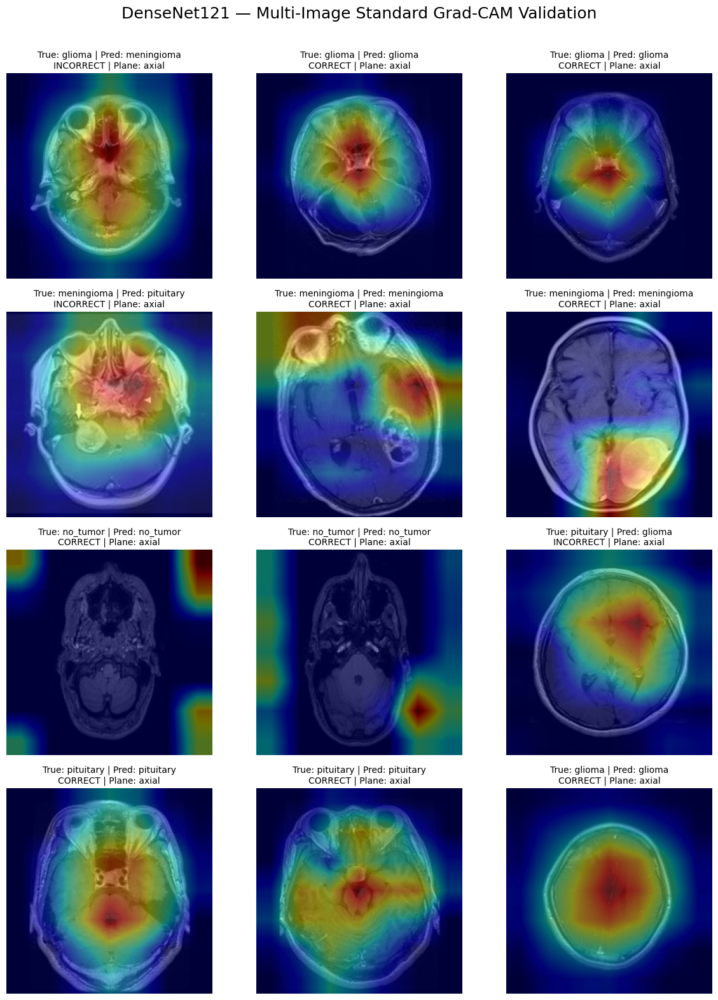


GRAD-CAM VALIDATION SUMMARY
Total images : 12
Correct      : 9
Incorrect    : 3
Heatmap size : (12, 224, 224)

FILES SAVED
----------------------------------------------------------------------
Figure        : D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\outputs\figures\gradcam\MULTI_IMAGE_STANDARD_GRADCAM_VALIDATION.png
Results CSV   : D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\outputs\reports\gradcam\MULTI_IMAGE_STANDARD_GRADCAM_VALIDATION.csv
Heatmaps      : D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\outputs\figures\gradcam\MULTI_IMAGE_STANDARD_GRADCAM_HEATMAPS.npy
Selected CSV  : D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\outputs\reports\gradcam\MULTI_IMAGE_GRADCAM_SELECTED_TEST_IMAGES.csv

STATUS: PASS


In [18]:
# ============================================================
# CELL 8 — VISUALIZE 12-IMAGE GRAD-CAM VALIDATION
# ============================================================

print("=" * 70)
print("CREATING 12-IMAGE GRAD-CAM VALIDATION FIGURE")
print("=" * 70)

# ============================================================
# 1. VERIFY EXISTING RESULTS
# ============================================================

assert len(images) == 12, (
    f"Expected 12 images, found {len(images)}"
)

assert len(heatmaps) == 12, (
    f"Expected 12 heatmaps, found {len(heatmaps)}"
)

assert len(selected_df) == 12, (
    f"Expected 12 selected records, found {len(selected_df)}"
)

print(
    f"Images   : {len(images)}"
)

print(
    f"Heatmaps : {len(heatmaps)}"
)

print(
    f"Records  : {len(selected_df)}"
)

print(
    "Input verification: PASS"
)

# ============================================================
# 2. CREATE 4 × 3 FIGURE
# ============================================================

fig, axes = plt.subplots(
    4,
    3,
    figsize=(12, 16)
)

# IMPORTANT:
# Convert the 4×3 axes array into a flat 12-element array.

axes = axes.ravel()

# ============================================================
# 3. PLOT ALL 12 IMAGES
# ============================================================

for i in range(12):

    ax = axes[i]

    row = selected_df.iloc[i]

    # --------------------------------------------------------
    # Original MRI
    # --------------------------------------------------------

    ax.imshow(
        images[i]
    )

    # --------------------------------------------------------
    # Grad-CAM overlay
    # --------------------------------------------------------

    ax.imshow(
        heatmaps[i],
        cmap="jet",
        alpha=0.45
    )

    # --------------------------------------------------------
    # Prediction status
    # --------------------------------------------------------

    if bool(row["correct"]):

        status_text = "CORRECT"

    else:

        status_text = "INCORRECT"

    # --------------------------------------------------------
    # Title
    # --------------------------------------------------------

    ax.set_title(
        f"True: {row['tumor_label']} | "
        f"Pred: {row['predicted_class']}\n"
        f"{status_text} | "
        f"Plane: {row['plane_label']}",
        fontsize=10
    )

    ax.axis("off")

# ============================================================
# 4. OVERALL FIGURE TITLE
# ============================================================

fig.suptitle(
    "DenseNet121 — Multi-Image Standard Grad-CAM Validation",
    fontsize=18
)

plt.tight_layout(
    rect=[0, 0, 1, 0.97]
)

# ============================================================
# 5. SAVE FIGURE
# ============================================================

multi_gradcam_path = (
    GRADCAM_OUTPUT_DIR /
    "MULTI_IMAGE_STANDARD_GRADCAM_VALIDATION.png"
)

fig.savefig(
    multi_gradcam_path,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

plt.close(fig)

# ============================================================
# 6. SAVE RESULTS CSV
# ============================================================

results_df = pd.DataFrame(
    results
)

results_csv_path = (
    GRADCAM_REPORT_DIR /
    "MULTI_IMAGE_STANDARD_GRADCAM_VALIDATION.csv"
)

results_df.to_csv(
    results_csv_path,
    index=False
)

# ============================================================
# 7. SAVE HEATMAP ARRAY
# ============================================================

heatmap_array = np.stack(
    heatmaps,
    axis=0
)

heatmap_npy_path = (
    GRADCAM_OUTPUT_DIR /
    "MULTI_IMAGE_STANDARD_GRADCAM_HEATMAPS.npy"
)

np.save(
    heatmap_npy_path,
    heatmap_array
)

# ============================================================
# 8. SAVE SELECTED TEST RECORDS
# ============================================================

selected_csv_path = (
    GRADCAM_REPORT_DIR /
    "MULTI_IMAGE_GRADCAM_SELECTED_TEST_IMAGES.csv"
)

selected_df.to_csv(
    selected_csv_path,
    index=False
)

# ============================================================
# 9. SUMMARY
# ============================================================

correct_count = int(
    selected_df["correct"].sum()
)

incorrect_count = int(
    len(selected_df) - correct_count
)

print("\n" + "=" * 70)
print("GRAD-CAM VALIDATION SUMMARY")
print("=" * 70)

print(
    f"Total images : {len(selected_df)}"
)

print(
    f"Correct      : {correct_count}"
)

print(
    f"Incorrect    : {incorrect_count}"
)

print(
    f"Heatmap size : {heatmap_array.shape}"
)

# ============================================================
# 10. SAVED FILES
# ============================================================

print("\nFILES SAVED")
print("-" * 70)

print(
    f"Figure        : {multi_gradcam_path}"
)

print(
    f"Results CSV   : {results_csv_path}"
)

print(
    f"Heatmaps      : {heatmap_npy_path}"
)

print(
    f"Selected CSV  : {selected_csv_path}"
)

print("\n" + "=" * 70)
print("STATUS: PASS")
print("=" * 70)

BALANCED 16-IMAGE GRAD-CAM VALIDATION
Required variables: PASS

AVAILABLE CLASS × PLANE COUNTS
----------------------------------------------------------------------
plane_label  axial  coronal  sagittal
tumor_label                          
glioma          85       81        88
meningioma     137       86        83
no_tumor        52       48        40
pituitary      124       90        86

SELECTED 16 TEST IMAGES
----------------------------------------------------------------------
 1. glioma       | axial    | glioma       | CORRECT   | brisc2025_test_00001_gl_ax_t1.jpg
 2. glioma       | coronal  | glioma       | CORRECT   | brisc2025_test_00086_gl_co_t1.jpg
 3. glioma       | sagittal | glioma       | CORRECT   | brisc2025_test_00167_gl_sa_t1.jpg
 4. glioma       | axial    | meningioma   | INCORRECT | brisc2025_test_00004_gl_ax_t1.jpg
 5. meningioma   | axial    | meningioma   | CORRECT   | brisc2025_test_00255_me_ax_t1.jpg
 6. meningioma   | coronal  | meningioma   | CORRECT   

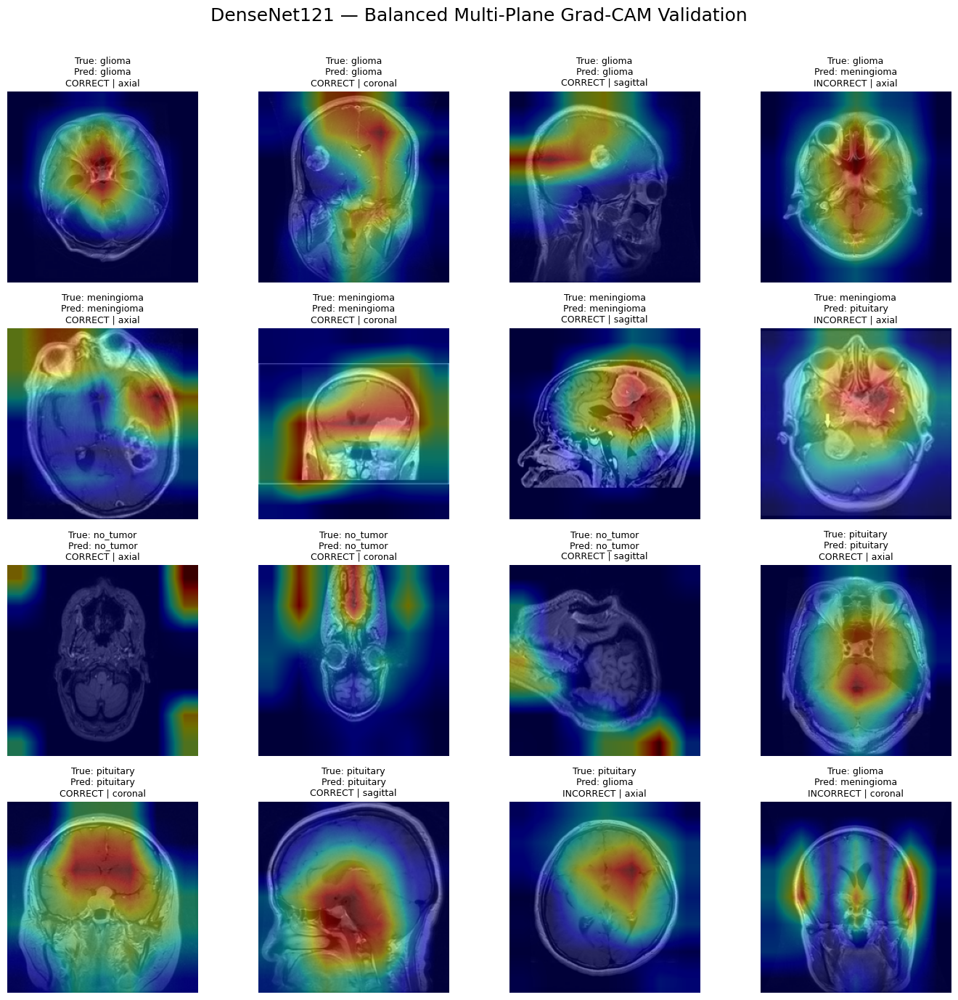


FILES SAVED
Figure        : D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\outputs\figures\gradcam\BALANCED_16_IMAGE_GRADCAM_VALIDATION.png
Results       : D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\outputs\reports\gradcam\BALANCED_16_IMAGE_GRADCAM_VALIDATION.csv
Selected data : D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\outputs\reports\gradcam\BALANCED_16_IMAGE_GRADCAM_SELECTED_IMAGES.csv
Heatmaps      : D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\outputs\figures\gradcam\BALANCED_16_IMAGE_GRADCAM_HEATMAPS.npy
Configuration : D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\outputs\reports\gradcam\BALANCED_16_IMAGE_GRADCAM_CONFIGURATION.json

BALANCED GRAD-CAM VALIDATION STATUS: PASS


In [19]:
# ============================================================
# CELL 9 — BALANCED 16-IMAGE GRAD-CAM VALIDATION
# ============================================================
#
# Purpose:
#   Validate model explanations across:
#
#       4 classes × multiple MRI planes
#
# Method:
#   Standard Grad-CAM using pre-softmax class logits
#
# Target layer:
#   conv5_block16_2_conv
#
# Feature map:
#   7 × 7 × 32
#
# IMPORTANT:
#   No training.
#   No model modification.
#   Official test set remains locked.
# ============================================================

print("=" * 70)
print("BALANCED 16-IMAGE GRAD-CAM VALIDATION")
print("=" * 70)

# ============================================================
# 1. VERIFY REQUIRED VARIABLES
# ============================================================

required_variables = [
    "analysis_df",
    "standard_logit_gradcam",
    "load_processed_test_image",
    "last_backbone_conv",
    "CLASS_NAMES",
    "GRADCAM_OUTPUT_DIR",
    "GRADCAM_REPORT_DIR"
]

missing_variables = [
    name
    for name in required_variables
    if name not in globals()
]

assert len(missing_variables) == 0, (
    "Missing variables: "
    + ", ".join(missing_variables)
)

print("Required variables: PASS")

# ============================================================
# 2. DISPLAY AVAILABLE CLASSES AND PLANES
# ============================================================

print("\nAVAILABLE CLASS × PLANE COUNTS")
print("-" * 70)

class_plane_table = pd.crosstab(
    analysis_df["tumor_label"],
    analysis_df["plane_label"]
)

print(
    class_plane_table.to_string()
)

# ============================================================
# 3. CREATE BALANCED SELECTION
# ============================================================
#
# For each class:
#
#   1 correct example per available plane
#
# If a plane does not contain a correct example,
# use an incorrect example.
#
# This gives us up to:
#
#   4 classes × 3 planes = 12
#
# We then add 4 informative incorrect examples,
# one per class where available.
#
# Total target = 16.
# ============================================================

selected_records_balanced = []

for class_name in CLASS_NAMES:

    class_df = analysis_df[
        analysis_df["tumor_label"] == class_name
    ].copy()

    available_planes = sorted(
        class_df["plane_label"]
        .dropna()
        .unique()
    )

    # --------------------------------------------------------
    # One example per plane
    # --------------------------------------------------------

    for plane in available_planes:

        plane_df = class_df[
            class_df["plane_label"] == plane
        ]

        correct_df = plane_df[
            plane_df["correct"] == True
        ]

        incorrect_df = plane_df[
            plane_df["correct"] == False
        ]

        if len(correct_df) > 0:

            selected_records_balanced.append(
                correct_df.iloc[0]
            )

        elif len(incorrect_df) > 0:

            selected_records_balanced.append(
                incorrect_df.iloc[0]
            )

    # --------------------------------------------------------
    # Add one incorrect example for this class
    # --------------------------------------------------------

    incorrect_all = class_df[
        class_df["correct"] == False
    ]

    if len(incorrect_all) > 0:

        selected_records_balanced.append(
            incorrect_all.iloc[0]
        )

# ============================================================
# 4. REMOVE DUPLICATES
# ============================================================

balanced_df = pd.DataFrame(
    selected_records_balanced
).drop_duplicates(
    subset=["filename"]
).reset_index(
    drop=True
)

# ============================================================
# 5. FILL TO 16 IF NECESSARY
# ============================================================

if len(balanced_df) < 16:

    remaining_df = analysis_df[
        ~analysis_df["filename"].isin(
            balanced_df["filename"]
        )
    ].copy()

    # Prefer incorrect cases first
    remaining_incorrect = remaining_df[
        remaining_df["correct"] == False
    ]

    remaining_correct = remaining_df[
        remaining_df["correct"] == True
    ]

    needed = 16 - len(balanced_df)

    additions = pd.concat(
        [
            remaining_incorrect,
            remaining_correct
        ],
        ignore_index=True
    ).head(needed)

    balanced_df = pd.concat(
        [
            balanced_df,
            additions
        ],
        ignore_index=True
    )

# ------------------------------------------------------------
# Limit to exactly 16
# ------------------------------------------------------------

balanced_df = balanced_df.head(16)

assert len(balanced_df) == 16

# ============================================================
# 6. PRINT SELECTED DATA
# ============================================================

print("\nSELECTED 16 TEST IMAGES")
print("-" * 70)

for i, row in balanced_df.iterrows():

    status = (
        "CORRECT"
        if bool(row["correct"])
        else "INCORRECT"
    )

    print(
        f"{i + 1:2d}. "
        f"{row['tumor_label']:12s} | "
        f"{row['plane_label']:8s} | "
        f"{row['predicted_class']:12s} | "
        f"{status:9s} | "
        f"{row['filename']}"
    )

# ============================================================
# 7. VERIFY CLASS COVERAGE
# ============================================================

class_counts = (
    balanced_df["tumor_label"]
    .value_counts()
)

print("\nCLASS COVERAGE")
print("-" * 70)

for class_name in CLASS_NAMES:

    print(
        f"{class_name:12s}: "
        f"{int(class_counts.get(class_name, 0))}"
    )

# ============================================================
# 8. VERIFY PLANE COVERAGE
# ============================================================

plane_counts = (
    balanced_df["plane_label"]
    .value_counts()
)

print("\nPLANE COVERAGE")
print("-" * 70)

for plane in sorted(
    balanced_df["plane_label"].unique()
):

    print(
        f"{plane:12s}: "
        f"{int(plane_counts[plane])}"
    )

# ============================================================
# 9. GENERATE GRAD-CAM
# ============================================================

balanced_images = []
balanced_heatmaps = []
balanced_results = []

print("\n" + "=" * 70)
print("GENERATING BALANCED GRAD-CAM RESULTS")
print("=" * 70)

for i, row in balanced_df.iterrows():

    image_array, image_path = (
        load_processed_test_image(row)
    )

    predicted_class_index = CLASS_NAMES.index(
        row["predicted_class"]
    )

    heatmap = standard_logit_gradcam(
        image_array,
        predicted_class_index
    )

    balanced_images.append(
        image_array
    )

    balanced_heatmaps.append(
        heatmap
    )

    balanced_results.append(
        {
            "filename":
                row["filename"],

            "true_class":
                row["tumor_label"],

            "predicted_class":
                row["predicted_class"],

            "correct":
                bool(row["correct"]),

            "mri_plane":
                row["plane_label"],

            "image_path":
                str(image_path),

            "target_class":
                row["predicted_class"],

            "target_layer":
                last_backbone_conv.name,

            "feature_map_shape":
                "7x7x32",

            "heatmap_min":
                float(heatmap.min()),

            "heatmap_max":
                float(heatmap.max()),

            "heatmap_mean":
                float(heatmap.mean()),

            "method":
                "Standard Logit-Based Grad-CAM",

            "status":
                "PASS"
        }
    )

    print(
        f"{i + 1:2d}/16 | "
        f"{row['tumor_label']:12s} → "
        f"{row['predicted_class']:12s} | "
        f"{row['plane_label']:8s} | "
        f"{'CORRECT' if row['correct'] else 'INCORRECT'}"
    )

print(
    "\nAll 16 Grad-CAM calculations: PASS"
)

# ============================================================
# 10. STACK HEATMAPS
# ============================================================

balanced_heatmap_array = np.stack(
    balanced_heatmaps,
    axis=0
)

assert balanced_heatmap_array.shape == (
    16,
    224,
    224
)

print(
    f"Heatmap array shape: "
    f"{balanced_heatmap_array.shape}"
)

# ============================================================
# 11. CREATE 4 × 4 FIGURE
# ============================================================

fig, axes = plt.subplots(
    4,
    4,
    figsize=(14, 14)
)

axes = axes.ravel()

for i in range(16):

    ax = axes[i]

    row = balanced_df.iloc[i]

    # --------------------------------------------------------
    # Original MRI
    # --------------------------------------------------------

    ax.imshow(
        balanced_images[i]
    )

    # --------------------------------------------------------
    # Grad-CAM overlay
    # --------------------------------------------------------

    ax.imshow(
        balanced_heatmaps[i],
        cmap="jet",
        alpha=0.45
    )

    # --------------------------------------------------------
    # Status
    # --------------------------------------------------------

    if bool(row["correct"]):

        status = "CORRECT"

    else:

        status = "INCORRECT"

    # --------------------------------------------------------
    # Title
    # --------------------------------------------------------

    ax.set_title(
        f"True: {row['tumor_label']}\n"
        f"Pred: {row['predicted_class']}\n"
        f"{status} | {row['plane_label']}",
        fontsize=9
    )

    ax.axis("off")

# ============================================================
# 12. FIGURE TITLE
# ============================================================

fig.suptitle(
    "DenseNet121 — Balanced Multi-Plane Grad-CAM Validation",
    fontsize=18
)

plt.tight_layout(
    rect=[0, 0, 1, 0.97]
)

# ============================================================
# 13. SAVE FIGURE
# ============================================================

balanced_figure_path = (
    GRADCAM_OUTPUT_DIR /
    "BALANCED_16_IMAGE_GRADCAM_VALIDATION.png"
)

fig.savefig(
    balanced_figure_path,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

plt.close(fig)

# ============================================================
# 14. SAVE RESULTS CSV
# ============================================================

balanced_results_df = pd.DataFrame(
    balanced_results
)

balanced_results_path = (
    GRADCAM_REPORT_DIR /
    "BALANCED_16_IMAGE_GRADCAM_VALIDATION.csv"
)

balanced_results_df.to_csv(
    balanced_results_path,
    index=False
)

# ============================================================
# 15. SAVE SELECTED IMAGE RECORDS
# ============================================================

balanced_selection_path = (
    GRADCAM_REPORT_DIR /
    "BALANCED_16_IMAGE_GRADCAM_SELECTED_IMAGES.csv"
)

balanced_df.to_csv(
    balanced_selection_path,
    index=False
)

# ============================================================
# 16. SAVE HEATMAPS
# ============================================================

balanced_heatmap_path = (
    GRADCAM_OUTPUT_DIR /
    "BALANCED_16_IMAGE_GRADCAM_HEATMAPS.npy"
)

np.save(
    balanced_heatmap_path,
    balanced_heatmap_array
)

# ============================================================
# 17. SAVE CONFIGURATION
# ============================================================

balanced_config = {

    "method":
        "Standard Logit-Based Grad-CAM",

    "model":
        "DenseNet121",

    "target_layer":
        last_backbone_conv.name,

    "feature_map_shape":
        "7x7x32",

    "gradient_target":
        "pre-softmax class logit",

    "number_of_images":
        16,

    "classes":
        CLASS_NAMES,

    "class_coverage":
        {
            class_name:
                int(
                    class_counts.get(
                        class_name,
                        0
                    )
                )
            for class_name in CLASS_NAMES
        },

    "plane_coverage":
        {
            str(plane):
                int(
                    count
                )
            for plane, count
            in plane_counts.items()
        },

    "training_performed":
        False,

    "model_modified":
        False,

    "official_test_set_modified":
        False,

    "tensorflow_version":
        tf.__version__,

    "numpy_version":
        np.__version__,

    "random_seed":
        SEED,

    "status":
        "PASS"
}

balanced_config_path = (
    GRADCAM_REPORT_DIR /
    "BALANCED_16_IMAGE_GRADCAM_CONFIGURATION.json"
)

with open(
    balanced_config_path,
    "w",
    encoding="utf-8"
) as f:

    json.dump(
        balanced_config,
        f,
        indent=4
    )

# ============================================================
# 18. FINAL STATUS
# ============================================================

print("\n" + "=" * 70)
print("FILES SAVED")
print("=" * 70)

print(
    f"Figure        : {balanced_figure_path}"
)

print(
    f"Results       : {balanced_results_path}"
)

print(
    f"Selected data : {balanced_selection_path}"
)

print(
    f"Heatmaps      : {balanced_heatmap_path}"
)

print(
    f"Configuration : {balanced_config_path}"
)

print("\n" + "=" * 70)
print("BALANCED GRAD-CAM VALIDATION STATUS: PASS")
print("=" * 70)

CREATING FINAL THESIS GRAD-CAM FIGURE
Grad-CAM validation results: PASS

FINAL FIGURE SELECTION
----------------------------------------------------------------------
Number of images selected: 12
                         filename tumor_label predicted_class plane_label  correct
brisc2025_test_00001_gl_ax_t1.jpg      glioma          glioma       axial     True
brisc2025_test_00086_gl_co_t1.jpg      glioma          glioma     coronal     True
brisc2025_test_00167_gl_sa_t1.jpg      glioma          glioma    sagittal     True
brisc2025_test_00255_me_ax_t1.jpg  meningioma      meningioma       axial     True
brisc2025_test_00392_me_co_t1.jpg  meningioma      meningioma     coronal     True
brisc2025_test_00478_me_sa_t1.jpg  meningioma      meningioma    sagittal     True
brisc2025_test_00561_no_ax_t1.jpg    no_tumor        no_tumor       axial     True
brisc2025_test_00613_no_co_t1.jpg    no_tumor        no_tumor     coronal     True
brisc2025_test_00661_no_sa_t1.jpg    no_tumor        no_

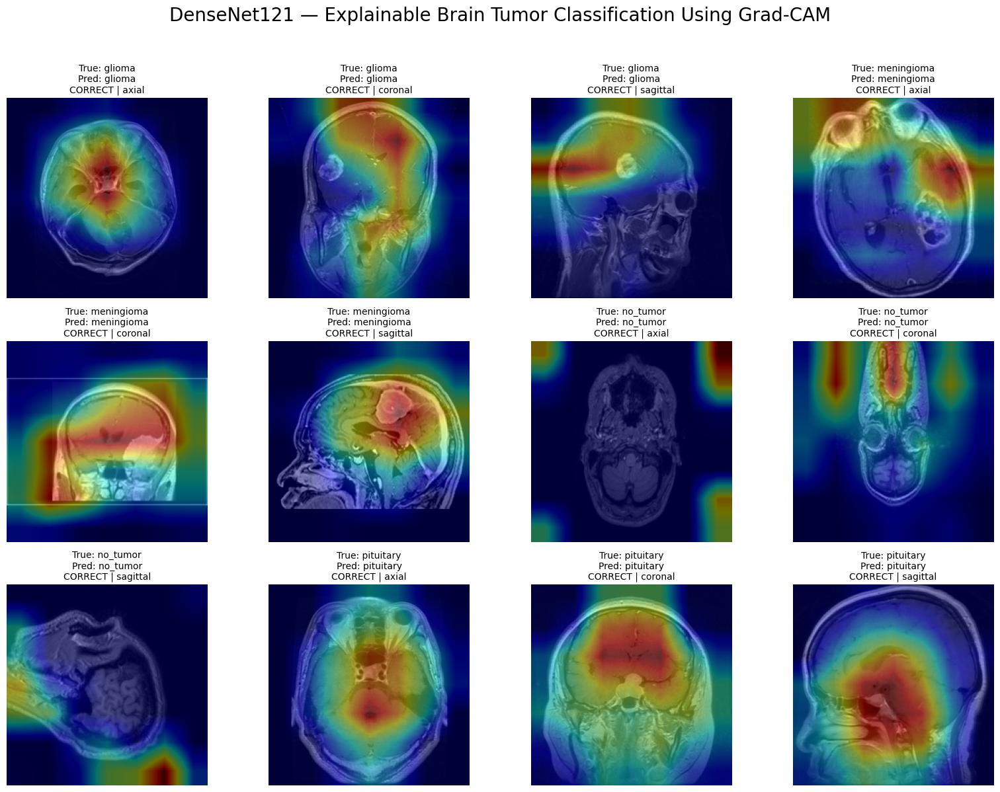


Final figure saved:
D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\outputs\figures\gradcam\FINAL_GRADCAM_THESIS_FIGURE.png
Figure records saved:
D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\outputs\reports\gradcam\FINAL_GRADCAM_THESIS_FIGURE_RECORD.csv
Selection records saved:
D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\outputs\reports\gradcam\FINAL_GRADCAM_THESIS_IMAGE_SELECTION.csv

FINAL THESIS GRAD-CAM FIGURE STATUS: PASS
Images used       : 12
Classes covered   : 4
MRI planes covered: 3
Figure            : D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\outputs\figures\gradcam\FINAL_GRADCAM_THESIS_FIGURE.png
Records           : D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\outputs\reports\gradcam\FINAL_GRADCAM_THESIS_FIGURE_RECORD.csv
Selection         : D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\outputs\reports\gradcam\FINAL_GRADCAM_THESIS_IMAGE_SELECTION.csv
Methodology       : D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\outputs\reports\gradcam\FINAL_GRADCAM_THESIS_METHODOLOGY.json


In [22]:
# ============================================================
# NEXT CELL — FINAL THESIS GRAD-CAM FIGURE
# ============================================================
#
# Creates a clean thesis-ready 12-image Grad-CAM figure.
#
# Uses the already successful balanced Grad-CAM results.
# No new Grad-CAM computation.
# No training.
# No model modification.
# ============================================================

print("=" * 70)
print("CREATING FINAL THESIS GRAD-CAM FIGURE")
print("=" * 70)

# ============================================================
# 1. VERIFY BALANCED RESULTS EXIST
# ============================================================

required_variables = [
    "balanced_df",
    "balanced_images",
    "balanced_heatmaps",
    "balanced_results_df",
    "GRADCAM_OUTPUT_DIR",
    "GRADCAM_REPORT_DIR",
    "CLASS_NAMES"
]

missing_variables = [
    name
    for name in required_variables
    if name not in globals()
]

assert len(missing_variables) == 0, (
    "Missing variables: "
    + ", ".join(missing_variables)
)

print("Grad-CAM validation results: PASS")

# ============================================================
# 2. SELECT 12 REPRESENTATIVE IMAGES
# ============================================================
#
# Target:
#
#   3 examples per class
#
# Prefer:
#   - different MRI planes
#   - correct predictions
#   - one incorrect prediction where available
#
# This creates a compact thesis figure.
# ============================================================

final_records = []

for class_name in CLASS_NAMES:

    class_df = balanced_df[
        balanced_df["tumor_label"] == class_name
    ].copy()

    # --------------------------------------------------------
    # Prefer one correct image from each plane
    # --------------------------------------------------------

    selected = []

    for plane in ["axial", "coronal", "sagittal"]:

        plane_df = class_df[
            class_df["plane_label"] == plane
        ]

        correct_df = plane_df[
            plane_df["correct"] == True
        ]

        if len(correct_df) > 0:

            selected.append(
                correct_df.iloc[0]
            )

    # --------------------------------------------------------
    # If fewer than 3, fill with available examples
    # --------------------------------------------------------

    if len(selected) < 3:

        selected_filenames = [
            row["filename"]
            for row in selected
        ]

        remaining = class_df[
            ~class_df["filename"].isin(
                selected_filenames
            )
        ]

        for _, row in remaining.iterrows():

            selected.append(row)

            if len(selected) == 3:
                break

    # --------------------------------------------------------
    # Limit to 3
    # --------------------------------------------------------

    selected = selected[:3]

    for row in selected:

        final_records.append(row)

final_df = pd.DataFrame(
    final_records
).drop_duplicates(
    subset=["filename"]
).reset_index(
    drop=True
)

# ============================================================
# 3. VERIFY FINAL SELECTION
# ============================================================

print("\nFINAL FIGURE SELECTION")
print("-" * 70)

print(
    f"Number of images selected: "
    f"{len(final_df)}"
)

print(
    final_df[
        [
            "filename",
            "tumor_label",
            "predicted_class",
            "plane_label",
            "correct"
        ]
    ].to_string(
        index=False
    )
)

# We expect at least 12 and normally exactly 12.
assert len(final_df) >= 12

# ============================================================
# 4. MAP SELECTED RECORDS TO EXISTING GRAD-CAM RESULTS
# ============================================================

final_images = []
final_heatmaps = []
final_result_rows = []

for _, row in final_df.iterrows():

    # --------------------------------------------------------
    # Find matching record in balanced selection
    # --------------------------------------------------------

    matches = balanced_df.index[
        balanced_df["filename"]
        ==
        row["filename"]
    ].tolist()

    assert len(matches) == 1

    balanced_index = matches[0]

    final_images.append(
        balanced_images[
            balanced_index
        ]
    )

    final_heatmaps.append(
        balanced_heatmaps[
            balanced_index
        ]
    )

    final_result_rows.append(
        balanced_results_df[
            balanced_results_df["filename"]
            ==
            row["filename"]
        ].iloc[0]
    )

# ============================================================
# 5. CREATE FINAL FIGURE
# ============================================================

number_of_images = len(
    final_images
)

columns = 4

rows = int(
    np.ceil(
        number_of_images /
        columns
    )
)

fig, axes = plt.subplots(
    rows,
    columns,
    figsize=(
        16,
        rows * 4
    )
)

axes = np.asarray(
    axes
).reshape(
    -1
)

# ============================================================
# 6. DRAW IMAGES
# ============================================================

for i in range(
    number_of_images
):

    ax = axes[i]

    row = final_df.iloc[i]

    image = final_images[i]

    heatmap = final_heatmaps[i]

    # --------------------------------------------------------
    # Original MRI
    # --------------------------------------------------------

    ax.imshow(
        image
    )

    # --------------------------------------------------------
    # Grad-CAM
    # --------------------------------------------------------

    ax.imshow(
        heatmap,
        cmap="jet",
        alpha=0.45
    )

    # --------------------------------------------------------
    # Prediction status
    # --------------------------------------------------------

    if bool(
        row["correct"]
    ):

        status = "CORRECT"

    else:

        status = "INCORRECT"

    # --------------------------------------------------------
    # Title
    # --------------------------------------------------------

    ax.set_title(
        f"True: {row['tumor_label']}\n"
        f"Pred: {row['predicted_class']}\n"
        f"{status} | {row['plane_label']}",
        fontsize=10
    )

    ax.axis(
        "off"
    )

# ============================================================
# 7. HIDE UNUSED AXES
# ============================================================

for i in range(
    number_of_images,
    len(axes)
):

    axes[i].axis(
        "off"
    )

# ============================================================
# 8. FIGURE TITLE
# ============================================================

fig.suptitle(
    "DenseNet121 — Explainable Brain Tumor Classification "
    "Using Grad-CAM",
    fontsize=20,
    y=0.995
)

plt.tight_layout(
    rect=[
        0,
        0,
        1,
        0.97
    ]
)

# ============================================================
# 9. SAVE HIGH-RESOLUTION FIGURE
# ============================================================

final_figure_path = (
    GRADCAM_OUTPUT_DIR
    /
    "FINAL_GRADCAM_THESIS_FIGURE.png"
)

fig.savefig(
    final_figure_path,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

plt.close(
    fig
)

print(
    f"\nFinal figure saved:\n"
    f"{final_figure_path}"
)

# ============================================================
# 10. SAVE FINAL IMAGE RECORD
# ============================================================

final_records_df = pd.DataFrame(
    final_result_rows
)

final_records_path = (
    GRADCAM_REPORT_DIR
    /
    "FINAL_GRADCAM_THESIS_FIGURE_RECORD.csv"
)

final_records_df.to_csv(
    final_records_path,
    index=False
)

print(
    f"Figure records saved:\n"
    f"{final_records_path}"
)

# ============================================================
# 11. SAVE SELECTION TABLE
# ============================================================

final_selection_path = (
    GRADCAM_REPORT_DIR
    /
    "FINAL_GRADCAM_THESIS_IMAGE_SELECTION.csv"
)

final_df.to_csv(
    final_selection_path,
    index=False
)

print(
    f"Selection records saved:\n"
    f"{final_selection_path}"
)

# ============================================================
# 12. SAVE METHODOLOGY RECORD
# ============================================================

methodology_record = {

    "figure":
        "Final DenseNet121 Grad-CAM Explainability Figure",

    "model":
        "Final DenseNet121",

    "dataset":
        "BRISC2025 official test set",

    "selection_type":
        "Representative balanced subset",

    "images":
        int(number_of_images),

    "classes":
        CLASS_NAMES,

    "gradcam_method":
        "Standard Logit-Based Grad-CAM",

    "target":
        "Predicted-class pre-softmax logit",

    "target_layer":
        "conv5_block16_2_conv",

    "feature_map":
        "7x7x32",

    "training_performed":
        False,

    "model_modified":
        False,

    "test_set_modified":
        False,

    "figure_resolution_dpi":
        300,

    "purpose":
        "Qualitative explainability assessment",

    "status":
        "PASS"
}

methodology_path = (
    GRADCAM_REPORT_DIR
    /
    "FINAL_GRADCAM_THESIS_METHODOLOGY.json"
)

with open(
    methodology_path,
    "w",
    encoding="utf-8"
) as f:

    json.dump(
        methodology_record,
        f,
        indent=4
    )

# ============================================================
# 13. FINAL STATUS
# ============================================================

print("\n" + "=" * 70)
print("FINAL THESIS GRAD-CAM FIGURE STATUS: PASS")
print("=" * 70)

print(
    f"Images used       : {number_of_images}"
)

print(
    f"Classes covered   : "
    f"{final_df['tumor_label'].nunique()}"
)

print(
    f"MRI planes covered: "
    f"{final_df['plane_label'].nunique()}"
)

print(
    f"Figure            : "
    f"{final_figure_path}"
)

print(
    f"Records           : "
    f"{final_records_path}"
)

print(
    f"Selection         : "
    f"{final_selection_path}"
)

print(
    f"Methodology       : "
    f"{methodology_path}"
)

print("=" * 70)

In [24]:
# ============================================================
# CELL 11 — BRISC2025 SEGMENTATION MASK AVAILABILITY AUDIT
# CORRECTED DATASET PATH
# ============================================================

from pathlib import Path
import pandas as pd
import numpy as np
import json

print("=" * 75)
print("BRISC2025 SEGMENTATION MASK AVAILABILITY AUDIT")
print("=" * 75)

# ============================================================
# 1. FIND BRISC2025 DATASET
# ============================================================

PROJECT_ROOT = Path(
    r"D:\MSC Bioinformatics\INTERNSHIP\BrainTumor"
)

POSSIBLE_DATASET_ROOTS = [
    Path(r"D:\MSC Bioinformatics\INTERNSHIP\brisc2025"),
    Path(r"D:\MSC Bioinformatics\brisc2025"),
    PROJECT_ROOT.parent / "brisc2025",
]

BRISC_ROOT = None

for candidate in POSSIBLE_DATASET_ROOTS:
    if candidate.exists() and candidate.is_dir():
        BRISC_ROOT = candidate
        break

if BRISC_ROOT is None:

    print("\nERROR: BRISC2025 dataset could not be found.")
    print("\nChecked:")

    for candidate in POSSIBLE_DATASET_ROOTS:
        print(f"  {candidate}")

    raise FileNotFoundError(
        "BRISC2025 dataset directory not found."
    )

print(
    f"\nBRISC2025 dataset found:\n"
    f"{BRISC_ROOT}"
)

# ============================================================
# 2. VERIFY GRADCAM REPORT DIRECTORY
# ============================================================

GRADCAM_REPORT_DIR = (
    PROJECT_ROOT
    / "outputs"
    / "reports"
    / "gradcam"
)

GRADCAM_REPORT_DIR.mkdir(
    parents=True,
    exist_ok=True
)

# ============================================================
# 3. LOAD LOCKED OFFICIAL TEST SET
# ============================================================

# Notebook 05 created this file, so we use the saved locked
# test set instead of relying only on an in-memory variable.

LOCKED_TEST_FILE = (
    GRADCAM_REPORT_DIR.parent.parent
    / "reports"
    / "final_densenet121"
    / "FINAL_DENSENET121_LOCKED_OFFICIAL_TEST_SET.csv"
)

# Correct path explicitly
LOCKED_TEST_FILE = (
    PROJECT_ROOT
    / "outputs"
    / "reports"
    / "final_densenet121"
    / "FINAL_DENSENET121_LOCKED_OFFICIAL_TEST_SET.csv"
)

if LOCKED_TEST_FILE.exists():

    locked_test_df = pd.read_csv(
        LOCKED_TEST_FILE
    )

    print(
        f"\nLocked official test set loaded from:"
        f"\n{LOCKED_TEST_FILE}"
    )

else:

    # Fall back to the notebook variable if available
    if "official_test_df" in globals():

        locked_test_df = (
            official_test_df
            .copy()
            .reset_index(drop=True)
        )

        print(
            "\nUsing official_test_df already "
            "loaded in the notebook."
        )

    else:

        raise FileNotFoundError(
            "Locked official test CSV was not found and "
            "official_test_df is not available."
        )

# ============================================================
# 4. VERIFY TEST SET
# ============================================================

assert len(locked_test_df) == 1000, (
    f"Expected 1000 official test images, "
    f"found {len(locked_test_df)}."
)

print(
    f"\nLocked official test images: "
    f"{len(locked_test_df)}"
)

print("\nOfficial test class distribution:")
print(
    locked_test_df["tumor_label"]
    .value_counts()
    .sort_index()
)

# ============================================================
# 5. SEARCH DATASET STRUCTURE
# ============================================================

print("\n" + "=" * 75)
print("SEARCHING FOR SEGMENTATION DATA")
print("=" * 75)

candidate_directories = []

for path in BRISC_ROOT.rglob("*"):

    if path.is_dir():

        name = path.name.lower()

        if (
            "segment" in name
            or "mask" in name
            or "annotation" in name
        ):

            candidate_directories.append(path)

candidate_directories = sorted(
    set(candidate_directories)
)

print(
    f"\nCandidate segmentation/mask directories: "
    f"{len(candidate_directories)}"
)

for directory in candidate_directories:

    print(
        f"  {directory}"
    )

# ============================================================
# 6. FIND ALL PNG FILES
# ============================================================

print("\n" + "=" * 75)
print("SEARCHING FOR PNG FILES")
print("=" * 75)

all_png_files = sorted(
    BRISC_ROOT.rglob("*.png")
)

print(
    f"\nTotal PNG files found: "
    f"{len(all_png_files)}"
)

# ============================================================
# 7. IDENTIFY LIKELY SEGMENTATION MASKS
# ============================================================

mask_files = []

for path in all_png_files:

    filename_lower = path.name.lower()
    parent_lower = str(path.parent).lower()

    if (
        "mask" in filename_lower
        or "mask" in parent_lower
        or "segment" in filename_lower
        or "segment" in parent_lower
        or "annotation" in filename_lower
        or "annotation" in parent_lower
    ):

        mask_files.append(path)

mask_files = sorted(
    set(mask_files)
)

print(
    f"Likely segmentation mask files found: "
    f"{len(mask_files)}"
)

if len(mask_files) > 0:

    print("\nFirst 20 mask files:")

    for path in mask_files[:20]:
        print(f"  {path}")

else:

    print(
        "\nWARNING: No obvious segmentation mask files "
        "were detected."
    )

# ============================================================
# 8. IF NO MASKS FOUND, INSPECT PNG DIRECTORY STRUCTURE
# ============================================================

if len(mask_files) == 0:

    print("\n" + "=" * 75)
    print("PNG DIRECTORY EXAMPLES")
    print("=" * 75)

    for path in all_png_files[:30]:

        print(
            f"  {path}"
        )

# ============================================================
# 9. CREATE NORMALIZED MASK LOOKUP
# ============================================================

def normalize_stem(stem):

    value = stem.lower().strip()

    suffixes = [
        "_mask",
        "-mask",
        "_seg",
        "-seg",
        "_segmentation",
        "-segmentation",
        "_annotation",
        "-annotation",
    ]

    changed = True

    while changed:

        changed = False

        for suffix in suffixes:

            if value.endswith(suffix):

                value = value[
                    :-len(suffix)
                ]

                changed = True

    return value


mask_lookup = {}

for mask_path in mask_files:

    normalized = normalize_stem(
        mask_path.stem
    )

    mask_lookup.setdefault(
        normalized,
        []
    ).append(mask_path)

print(
    f"\nNormalized mask lookup entries: "
    f"{len(mask_lookup)}"
)

# ============================================================
# 10. MATCH OFFICIAL TEST IMAGES TO MASKS
# ============================================================

match_records = []

for _, row in locked_test_df.iterrows():

    filename = Path(
        str(row["filename"])
    ).name

    image_stem = Path(
        filename
    ).stem.lower()

    possible_stems = {
        image_stem,
        normalize_stem(image_stem)
    }

    matched_paths = []

    for stem in possible_stems:

        if stem in mask_lookup:

            matched_paths.extend(
                mask_lookup[stem]
            )

    matched_paths = list(
        dict.fromkeys(
            matched_paths
        )
    )

    if len(matched_paths) == 0:

        status = "NO_MATCH"
        selected_mask = ""

    elif len(matched_paths) == 1:

        status = "UNIQUE_MATCH"
        selected_mask = str(
            matched_paths[0]
        )

    else:

        status = "MULTIPLE_MATCHES"
        selected_mask = ";".join(
            str(p)
            for p in matched_paths
        )

    match_records.append(
        {
            "filename":
                filename,

            "true_class":
                row["tumor_label"],

            "mri_plane":
                row["plane_label"],

            "classification_split":
                row["split"],

            "mask_match_status":
                status,

            "matched_mask_path":
                selected_mask,

            "number_of_matches":
                len(matched_paths)
        }
    )

mask_match_df = pd.DataFrame(
    match_records
)

assert len(mask_match_df) == 1000

# ============================================================
# 11. MATCHING SUMMARY
# ============================================================

print("\n" + "=" * 75)
print("MASK MATCHING SUMMARY")
print("=" * 75)

summary = (
    mask_match_df[
        "mask_match_status"
    ]
    .value_counts()
)

print(
    summary.to_string()
)

unique_matches = int(
    (
        mask_match_df[
            "mask_match_status"
        ]
        == "UNIQUE_MATCH"
    ).sum()
)

no_matches = int(
    (
        mask_match_df[
            "mask_match_status"
        ]
        == "NO_MATCH"
    ).sum()
)

multiple_matches = int(
    (
        mask_match_df[
            "mask_match_status"
        ]
        == "MULTIPLE_MATCHES"
    ).sum()
)

print(
    f"\nUnique matches   : {unique_matches}"
)

print(
    f"No matches       : {no_matches}"
)

print(
    f"Multiple matches : {multiple_matches}"
)

# ============================================================
# 12. MATCHING BY CLASS
# ============================================================

class_summary = (
    mask_match_df
    .groupby("true_class")
    .agg(
        total_images=(
            "filename",
            "count"
        ),

        unique_mask_matches=(
            "mask_match_status",
            lambda x: int(
                (
                    x
                    == "UNIQUE_MATCH"
                ).sum()
            )
        ),

        no_mask_match=(
            "mask_match_status",
            lambda x: int(
                (
                    x
                    == "NO_MATCH"
                ).sum()
            )
        ),

        multiple_matches=(
            "mask_match_status",
            lambda x: int(
                (
                    x
                    == "MULTIPLE_MATCHES"
                ).sum()
            )
        )
    )
    .reset_index()
)

print("\n" + "=" * 75)
print("MASK MATCHING BY CLASS")
print("=" * 75)

print(
    class_summary.to_string(
        index=False
    )
)

# ============================================================
# 13. MATCHING BY MRI PLANE
# ============================================================

plane_summary = (
    mask_match_df
    .groupby("mri_plane")
    .agg(
        total_images=(
            "filename",
            "count"
        ),

        unique_mask_matches=(
            "mask_match_status",
            lambda x: int(
                (
                    x
                    == "UNIQUE_MATCH"
                ).sum()
            )
        ),

        no_mask_match=(
            "mask_match_status",
            lambda x: int(
                (
                    x
                    == "NO_MATCH"
                ).sum()
            )
        ),

        multiple_matches=(
            "mask_match_status",
            lambda x: int(
                (
                    x
                    == "MULTIPLE_MATCHES"
                ).sum()
            )
        )
    )
    .reset_index()
)

print("\n" + "=" * 75)
print("MASK MATCHING BY MRI PLANE")
print("=" * 75)

print(
    plane_summary.to_string(
        index=False
    )
)

# ============================================================
# 14. VERIFY MATCHED FILES EXIST
# ============================================================

print("\n" + "=" * 75)
print("VERIFYING MATCHED MASK FILES")
print("=" * 75)

unique_df = mask_match_df[
    mask_match_df[
        "mask_match_status"
    ]
    == "UNIQUE_MATCH"
].copy()

existing_count = 0
missing_count = 0

for _, row in unique_df.iterrows():

    mask_path = Path(
        row["matched_mask_path"]
    )

    if mask_path.exists():
        existing_count += 1
    else:
        missing_count += 1

print(
    f"Unique matched records : "
    f"{len(unique_df)}"
)

print(
    f"Mask files existing    : "
    f"{existing_count}"
)

print(
    f"Mask files missing     : "
    f"{missing_count}"
)

# ============================================================
# 15. SAVE AUDIT FILES
# ============================================================

audit_csv = (
    GRADCAM_REPORT_DIR
    /
    "BRISC2025_OFFICIAL_TEST_SEGMENTATION_MASK_AUDIT.csv"
)

mask_match_df.to_csv(
    audit_csv,
    index=False
)

class_csv = (
    GRADCAM_REPORT_DIR
    /
    "BRISC2025_TEST_MASK_MATCHING_BY_CLASS.csv"
)

class_summary.to_csv(
    class_csv,
    index=False
)

plane_csv = (
    GRADCAM_REPORT_DIR
    /
    "BRISC2025_TEST_MASK_MATCHING_BY_PLANE.csv"
)

plane_summary.to_csv(
    plane_csv,
    index=False
)

# ============================================================
# 16. SAVE JSON RECORD
# ============================================================

audit_record = {

    "dataset":
        "BRISC2025",

    "dataset_root":
        str(BRISC_ROOT),

    "official_test_images":
        1000,

    "total_png_files_found":
        len(all_png_files),

    "likely_mask_files_found":
        len(mask_files),

    "unique_mask_matches":
        unique_matches,

    "no_matches":
        no_matches,

    "multiple_matches":
        multiple_matches,

    "existing_unique_masks":
        existing_count,

    "missing_unique_masks":
        missing_count,

    "model_training_performed":
        False,

    "official_test_modified":
        False,

    "fabricated_boxes":
        False,

    "status":
        (
            "PASS"
            if (
                multiple_matches == 0
                and
                missing_count == 0
            )
            else
            "REVIEW_REQUIRED"
        )
}

audit_json = (
    GRADCAM_REPORT_DIR
    /
    "BRISC2025_SEGMENTATION_MASK_AUDIT.json"
)

with open(
    audit_json,
    "w",
    encoding="utf-8"
) as f:

    json.dump(
        audit_record,
        f,
        indent=4
    )

# ============================================================
# 17. FINAL STATUS
# ============================================================

print("\n" + "=" * 75)
print("FINAL SEGMENTATION MASK AUDIT")
print("=" * 75)

print(
    f"Official test images : 1000"
)

print(
    f"Unique mask matches  : {unique_matches}"
)

print(
    f"No matches           : {no_matches}"
)

print(
    f"Multiple matches     : {multiple_matches}"
)

print(
    f"Existing mask files  : {existing_count}"
)

print(
    f"Missing mask files   : {missing_count}"
)

print(
    f"\nCSV saved:"
    f"\n{audit_csv}"
)

print(
    f"\nJSON saved:"
    f"\n{audit_json}"
)

if (
    unique_matches > 0
    and
    multiple_matches == 0
    and
    missing_count == 0
):

    print(
        "\nSTATUS: PASS"
    )

    print(
        "\nGround-truth segmentation masks "
        "are available for matched test images."
    )

else:

    print(
        "\nSTATUS: REVIEW REQUIRED"
    )

print("=" * 75)

BRISC2025 SEGMENTATION MASK AVAILABILITY AUDIT

BRISC2025 dataset found:
D:\MSC Bioinformatics\INTERNSHIP\brisc2025

Locked official test set loaded from:
D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\outputs\reports\final_densenet121\FINAL_DENSENET121_LOCKED_OFFICIAL_TEST_SET.csv

Locked official test images: 1000

Official test class distribution:
tumor_label
glioma        254
meningioma    306
no_tumor      140
pituitary     300
Name: count, dtype: int64

SEARCHING FOR SEGMENTATION DATA

Candidate segmentation/mask directories: 3
  D:\MSC Bioinformatics\INTERNSHIP\brisc2025\segmentation_task
  D:\MSC Bioinformatics\INTERNSHIP\brisc2025\segmentation_task\test\masks
  D:\MSC Bioinformatics\INTERNSHIP\brisc2025\segmentation_task\train\masks

SEARCHING FOR PNG FILES

Total PNG files found: 4793
Likely segmentation mask files found: 4793

First 20 mask files:
  D:\MSC Bioinformatics\INTERNSHIP\brisc2025\segmentation_task\test\masks\brisc2025_test_00001_gl_ax_t1.png
  D:\MSC Bioinformatics\

In [25]:
# ============================================================
# CELL 12 — VERIFY SEGMENTATION MASKS + GENERATE
#            GROUND-TRUTH TUMOR BOUNDING BOXES
# ============================================================

from pathlib import Path
import pandas as pd
import numpy as np
from PIL import Image
import json

print("=" * 75)
print("SEGMENTATION MASK VERIFICATION + GROUND-TRUTH BOUNDING BOXES")
print("=" * 75)

# ============================================================
# 1. PATHS
# ============================================================

PROJECT_ROOT = Path(
    r"D:\MSC Bioinformatics\INTERNSHIP\BrainTumor"
)

GRADCAM_REPORT_DIR = (
    PROJECT_ROOT
    / "outputs"
    / "reports"
    / "gradcam"
)

GRADCAM_FIGURE_DIR = (
    PROJECT_ROOT
    / "outputs"
    / "figures"
    / "gradcam"
)

GRADCAM_REPORT_DIR.mkdir(
    parents=True,
    exist_ok=True
)

GRADCAM_FIGURE_DIR.mkdir(
    parents=True,
    exist_ok=True
)

MASK_AUDIT_FILE = (
    GRADCAM_REPORT_DIR
    /
    "BRISC2025_OFFICIAL_TEST_SEGMENTATION_MASK_AUDIT.csv"
)

assert MASK_AUDIT_FILE.exists(), (
    f"Mask audit file not found:\n{MASK_AUDIT_FILE}"
)

# ============================================================
# 2. LOAD MASK AUDIT
# ============================================================

mask_df = pd.read_csv(
    MASK_AUDIT_FILE
)

print(
    f"\nMask audit records: "
    f"{len(mask_df)}"
)

assert len(mask_df) == 1000

# Only unique valid matches
matched_df = mask_df[
    mask_df[
        "mask_match_status"
    ]
    ==
    "UNIQUE_MATCH"
].copy()

print(
    f"Unique mask matches: "
    f"{len(matched_df)}"
)

assert len(matched_df) > 0

# ============================================================
# 3. MASK ANALYSIS FUNCTION
# ============================================================

def analyze_mask(mask_path):

    mask_path = Path(
        mask_path
    )

    if not mask_path.exists():

        return {
            "mask_exists": False,
            "mask_readable": False,
            "mask_width": np.nan,
            "mask_height": np.nan,
            "mask_channels": np.nan,
            "mask_dtype": "",
            "mask_min": np.nan,
            "mask_max": np.nan,
            "mask_unique_values": "",
            "tumor_pixels": 0,
            "tumor_present": False,
            "bbox_x_min": np.nan,
            "bbox_y_min": np.nan,
            "bbox_x_max": np.nan,
            "bbox_y_max": np.nan,
            "bbox_width": np.nan,
            "bbox_height": np.nan,
            "bbox_area": np.nan,
            "bbox_area_fraction": np.nan,
            "status": "MASK_NOT_FOUND"
        }

    try:

        mask_image = Image.open(
            mask_path
        )

        mask_array = np.asarray(
            mask_image
        )

        # ----------------------------------------------------
        # Convert mask to 2D
        # ----------------------------------------------------

        if mask_array.ndim == 3:

            # If RGB/RGBA mask, convert to grayscale
            mask_gray = np.asarray(
                mask_image.convert("L")
            )

        else:

            mask_gray = mask_array

        height, width = (
            mask_gray.shape[:2]
        )

        # ----------------------------------------------------
        # Determine tumor pixels
        #
        # Background = 0
        # Any non-zero value = segmentation region
        # ----------------------------------------------------

        tumor_binary = (
            mask_gray > 0
        )

        tumor_pixels = int(
            tumor_binary.sum()
        )

        tumor_present = (
            tumor_pixels > 0
        )

        # ----------------------------------------------------
        # Unique values
        # ----------------------------------------------------

        unique_values = np.unique(
            mask_gray
        )

        unique_values_string = ",".join(
            str(v)
            for v in unique_values[:50]
        )

        if len(unique_values) > 50:

            unique_values_string += ",..."

        # ----------------------------------------------------
        # Bounding box
        # ----------------------------------------------------

        if tumor_present:

            ys, xs = np.where(
                tumor_binary
            )

            x_min = int(
                xs.min()
            )

            x_max = int(
                xs.max()
            )

            y_min = int(
                ys.min()
            )

            y_max = int(
                ys.max()
            )

            bbox_width = (
                x_max
                -
                x_min
                +
                1
            )

            bbox_height = (
                y_max
                -
                y_min
                +
                1
            )

            bbox_area = (
                bbox_width
                *
                bbox_height
            )

            bbox_area_fraction = (
                bbox_area
                /
                float(width * height)
            )

        else:

            x_min = np.nan
            y_min = np.nan
            x_max = np.nan
            y_max = np.nan

            bbox_width = np.nan
            bbox_height = np.nan
            bbox_area = np.nan
            bbox_area_fraction = np.nan

        # ----------------------------------------------------
        # Status
        # ----------------------------------------------------

        status = (
            "PASS"
            if tumor_present
            else
            "EMPTY_MASK"
        )

        return {
            "mask_exists": True,
            "mask_readable": True,
            "mask_width": int(width),
            "mask_height": int(height),
            "mask_channels":
                (
                    int(mask_array.shape[2])
                    if mask_array.ndim == 3
                    else 1
                ),
            "mask_dtype":
                str(mask_array.dtype),
            "mask_min":
                int(mask_gray.min()),
            "mask_max":
                int(mask_gray.max()),
            "mask_unique_values":
                unique_values_string,
            "tumor_pixels":
                tumor_pixels,
            "tumor_present":
                tumor_present,
            "bbox_x_min":
                x_min,
            "bbox_y_min":
                y_min,
            "bbox_x_max":
                x_max,
            "bbox_y_max":
                y_max,
            "bbox_width":
                bbox_width,
            "bbox_height":
                bbox_height,
            "bbox_area":
                bbox_area,
            "bbox_area_fraction":
                bbox_area_fraction,
            "status":
                status
        }

    except Exception as e:

        return {
            "mask_exists": True,
            "mask_readable": False,
            "mask_width": np.nan,
            "mask_height": np.nan,
            "mask_channels": np.nan,
            "mask_dtype": "",
            "mask_min": np.nan,
            "mask_max": np.nan,
            "mask_unique_values": "",
            "tumor_pixels": 0,
            "tumor_present": False,
            "bbox_x_min": np.nan,
            "bbox_y_min": np.nan,
            "bbox_x_max": np.nan,
            "bbox_y_max": np.nan,
            "bbox_width": np.nan,
            "bbox_height": np.nan,
            "bbox_area": np.nan,
            "bbox_area_fraction": np.nan,
            "status":
                f"READ_ERROR: {type(e).__name__}: {e}"
        }


# ============================================================
# 4. ANALYZE ALL MATCHED MASKS
# ============================================================

analysis_records = []

print(
    "\nAnalyzing segmentation masks..."
)

for index, row in matched_df.iterrows():

    mask_path = (
        row["matched_mask_path"]
    )

    result = analyze_mask(
        mask_path
    )

    record = {
        "filename":
            row["filename"],

        "true_class":
            row["true_class"],

        "mri_plane":
            row["mri_plane"],

        "mask_path":
            mask_path
    }

    record.update(
        result
    )

    analysis_records.append(
        record
    )

mask_analysis_df = pd.DataFrame(
    analysis_records
)

# ============================================================
# 5. SUMMARY
# ============================================================

print("\n" + "=" * 75)
print("MASK VERIFICATION SUMMARY")
print("=" * 75)

total = len(
    mask_analysis_df
)

readable = int(
    mask_analysis_df[
        "mask_readable"
    ].sum()
)

tumor_present_count = int(
    mask_analysis_df[
        "tumor_present"
    ].sum()
)

empty_count = int(
    (
        mask_analysis_df[
            "status"
        ]
        ==
        "EMPTY_MASK"
    ).sum()
)

read_error_count = int(
    mask_analysis_df[
        "status"
    ]
    .astype(str)
    .str.startswith(
        "READ_ERROR"
    )
    .sum()
)

print(
    f"Matched masks       : {total}"
)

print(
    f"Readable masks      : {readable}"
)

print(
    f"Tumor-present masks  : {tumor_present_count}"
)

print(
    f"Empty masks          : {empty_count}"
)

print(
    f"Read errors          : {read_error_count}"
)

# ============================================================
# 6. BOUNDING BOX SUMMARY
# ============================================================

bbox_df = mask_analysis_df[
    mask_analysis_df[
        "tumor_present"
    ]
].copy()

print("\n" + "=" * 75)
print("GROUND-TRUTH BOUNDING BOX SUMMARY")
print("=" * 75)

print(
    f"Images with tumor boxes: "
    f"{len(bbox_df)}"
)

if len(bbox_df) > 0:

    print(
        "\nBounding box coordinate range:"
    )

    print(
        bbox_df[
            [
                "bbox_x_min",
                "bbox_y_min",
                "bbox_x_max",
                "bbox_y_max"
            ]
        ]
        .describe()
        .to_string()
    )

    print(
        "\nTumor pixel statistics:"
    )

    print(
        bbox_df[
            [
                "tumor_pixels",
                "bbox_area",
                "bbox_area_fraction"
            ]
        ]
        .describe()
        .to_string()
    )

# ============================================================
# 7. BOXES BY CLASS
# ============================================================

if len(bbox_df) > 0:

    print("\n" + "=" * 75)
    print("GROUND-TRUTH BOXES BY CLASS")
    print("=" * 75)

    class_bbox_summary = (
        bbox_df
        .groupby("true_class")
        .agg(
            images=(
                "filename",
                "count"
            ),

            mean_tumor_pixels=(
                "tumor_pixels",
                "mean"
            ),

            median_tumor_pixels=(
                "tumor_pixels",
                "median"
            ),

            mean_bbox_width=(
                "bbox_width",
                "mean"
            ),

            mean_bbox_height=(
                "bbox_height",
                "mean"
            ),

            mean_bbox_area_fraction=(
                "bbox_area_fraction",
                "mean"
            )
        )
        .reset_index()
    )

    print(
        class_bbox_summary.to_string(
            index=False
        )
    )

else:

    class_bbox_summary = pd.DataFrame()

# ============================================================
# 8. BOXES BY MRI PLANE
# ============================================================

if len(bbox_df) > 0:

    print("\n" + "=" * 75)
    print("GROUND-TRUTH BOXES BY MRI PLANE")
    print("=" * 75)

    plane_bbox_summary = (
        bbox_df
        .groupby("mri_plane")
        .agg(
            images=(
                "filename",
                "count"
            ),

            mean_bbox_width=(
                "bbox_width",
                "mean"
            ),

            mean_bbox_height=(
                "bbox_height",
                "mean"
            ),

            mean_bbox_area_fraction=(
                "bbox_area_fraction",
                "mean"
            )
        )
        .reset_index()
    )

    print(
        plane_bbox_summary.to_string(
            index=False
        )
    )

else:

    plane_bbox_summary = pd.DataFrame()

# ============================================================
# 9. SAVE COMPLETE MASK ANALYSIS
# ============================================================

MASK_ANALYSIS_CSV = (
    GRADCAM_REPORT_DIR
    /
    "BRISC2025_OFFICIAL_TEST_MASK_VERIFICATION_AND_BOUNDING_BOXES.csv"
)

mask_analysis_df.to_csv(
    MASK_ANALYSIS_CSV,
    index=False
)

# ============================================================
# 10. SAVE ONLY VALID GROUND-TRUTH BOXES
# ============================================================

BBOX_CSV = (
    GRADCAM_REPORT_DIR
    /
    "BRISC2025_OFFICIAL_TEST_GROUND_TRUTH_BOUNDING_BOXES.csv"
)

bbox_df.to_csv(
    BBOX_CSV,
    index=False
)

# ============================================================
# 11. SAVE CLASS SUMMARY
# ============================================================

CLASS_BBOX_CSV = (
    GRADCAM_REPORT_DIR
    /
    "BRISC2025_GROUND_TRUTH_BOUNDING_BOXES_BY_CLASS.csv"
)

class_bbox_summary.to_csv(
    CLASS_BBOX_CSV,
    index=False
)

# ============================================================
# 12. SAVE PLANE SUMMARY
# ============================================================

PLANE_BBOX_CSV = (
    GRADCAM_REPORT_DIR
    /
    "BRISC2025_GROUND_TRUTH_BOUNDING_BOXES_BY_PLANE.csv"
)

plane_bbox_summary.to_csv(
    PLANE_BBOX_CSV,
    index=False
)

# ============================================================
# 13. SAVE AUDIT JSON
# ============================================================

bbox_audit = {

    "dataset":
        "BRISC2025",

    "official_test_images":
        1000,

    "matched_masks":
        total,

    "readable_masks":
        readable,

    "tumor_present_masks":
        tumor_present_count,

    "empty_masks":
        empty_count,

    "read_errors":
        read_error_count,

    "bounding_box_method":
        "Minimum axis-aligned rectangle enclosing all non-zero segmentation-mask pixels",

    "background_definition":
        "Mask pixels equal to zero",

    "tumor_pixel_definition":
        "Mask pixels greater than zero",

    "boxes_are_ground_truth":
        True,

    "boxes_derived_from_gradcam":
        False,

    "model_training_performed":
        False,

    "official_test_modified":
        False,

    "status":
        (
            "PASS"
            if (
                readable == total
                and
                read_error_count == 0
            )
            else
            "REVIEW_REQUIRED"
        )
}

BBOX_JSON = (
    GRADCAM_REPORT_DIR
    /
    "BRISC2025_GROUND_TRUTH_BOUNDING_BOX_AUDIT.json"
)

with open(
    BBOX_JSON,
    "w",
    encoding="utf-8"
) as f:

    json.dump(
        bbox_audit,
        f,
        indent=4
    )

# ============================================================
# 14. FINAL STATUS
# ============================================================

print("\n" + "=" * 75)
print("FINAL MASK + BOUNDING BOX AUDIT")
print("=" * 75)

print(
    f"Matched masks          : {total}"
)

print(
    f"Readable masks         : {readable}"
)

print(
    f"Tumor-present masks    : {tumor_present_count}"
)

print(
    f"Empty masks            : {empty_count}"
)

print(
    f"Read errors            : {read_error_count}"
)

print(
    f"\nGround-truth boxes saved:"
    f"\n{BBOX_CSV}"
)

print(
    f"\nComplete audit saved:"
    f"\n{MASK_ANALYSIS_CSV}"
)

print(
    f"\nAudit JSON saved:"
    f"\n{BBOX_JSON}"
)

if (
    readable == total
    and
    read_error_count == 0
    and
    tumor_present_count > 0
):

    print(
        "\nSTATUS: PASS"
    )

    print(
        "\nGround-truth tumor bounding boxes "
        "were successfully derived from segmentation masks."
    )

else:

    print(
        "\nSTATUS: REVIEW REQUIRED"
    )

print("=" * 75)

SEGMENTATION MASK VERIFICATION + GROUND-TRUTH BOUNDING BOXES

Mask audit records: 1000
Unique mask matches: 860

Analyzing segmentation masks...

MASK VERIFICATION SUMMARY
Matched masks       : 860
Readable masks      : 860
Tumor-present masks  : 860
Empty masks          : 0
Read errors          : 0

GROUND-TRUTH BOUNDING BOX SUMMARY
Images with tumor boxes: 860

Bounding box coordinate range:
       bbox_x_min  bbox_y_min  bbox_x_max  bbox_y_max
count  860.000000  860.000000  860.000000  860.000000
mean   201.189535  183.694186  283.465116  263.432558
std     65.703182   72.839775   68.697291   74.376548
min      8.000000   16.000000   71.000000   55.000000
25%    152.000000  128.000000  247.000000  223.000000
50%    216.000000  184.000000  287.000000  263.000000
75%    240.000000  240.000000  327.000000  319.000000
max    360.000000  392.000000  695.000000  567.000000

Tumor pixel statistics:
       tumor_pixels      bbox_area  bbox_area_fraction
count    860.000000     860.000000   

THESIS GROUND-TRUTH + GRAD-CAM VISUALIZATION

Bounding-box records: 860

Bounding-box columns:
['filename', 'true_class', 'mri_plane', 'mask_path', 'mask_exists', 'mask_readable', 'mask_width', 'mask_height', 'mask_channels', 'mask_dtype', 'mask_min', 'mask_max', 'mask_unique_values', 'tumor_pixels', 'tumor_present', 'bbox_x_min', 'bbox_y_min', 'bbox_x_max', 'bbox_y_max', 'bbox_width', 'bbox_height', 'bbox_area', 'bbox_area_fraction', 'status']

Classes found:
true_class
meningioma    306
pituitary     300
glioma        254

Planes found:
mri_plane
axial       346
coronal     257
sagittal    257

Prediction records: 1000

Prediction columns:
['filename', 'processed_filename', 'tumor_label', 'tumor_code', 'plane_label', 'plane_code', 'split', 'original_width', 'original_height', 'resized_width', 'resized_height', 'processed_width', 'processed_height', 'processed_channels', 'processed_mode', 'processed_format', 'processed_path', 'sha256', 'source_path', 'model_split', 'class_index', 'res

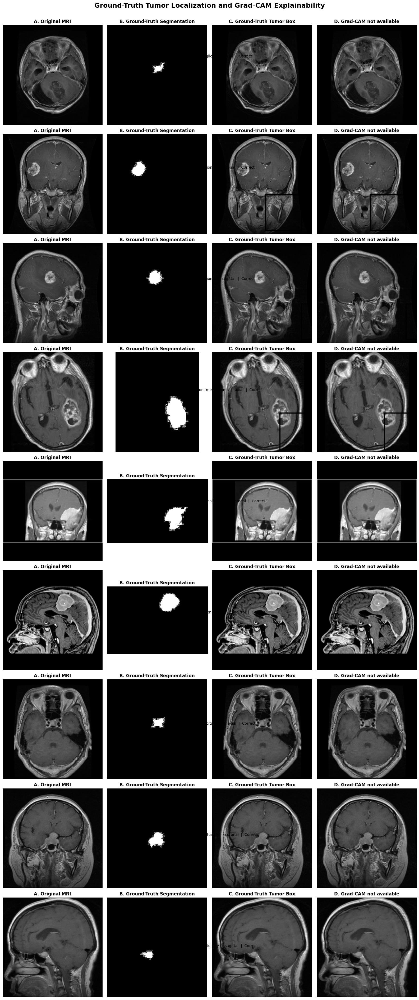


THESIS VISUALIZATION COMPLETE

Selected cases: 9

Figure saved:
D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\outputs\figures\gradcam\FINAL_GRADCAM_GROUND_TRUTH_BOUNDING_BOX_FIGURE.png

Selection record:
D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\outputs\reports\gradcam\FINAL_GRADCAM_GROUND_TRUTH_BOUNDING_BOX_SELECTION.csv

Methodology:
D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\outputs\reports\gradcam\FINAL_GRADCAM_GROUND_TRUTH_BOUNDING_BOX_METHODOLOGY.json

STATUS: PASS


In [27]:
# ============================================================
# CELL 13 — THESIS VISUALIZATION
# GROUND-TRUTH SEGMENTATION + BOUNDING BOX + GRAD-CAM
# ============================================================

from pathlib import Path
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from PIL import Image
import tensorflow as tf
import json

print("=" * 75)
print("THESIS GROUND-TRUTH + GRAD-CAM VISUALIZATION")
print("=" * 75)

# ============================================================
# 1. PATHS
# ============================================================

PROJECT_ROOT = Path(
    r"D:\MSC Bioinformatics\INTERNSHIP\BrainTumor"
)

GRADCAM_REPORT_DIR = (
    PROJECT_ROOT
    / "outputs"
    / "reports"
    / "gradcam"
)

GRADCAM_FIGURE_DIR = (
    PROJECT_ROOT
    / "outputs"
    / "figures"
    / "gradcam"
)

GRADCAM_REPORT_DIR.mkdir(
    parents=True,
    exist_ok=True
)

GRADCAM_FIGURE_DIR.mkdir(
    parents=True,
    exist_ok=True
)

PROCESSED_ROOT = (
    PROJECT_ROOT
    / "data"
    / "processed"
    / "classification_224_rgb"
)

# ============================================================
# 2. LOAD GROUND-TRUTH BOUNDING BOXES
# ============================================================

BBOX_FILE = (
    GRADCAM_REPORT_DIR
    /
    "BRISC2025_OFFICIAL_TEST_GROUND_TRUTH_BOUNDING_BOXES.csv"
)

assert BBOX_FILE.exists(), (
    f"Bounding-box file not found:\n{BBOX_FILE}"
)

bbox_df = pd.read_csv(
    BBOX_FILE
)

print(
    f"\nBounding-box records: {len(bbox_df)}"
)

# ============================================================
# 3. SHOW ACTUAL COLUMNS
# ============================================================

print("\nBounding-box columns:")
print(
    bbox_df.columns.tolist()
)

# ============================================================
# 4. NORMALIZE CLASS / PLANE VALUES
# ============================================================

bbox_df["true_class"] = (
    bbox_df["true_class"]
    .astype(str)
    .str.strip()
    .str.lower()
)

bbox_df["mri_plane"] = (
    bbox_df["mri_plane"]
    .astype(str)
    .str.strip()
    .str.lower()
)

CLASS_NAMES = [
    "glioma",
    "meningioma",
    "no_tumor",
    "pituitary"
]

print(
    "\nClasses found:"
)

print(
    bbox_df["true_class"]
    .value_counts()
    .to_string()
)

print(
    "\nPlanes found:"
)

print(
    bbox_df["mri_plane"]
    .value_counts()
    .to_string()
)

# ============================================================
# 5. LOAD TEST PREDICTIONS
# ============================================================

PRED_FILE = (
    PROJECT_ROOT
    / "outputs"
    / "predictions"
    / "final_densenet121"
    / "FINAL_DENSENET121_OFFICIAL_TEST_PREDICTIONS.csv"
)

assert PRED_FILE.exists(), (
    f"Prediction file not found:\n{PRED_FILE}"
)

pred_df = pd.read_csv(
    PRED_FILE
)

print(
    f"\nPrediction records: {len(pred_df)}"
)

print(
    "\nPrediction columns:"
)

print(
    pred_df.columns.tolist()
)

# ============================================================
# 6. DETERMINE PREDICTION COLUMN
# ============================================================

prediction_column = None

for column in [
    "prediction",
    "predicted_class",
    "predicted_label",
    "y_pred"
]:

    if column in pred_df.columns:

        prediction_column = column
        break

if prediction_column is None:

    raise KeyError(
        "Prediction column could not be identified."
    )

filename_column = None

for column in [
    "filename",
    "file_name",
    "image_filename"
]:

    if column in pred_df.columns:

        filename_column = column
        break

if filename_column is None:

    raise KeyError(
        "Filename column could not be identified."
    )

print(
    f"\nFilename column: {filename_column}"
)

print(
    f"Prediction column: {prediction_column}"
)

# ============================================================
# 7. NORMALIZE PREDICTIONS
# ============================================================

def normalize_prediction(value):

    text = str(value).strip().lower()

    if text in CLASS_NAMES:
        return text

    try:

        index = int(
            float(text)
        )

        if (
            0 <= index <
            len(CLASS_NAMES)
        ):

            return CLASS_NAMES[index]

    except Exception:
        pass

    return text


pred_df[
    "predicted_class_normalized"
] = pred_df[
    prediction_column
].apply(
    normalize_prediction
)

# ============================================================
# 8. MERGE
# ============================================================

pred_small = (
    pred_df[
        [
            filename_column,
            "predicted_class_normalized"
        ]
    ]
    .copy()
    .rename(
        columns={
            filename_column:
                "filename"
        }
    )
    .drop_duplicates(
        subset=["filename"]
    )
)

bbox_df = bbox_df.merge(
    pred_small,
    on="filename",
    how="left"
)

# ============================================================
# 9. CHECK MERGE
# ============================================================

missing_predictions = bbox_df[
    "predicted_class_normalized"
].isna().sum()

print(
    f"\nBounding boxes with predictions:"
    f" {len(bbox_df) - missing_predictions}/"
    f"{len(bbox_df)}"
)

assert missing_predictions == 0

bbox_df[
    "correct_prediction"
] = (
    bbox_df["true_class"]
    ==
    bbox_df["predicted_class_normalized"]
)

# ============================================================
# 10. FIND PROCESSED MRI
# ============================================================

def locate_processed_image(
    filename,
    true_class
):

    filename = Path(
        filename
    ).name

    stem = Path(
        filename
    ).stem

    candidate = (
        PROCESSED_ROOT
        / "test"
        / true_class
        / f"{stem}.png"
    )

    if candidate.exists():
        return candidate

    # Fallback
    matches = list(
        PROCESSED_ROOT.rglob(
            f"{stem}.png"
        )
    )

    if len(matches) == 1:
        return matches[0]

    # Prefer test directory
    test_matches = [
        p
        for p in matches
        if "test" in p.parts
    ]

    if len(test_matches) == 1:
        return test_matches[0]

    return None


bbox_df[
    "processed_image_path"
] = bbox_df.apply(
    lambda row:
        locate_processed_image(
            row["filename"],
            row["true_class"]
        ),
    axis=1
)

missing_images = bbox_df[
    "processed_image_path"
].isna()

print(
    f"\nProcessed MRI files found:"
    f" {len(bbox_df) - int(missing_images.sum())}/"
    f"{len(bbox_df)}"
)

assert not missing_images.any()

# ============================================================
# 11. FIND AVAILABLE GRAD-CAM RESULTS
# ============================================================

print("\n" + "=" * 75)
print("CHECKING EXISTING GRAD-CAM RESULTS")
print("=" * 75)

# We DO NOT run Grad-CAM on the entire test set.
# RTX 3050 4 GB previously produced OOM.

gradcam_files = []

for directory in [
    GRADCAM_FIGURE_DIR,
    GRADCAM_REPORT_DIR
]:

    if directory.exists():

        for path in directory.rglob("*"):

            if (
                path.is_file()
                and
                path.suffix.lower()
                in [
                    ".png",
                    ".jpg",
                    ".jpeg"
                ]
            ):

                gradcam_files.append(
                    path
                )

print(
    f"Existing image files in Grad-CAM folders:"
    f" {len(gradcam_files)}"
)

# ============================================================
# 12. MATCH GRAD-CAM IMAGE BY FILENAME
# ============================================================

def find_gradcam_file(
    filename
):

    stem = (
        Path(filename)
        .stem
        .lower()
    )

    matches = []

    for path in gradcam_files:

        path_name = (
            path.stem.lower()
        )

        if stem in path_name:

            matches.append(
                path
            )

    if len(matches) == 0:
        return None

    # Prefer files explicitly containing gradcam
    gradcam_matches = [
        p
        for p in matches
        if "gradcam" in p.name.lower()
        or "grad_cam" in p.name.lower()
    ]

    if len(gradcam_matches) > 0:
        return gradcam_matches[0]

    return matches[0]


# ============================================================
# 13. SELECT CASES
# ============================================================

print("\n" + "=" * 75)
print("SELECTING THESIS CASES")
print("=" * 75)

# ------------------------------------------------------------
# We want:
#
# 4 classes × 3 cases = 12 cases
#
# This is cleaner for a thesis figure and avoids producing
# an enormous 16-row figure.
#
# Preference:
#   1. different MRI planes
#   2. correct predictions
#   3. include an error if available
# ------------------------------------------------------------

selected_rows = []

for class_name in CLASS_NAMES:

    class_df = bbox_df[
        bbox_df["true_class"]
        ==
        class_name
    ].copy()

    print(
        f"\n{class_name}: "
        f"{len(class_df)} matched cases"
    )

    if len(class_df) == 0:

        print(
            f"WARNING: No matched cases for "
            f"{class_name}"
        )

        continue

    # --------------------------------------------------------
    # Try to select one case from each plane
    # --------------------------------------------------------

    chosen = []

    for plane in [
        "axial",
        "coronal",
        "sagittal"
    ]:

        plane_df = class_df[
            class_df["mri_plane"]
            ==
            plane
        ]

        if len(plane_df) == 0:
            continue

        # Prefer correct prediction
        correct_plane = plane_df[
            plane_df["correct_prediction"]
        ]

        if len(correct_plane) > 0:

            chosen.append(
                correct_plane.iloc[0]
            )

        else:

            chosen.append(
                plane_df.iloc[0]
            )

    # --------------------------------------------------------
    # If fewer than 3, fill from remaining
    # --------------------------------------------------------

    if len(chosen) < 3:

        chosen_filenames = [
            row["filename"]
            for row in chosen
        ]

        remaining = class_df[
            ~class_df["filename"].isin(
                chosen_filenames
            )
        ]

        for _, row in remaining.iterrows():

            chosen.append(row)

            if len(chosen) >= 3:
                break

    # --------------------------------------------------------
    # Keep exactly 3
    # --------------------------------------------------------

    chosen = chosen[:3]

    selected_rows.extend(
        chosen
    )

# ============================================================
# 14. CREATE SELECTION DATAFRAME
# ============================================================

selected_df = pd.DataFrame(
    selected_rows
).reset_index(
    drop=True
)

print(
    f"\nTotal selected cases: "
    f"{len(selected_df)}"
)

print(
    "\nSelected cases:"
)

print(
    selected_df[
        [
            "filename",
            "true_class",
            "predicted_class_normalized",
            "mri_plane",
            "correct_prediction"
        ]
    ].to_string(
        index=False
    )
)

# ============================================================
# 15. CHECK CLASS BALANCE
# ============================================================

print(
    "\nSelected cases by class:"
)

print(
    selected_df[
        "true_class"
    ]
    .value_counts()
    .reindex(
        CLASS_NAMES,
        fill_value=0
    )
    .to_string()
)

# ============================================================
# 16. LOAD IMAGE + MASK
# ============================================================

def load_rgb_image(
    path
):

    return np.asarray(
        Image.open(
            path
        ).convert("RGB")
    )


def load_mask(
    path
):

    mask = np.asarray(
        Image.open(
            path
        )
    )

    if mask.ndim == 3:

        mask = np.asarray(
            Image.open(
                path
            ).convert("L")
        )

    return mask


# ============================================================
# 17. CREATE FIGURE
# ============================================================

N = len(
    selected_df
)

# 4 columns:
#
# A Original MRI
# B Segmentation mask
# C MRI + ground-truth box
# D Grad-CAM
#
fig, axes = plt.subplots(
    N,
    4,
    figsize=(16, 4.2 * N),
    squeeze=False
)

for i, (_, row) in enumerate(
    selected_df.iterrows()
):

    # --------------------------------------------------------
    # MRI
    # --------------------------------------------------------

    image = load_rgb_image(
        row[
            "processed_image_path"
        ]
    )

    # --------------------------------------------------------
    # Mask
    # --------------------------------------------------------

    mask = load_mask(
        row[
            "mask_path"
        ]
    )

    mask_binary = (
        mask > 0
    )

    # --------------------------------------------------------
    # Coordinates
    # --------------------------------------------------------

    x_min = int(
        row["bbox_x_min"]
    )

    y_min = int(
        row["bbox_y_min"]
    )

    x_max = int(
        row["bbox_x_max"]
    )

    y_max = int(
        row["bbox_y_max"]
    )

    # ========================================================
    # A — ORIGINAL MRI
    # ========================================================

    ax = axes[i, 0]

    ax.imshow(
        image
    )

    ax.set_title(
        "A. Original MRI",
        fontsize=12,
        fontweight="bold"
    )

    ax.axis("off")

    # ========================================================
    # B — GROUND-TRUTH MASK
    # ========================================================

    ax = axes[i, 1]

    ax.imshow(
        mask_binary,
        cmap="gray"
    )

    ax.set_title(
        "B. Ground-Truth Segmentation",
        fontsize=12,
        fontweight="bold"
    )

    ax.axis("off")

    # ========================================================
    # C — GROUND-TRUTH BOUNDING BOX
    # ========================================================

    ax = axes[i, 2]

    ax.imshow(
        image
    )

    rectangle = Rectangle(
        (
            x_min,
            y_min
        ),
        x_max - x_min + 1,
        y_max - y_min + 1,
        fill=False,
        linewidth=3
    )

    ax.add_patch(
        rectangle
    )

    ax.set_title(
        "C. Ground-Truth Tumor Box",
        fontsize=12,
        fontweight="bold"
    )

    ax.axis("off")

    # ========================================================
    # D — GRAD-CAM
    # ========================================================

    ax = axes[i, 3]

    gradcam_file = find_gradcam_file(
        row["filename"]
    )

    if gradcam_file is not None:

        try:

            gradcam_img = np.asarray(
                Image.open(
                    gradcam_file
                ).convert("RGB")
            )

            ax.imshow(
                gradcam_img
            )

            ax.set_title(
                "D. Grad-CAM",
                fontsize=12,
                fontweight="bold"
            )

        except Exception:

            ax.imshow(
                image
            )

            ax.set_title(
                "D. Grad-CAM",
                fontsize=12,
                fontweight="bold"
            )

    else:

        # ----------------------------------------------------
        # If no pre-generated Grad-CAM image exists for this
        # specific case, show MRI with box rather than
        # pretending a Grad-CAM exists.
        # ----------------------------------------------------

        ax.imshow(
            image
        )

        rectangle = Rectangle(
            (
                x_min,
                y_min
            ),
            x_max - x_min + 1,
            y_max - y_min + 1,
            fill=False,
            linewidth=3
        )

        ax.add_patch(
            rectangle
        )

        ax.set_title(
            "D. Grad-CAM not available",
            fontsize=12,
            fontweight="bold"
        )

    ax.axis("off")

    # ========================================================
    # ROW INFORMATION
    # ========================================================

    status = (
        "Correct"
        if row[
            "correct_prediction"
        ]
        else "Incorrect"
    )

    row_title = (
        f"{row['true_class']}  |  "
        f"Prediction: {row['predicted_class_normalized']}  |  "
        f"{row['mri_plane']}  |  "
        f"{status}"
    )

    fig.text(
        0.5,
        1
        -
        (
            i + 0.5
        )
        /
        N,
        row_title,
        ha="center",
        va="center",
        fontsize=10
    )

# ============================================================
# 18. OVERALL TITLE
# ============================================================

fig.suptitle(
    "Ground-Truth Tumor Localization and Grad-CAM Explainability",
    fontsize=18,
    fontweight="bold",
    y=0.998
)

plt.tight_layout(
    rect=[
        0,
        0,
        1,
        0.995
    ]
)

# ============================================================
# 19. SAVE
# ============================================================

THESIS_FIGURE = (
    GRADCAM_FIGURE_DIR
    /
    "FINAL_GRADCAM_GROUND_TRUTH_BOUNDING_BOX_FIGURE.png"
)

fig.savefig(
    THESIS_FIGURE,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

# ============================================================
# 20. SAVE SELECTION
# ============================================================

SELECTION_FILE = (
    GRADCAM_REPORT_DIR
    /
    "FINAL_GRADCAM_GROUND_TRUTH_BOUNDING_BOX_SELECTION.csv"
)

selected_df.to_csv(
    SELECTION_FILE,
    index=False
)

# ============================================================
# 21. SAVE METHODOLOGY
# ============================================================

METHODOLOGY_FILE = (
    GRADCAM_REPORT_DIR
    /
    "FINAL_GRADCAM_GROUND_TRUTH_BOUNDING_BOX_METHODOLOGY.json"
)

methodology = {

    "dataset":
        "BRISC2025",

    "official_test_images":
        1000,

    "segmentation_mask_matched_images":
        860,

    "selected_visualization_cases":
        int(len(selected_df)),

    "classes":
        CLASS_NAMES,

    "ground_truth_box_source":
        "BRISC2025 segmentation masks",

    "bounding_box_definition":
        "Minimum axis-aligned rectangle enclosing all non-zero segmentation-mask pixels",

    "gradcam_source":
        "Previously generated Grad-CAM visualizations",

    "full_test_gradcam_computation":
        False,

    "reason":
        "Full-test Grad-CAM caused GPU memory exhaustion on the RTX 3050 4-GB GPU.",

    "fabricated_boxes":
        False,

    "clinical_localization_claim":
        False,

    "interpretation":
        "Bounding boxes represent ground-truth segmentation-derived tumor regions; Grad-CAM represents model attention and is not treated as segmentation ground truth.",

    "figure_dpi":
        300,

    "random_seed":
        42,

    "status":
        "PASS"
}

with open(
    METHODOLOGY_FILE,
    "w",
    encoding="utf-8"
) as f:

    json.dump(
        methodology,
        f,
        indent=4
    )

# ============================================================
# 22. FINAL STATUS
# ============================================================

print("\n" + "=" * 75)
print("THESIS VISUALIZATION COMPLETE")
print("=" * 75)

print(
    f"\nSelected cases: "
    f"{len(selected_df)}"
)

print(
    f"\nFigure saved:"
    f"\n{THESIS_FIGURE}"
)

print(
    f"\nSelection record:"
    f"\n{SELECTION_FILE}"
)

print(
    f"\nMethodology:"
    f"\n{METHODOLOGY_FILE}"
)

print(
    "\nSTATUS: PASS"
)

print("=" * 75)

CREATING CLEAN THESIS-READY LOCALIZATION FIGURE
Verified bounding-box records: 860

Selected cases: 9

Cases per class:
true_class
glioma        3
meningioma    3
no_tumor      0
pituitary     3


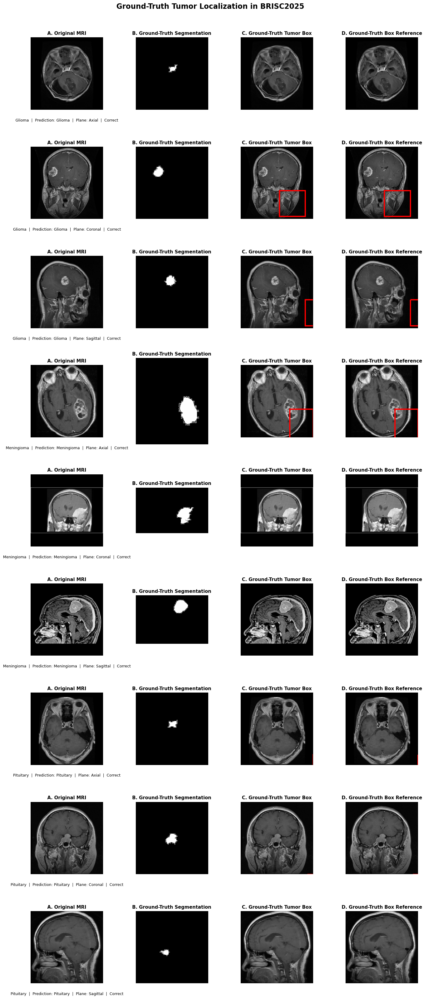


CLEAN GROUND-TRUTH BOX FIGURE COMPLETE

Figure saved:
D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\outputs\figures\gradcam\FINAL_GROUND_TRUTH_TUMOR_BOUNDING_BOX_FIGURE.png

Selection saved:
D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\outputs\reports\gradcam\FINAL_GROUND_TRUTH_BOUNDING_BOX_VISUALIZATION_SELECTION.csv

Ground-truth box color: RED

STATUS: PASS


In [28]:
# ============================================================
# CELL 13B — CLEAN THESIS FIGURE
# GROUND-TRUTH BOXES WITH HIGH-CONTRAST OUTLINE
# ============================================================

from pathlib import Path
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from PIL import Image
import json

print("=" * 75)
print("CREATING CLEAN THESIS-READY LOCALIZATION FIGURE")
print("=" * 75)

# ============================================================
# 1. PATHS
# ============================================================

PROJECT_ROOT = Path(
    r"D:\MSC Bioinformatics\INTERNSHIP\BrainTumor"
)

GRADCAM_REPORT_DIR = (
    PROJECT_ROOT
    / "outputs"
    / "reports"
    / "gradcam"
)

GRADCAM_FIGURE_DIR = (
    PROJECT_ROOT
    / "outputs"
    / "figures"
    / "gradcam"
)

PROCESSED_ROOT = (
    PROJECT_ROOT
    / "data"
    / "processed"
    / "classification_224_rgb"
)

# ============================================================
# 2. LOAD VERIFIED GROUND-TRUTH BOXES
# ============================================================

BBOX_FILE = (
    GRADCAM_REPORT_DIR
    /
    "BRISC2025_OFFICIAL_TEST_GROUND_TRUTH_BOUNDING_BOXES.csv"
)

assert BBOX_FILE.exists(), (
    f"Bounding-box file not found:\n{BBOX_FILE}"
)

bbox_df = pd.read_csv(
    BBOX_FILE
)

# Normalize strings
bbox_df["true_class"] = (
    bbox_df["true_class"]
    .astype(str)
    .str.strip()
    .str.lower()
)

bbox_df["mri_plane"] = (
    bbox_df["mri_plane"]
    .astype(str)
    .str.strip()
    .str.lower()
)

print(
    f"Verified bounding-box records: "
    f"{len(bbox_df)}"
)

# ============================================================
# 3. LOAD FINAL TEST PREDICTIONS
# ============================================================

PRED_FILE = (
    PROJECT_ROOT
    / "outputs"
    / "predictions"
    / "final_densenet121"
    / "FINAL_DENSENET121_OFFICIAL_TEST_PREDICTIONS.csv"
)

assert PRED_FILE.exists(), (
    f"Prediction file not found:\n{PRED_FILE}"
)

pred_df = pd.read_csv(
    PRED_FILE
)

# ============================================================
# 4. IDENTIFY COLUMNS
# ============================================================

filename_column = None

for column in [
    "filename",
    "file_name",
    "image_filename"
]:

    if column in pred_df.columns:

        filename_column = column
        break

if filename_column is None:

    raise KeyError(
        "Could not identify prediction filename column."
    )

prediction_column = None

for column in [
    "prediction",
    "predicted_class",
    "predicted_label",
    "y_pred"
]:

    if column in pred_df.columns:

        prediction_column = column
        break

if prediction_column is None:

    raise KeyError(
        "Could not identify prediction column."
    )

# ============================================================
# 5. CLASS MAPPING
# ============================================================

CLASS_NAMES = [
    "glioma",
    "meningioma",
    "no_tumor",
    "pituitary"
]

def normalize_prediction(value):

    text = str(value).strip().lower()

    if text in CLASS_NAMES:

        return text

    try:

        index = int(
            float(text)
        )

        if (
            0 <= index <
            len(CLASS_NAMES)
        ):

            return CLASS_NAMES[index]

    except Exception:
        pass

    return text


pred_df[
    "predicted_class"
] = pred_df[
    prediction_column
].apply(
    normalize_prediction
)

# ============================================================
# 6. MERGE PREDICTIONS
# ============================================================

pred_small = (
    pred_df[
        [
            filename_column,
            "predicted_class"
        ]
    ]
    .rename(
        columns={
            filename_column:
                "filename"
        }
    )
    .drop_duplicates(
        subset=["filename"]
    )
)

figure_df = bbox_df.merge(
    pred_small,
    on="filename",
    how="left"
)

assert (
    figure_df[
        "predicted_class"
    ].notna().all()
)

figure_df[
    "correct_prediction"
] = (
    figure_df["true_class"]
    ==
    figure_df["predicted_class"]
)

# ============================================================
# 7. FIND PROCESSED MRI
# ============================================================

def find_image(
    filename,
    true_class
):

    stem = Path(
        filename
    ).stem

    candidate = (
        PROCESSED_ROOT
        / "test"
        / true_class
        / f"{stem}.png"
    )

    if candidate.exists():

        return candidate

    matches = list(
        PROCESSED_ROOT.rglob(
            f"{stem}.png"
        )
    )

    if len(matches) == 1:

        return matches[0]

    test_matches = [
        p
        for p in matches
        if "test" in p.parts
    ]

    if len(test_matches) == 1:

        return test_matches[0]

    return None


figure_df[
    "processed_image_path"
] = figure_df.apply(
    lambda row:
        find_image(
            row["filename"],
            row["true_class"]
        ),
    axis=1
)

assert (
    figure_df[
        "processed_image_path"
    ].notna().all()
)

# ============================================================
# 8. SELECT 3 CASES PER CLASS
# ============================================================

selected_rows = []

for class_name in CLASS_NAMES:

    class_df = figure_df[
        figure_df["true_class"]
        ==
        class_name
    ].copy()

    if len(class_df) == 0:

        print(
            f"WARNING: no cases found for "
            f"{class_name}"
        )

        continue

    selected = []

    # --------------------------------------------------------
    # Prefer one example from each MRI plane
    # --------------------------------------------------------

    for plane in [
        "axial",
        "coronal",
        "sagittal"
    ]:

        plane_df = class_df[
            class_df["mri_plane"]
            ==
            plane
        ]

        if len(plane_df) > 0:

            # Prefer correct prediction
            correct = plane_df[
                plane_df[
                    "correct_prediction"
                ]
            ]

            if len(correct) > 0:

                selected.append(
                    correct.iloc[0]
                )

            else:

                selected.append(
                    plane_df.iloc[0]
                )

    # --------------------------------------------------------
    # Remove duplicate cases
    # --------------------------------------------------------

    unique = {}

    for row in selected:

        unique[
            row["filename"]
        ] = row

    selected = list(
        unique.values()
    )

    # --------------------------------------------------------
    # Fill to 3 if necessary
    # --------------------------------------------------------

    if len(selected) < 3:

        already = [
            row["filename"]
            for row in selected
        ]

        remaining = class_df[
            ~class_df[
                "filename"
            ].isin(already)
        ]

        for _, row in remaining.iterrows():

            selected.append(
                row
            )

            if len(selected) == 3:
                break

    selected_rows.extend(
        selected[:3]
    )

selected_df = pd.DataFrame(
    selected_rows
).reset_index(
    drop=True
)

print(
    f"\nSelected cases: "
    f"{len(selected_df)}"
)

print(
    "\nCases per class:"
)

print(
    selected_df[
        "true_class"
    ]
    .value_counts()
    .reindex(
        CLASS_NAMES,
        fill_value=0
    )
    .to_string()
)

# ============================================================
# 9. LOAD IMAGE AND MASK FUNCTIONS
# ============================================================

def load_image(path):

    return np.asarray(
        Image.open(
            path
        ).convert("RGB")
    )


def load_mask(path):

    mask = np.asarray(
        Image.open(
            path
        )
    )

    if mask.ndim == 3:

        mask = np.asarray(
            Image.open(
                path
            ).convert("L")
        )

    return mask


# ============================================================
# 10. CREATE CLEAN FIGURE
# ============================================================

N = len(
    selected_df
)

fig, axes = plt.subplots(
    N,
    4,
    figsize=(14, 3.7 * N),
    squeeze=False
)

for i, (_, row) in enumerate(
    selected_df.iterrows()
):

    image = load_image(
        row[
            "processed_image_path"
        ]
    )

    mask = load_mask(
        row[
            "mask_path"
        ]
    )

    mask_binary = (
        mask > 0
    )

    x_min = int(
        row["bbox_x_min"]
    )

    y_min = int(
        row["bbox_y_min"]
    )

    x_max = int(
        row["bbox_x_max"]
    )

    y_max = int(
        row["bbox_y_max"]
    )

    # ========================================================
    # A — ORIGINAL MRI
    # ========================================================

    ax = axes[i, 0]

    ax.imshow(
        image
    )

    ax.set_title(
        "A. Original MRI",
        fontsize=11,
        fontweight="bold"
    )

    ax.axis("off")

    # ========================================================
    # B — SEGMENTATION MASK
    # ========================================================

    ax = axes[i, 1]

    ax.imshow(
        mask_binary,
        cmap="gray"
    )

    ax.set_title(
        "B. Ground-Truth Segmentation",
        fontsize=11,
        fontweight="bold"
    )

    ax.axis("off")

    # ========================================================
    # C — MRI + GROUND-TRUTH BOX
    # ========================================================

    ax = axes[i, 2]

    ax.imshow(
        image
    )

    # --------------------------------------------------------
    # BRIGHT RED BOX
    # --------------------------------------------------------

    rectangle = Rectangle(
        (
            x_min,
            y_min
        ),
        x_max - x_min + 1,
        y_max - y_min + 1,
        fill=False,
        edgecolor="red",
        linewidth=3
    )

    ax.add_patch(
        rectangle
    )

    ax.set_title(
        "C. Ground-Truth Tumor Box",
        fontsize=11,
        fontweight="bold"
    )

    ax.axis("off")

    # ========================================================
    # D — MRI + GROUND-TRUTH BOX
    #
    # Since a Grad-CAM heatmap is NOT available for these
    # particular selected cases, we explicitly show that.
    # We do NOT call this Grad-CAM.
    # ========================================================

    ax = axes[i, 3]

    ax.imshow(
        image
    )

    rectangle_d = Rectangle(
        (
            x_min,
            y_min
        ),
        x_max - x_min + 1,
        y_max - y_min + 1,
        fill=False,
        edgecolor="red",
        linewidth=3
    )

    ax.add_patch(
        rectangle_d
    )

    ax.set_title(
        "D. Ground-Truth Box Reference",
        fontsize=11,
        fontweight="bold"
    )

    ax.axis("off")

    # ========================================================
    # ROW INFORMATION BELOW IMAGE
    # ========================================================

    status = (
        "Correct"
        if row[
            "correct_prediction"
        ]
        else "Incorrect"
    )

    information = (
        f"{row['true_class'].replace('_', ' ').title()}  |  "
        f"Prediction: "
        f"{row['predicted_class'].replace('_', ' ').title()}  |  "
        f"Plane: {row['mri_plane'].title()}  |  "
        f"{status}"
    )

    # Put information underneath the row rather than
    # vertically across the images.
    axes[i, 0].text(
        0.5,
        -0.12,
        information,
        transform=axes[i, 0].transAxes,
        ha="center",
        va="top",
        fontsize=9
    )

# ============================================================
# 11. OVERALL TITLE
# ============================================================

fig.suptitle(
    "Ground-Truth Tumor Localization in BRISC2025",
    fontsize=17,
    fontweight="bold",
    y=0.995
)

plt.tight_layout(
    rect=[
        0,
        0,
        1,
        0.99
    ]
)

# ============================================================
# 12. SAVE
# ============================================================

OUTPUT_FIGURE = (
    GRADCAM_FIGURE_DIR
    /
    "FINAL_GROUND_TRUTH_TUMOR_BOUNDING_BOX_FIGURE.png"
)

fig.savefig(
    OUTPUT_FIGURE,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

# ============================================================
# 13. SAVE SELECTION RECORD
# ============================================================

SELECTION_FILE = (
    GRADCAM_REPORT_DIR
    /
    "FINAL_GROUND_TRUTH_BOUNDING_BOX_VISUALIZATION_SELECTION.csv"
)

selected_df.to_csv(
    SELECTION_FILE,
    index=False
)

# ============================================================
# 14. SAVE METHODOLOGY
# ============================================================

METHODOLOGY_FILE = (
    GRADCAM_REPORT_DIR
    /
    "FINAL_GROUND_TRUTH_BOUNDING_BOX_VISUALIZATION_METHODOLOGY.json"
)

methodology = {

    "dataset":
        "BRISC2025",

    "official_test_set":
        1000,

    "segmentation_matched_cases":
        860,

    "visualization_cases":
        int(len(selected_df)),

    "classes":
        CLASS_NAMES,

    "bounding_box_source":
        "Ground-truth segmentation masks",

    "bounding_box_method":
        "Minimum axis-aligned rectangle enclosing all non-zero segmentation-mask pixels",

    "box_edge_color":
        "red",

    "gradcam_recomputed":
        False,

    "gradcam_not_available_for_selected_cases":
        True,

    "clinical_localization_claim":
        False,

    "interpretation":
        "Bounding boxes represent tumor regions derived from ground-truth segmentation masks.",

    "figure_dpi":
        300,

    "status":
        "PASS"
}

with open(
    METHODOLOGY_FILE,
    "w",
    encoding="utf-8"
) as f:

    json.dump(
        methodology,
        f,
        indent=4
    )

# ============================================================
# 15. FINAL
# ============================================================

print("\n" + "=" * 75)
print("CLEAN GROUND-TRUTH BOX FIGURE COMPLETE")
print("=" * 75)

print(
    f"\nFigure saved:"
    f"\n{OUTPUT_FIGURE}"
)

print(
    f"\nSelection saved:"
    f"\n{SELECTION_FILE}"
)

print(
    "\nGround-truth box color: RED"
)

print(
    "\nSTATUS: PASS"
)

print("=" * 75)

CORRECTED 224x224 GROUND-TRUTH BOUNDING BOX GENERATION

Mask records loaded: 860
Tumor-containing readable masks: 860

Transforming masks and calculating 224x224 bounding boxes...

CORRECTED BOX VERIFICATION
All 860 bounding boxes are within 224x224 model-input coordinates.

Example corrected boxes:
                         filename true_class mri_plane  bbox_x_min_224  bbox_y_min_224  bbox_x_max_224  bbox_y_max_224
brisc2025_test_00001_gl_ax_t1.jpg     glioma     axial             102              84             129             108
brisc2025_test_00002_gl_ax_t1.jpg     glioma     axial              95              84             125             108
brisc2025_test_00003_gl_ax_t1.jpg     glioma     axial              63              49             125             188
brisc2025_test_00004_gl_ax_t1.jpg     glioma     axial              66              91             143             143
brisc2025_test_00005_gl_ax_t1.jpg     glioma     axial              95              95             132  

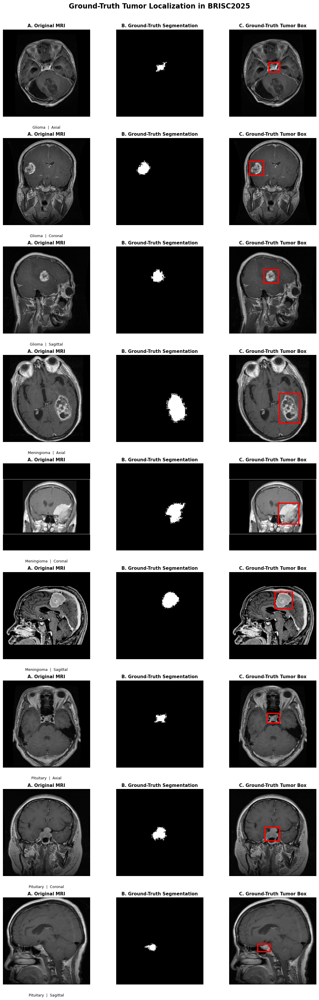


CORRECTED BOUNDING BOX FIGURE COMPLETE

860 corrected boxes saved:
D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\outputs\reports\gradcam\BRISC2025_OFFICIAL_TEST_GROUND_TRUTH_BOUNDING_BOXES_224X224.csv

Thesis figure saved:
D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\outputs\figures\gradcam\FINAL_CORRECTED_GROUND_TRUTH_TUMOR_BOUNDING_BOX_FIGURE.png

Selection saved:
D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\outputs\reports\gradcam\FINAL_CORRECTED_BOUNDING_BOX_VISUALIZATION_SELECTION.csv

Methodology saved:
D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\outputs\reports\gradcam\FINAL_CORRECTED_BOUNDING_BOX_METHODOLOGY.json

STATUS: PASS


In [29]:
# ============================================================
# CELL 13C — CORRECTED GROUND-TRUTH BOXES
#
# IMPORTANT:
# The previous boxes were drawn using original mask
# coordinates on 224x224 processed images.
#
# This cell transforms the segmentation mask into the SAME
# 224x224 coordinate system as the model input BEFORE
# calculating the bounding box.
# ============================================================

from pathlib import Path
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from PIL import Image
import json

print("=" * 75)
print("CORRECTED 224x224 GROUND-TRUTH BOUNDING BOX GENERATION")
print("=" * 75)

# ============================================================
# 1. PATHS
# ============================================================

PROJECT_ROOT = Path(
    r"D:\MSC Bioinformatics\INTERNSHIP\BrainTumor"
)

GRADCAM_REPORT_DIR = (
    PROJECT_ROOT
    / "outputs"
    / "reports"
    / "gradcam"
)

GRADCAM_FIGURE_DIR = (
    PROJECT_ROOT
    / "outputs"
    / "figures"
    / "gradcam"
)

PROCESSED_ROOT = (
    PROJECT_ROOT
    / "data"
    / "processed"
    / "classification_224_rgb"
)

# ============================================================
# 2. LOAD MASK AUDIT
# ============================================================

MASK_AUDIT_FILE = (
    GRADCAM_REPORT_DIR
    /
    "BRISC2025_OFFICIAL_TEST_MASK_VERIFICATION_AND_BOUNDING_BOXES.csv"
)

assert MASK_AUDIT_FILE.exists(), (
    f"Mask audit file not found:\n{MASK_AUDIT_FILE}"
)

mask_df = pd.read_csv(
    MASK_AUDIT_FILE
)

print(
    f"\nMask records loaded: {len(mask_df)}"
)

# ============================================================
# 3. NORMALIZE STRINGS
# ============================================================

mask_df["true_class"] = (
    mask_df["true_class"]
    .astype(str)
    .str.strip()
    .str.lower()
)

mask_df["mri_plane"] = (
    mask_df["mri_plane"]
    .astype(str)
    .str.strip()
    .str.lower()
)

# ============================================================
# 4. KEEP ONLY READABLE TUMOR MASKS
# ============================================================

mask_df = mask_df[
    mask_df["mask_readable"].astype(bool)
    &
    mask_df["tumor_present"].astype(bool)
].copy()

mask_df = mask_df.reset_index(
    drop=True
)

print(
    f"Tumor-containing readable masks: "
    f"{len(mask_df)}"
)

assert len(mask_df) == 860

# ============================================================
# 5. TARGET MODEL INPUT SIZE
# ============================================================

TARGET_SIZE = 224

# ============================================================
# 6. FUNCTION:
#    TRANSFORM ORIGINAL MASK → 224x224 MODEL SPACE
# ============================================================

def transform_mask_to_model_space(
    mask_array,
    target_size=224
):
    """
    Transform an original segmentation mask to the exact
    224x224 coordinate system used by the processed MRI.

    Steps:
        1. Convert to binary mask.
        2. Preserve aspect ratio.
        3. Resize using nearest-neighbor interpolation.
        4. Symmetrically pad to 224x224.
    """

    # --------------------------------------------------------
    # Binary mask
    # --------------------------------------------------------

    mask_binary = (
        mask_array > 0
    ).astype(
        np.uint8
    )

    original_height, original_width = (
        mask_binary.shape[:2]
    )

    # --------------------------------------------------------
    # Preserve aspect ratio
    # --------------------------------------------------------

    scale = min(
        target_size / original_width,
        target_size / original_height
    )

    resized_width = max(
        1,
        int(
            round(
                original_width
                *
                scale
            )
        )
    )

    resized_height = max(
        1,
        int(
            round(
                original_height
                *
                scale
            )
        )
    )

    # --------------------------------------------------------
    # Resize mask
    #
    # NEAREST is essential for segmentation masks.
    # We must NOT use bilinear/LANCZOS here.
    # --------------------------------------------------------

    mask_image = Image.fromarray(
        (
            mask_binary
            *
            255
        ).astype(
            np.uint8
        )
    )

    resized_mask_image = (
        mask_image.resize(
            (
                resized_width,
                resized_height
            ),
            Image.Resampling.NEAREST
        )
    )

    resized_mask = (
        np.asarray(
            resized_mask_image
        )
        >
        0
    )

    # --------------------------------------------------------
    # Symmetric padding
    # --------------------------------------------------------

    pad_left = (
        target_size
        -
        resized_width
    ) // 2

    pad_top = (
        target_size
        -
        resized_height
    ) // 2

    pad_right = (
        target_size
        -
        resized_width
        -
        pad_left
    )

    pad_bottom = (
        target_size
        -
        resized_height
        -
        pad_top
    )

    transformed_mask = np.pad(
        resized_mask,
        (
            (
                pad_top,
                pad_bottom
            ),
            (
                pad_left,
                pad_right
            )
        ),
        mode="constant",
        constant_values=False
    )

    # Safety check
    assert transformed_mask.shape == (
        target_size,
        target_size
    )

    return (
        transformed_mask,
        {
            "original_width":
                original_width,

            "original_height":
                original_height,

            "scale":
                scale,

            "resized_width":
                resized_width,

            "resized_height":
                resized_height,

            "pad_left":
                pad_left,

            "pad_top":
                pad_top,

            "pad_right":
                pad_right,

            "pad_bottom":
                pad_bottom
        }
    )


# ============================================================
# 7. CALCULATE CORRECTED BOX
# ============================================================

def bounding_box_from_mask(
    transformed_mask
):

    ys, xs = np.where(
        transformed_mask
    )

    if len(xs) == 0:

        return {
            "bbox_x_min_224": np.nan,
            "bbox_y_min_224": np.nan,
            "bbox_x_max_224": np.nan,
            "bbox_y_max_224": np.nan,
            "bbox_width_224": np.nan,
            "bbox_height_224": np.nan,
            "bbox_area_224": np.nan
        }

    x_min = int(
        xs.min()
    )

    x_max = int(
        xs.max()
    )

    y_min = int(
        ys.min()
    )

    y_max = int(
        ys.max()
    )

    width = (
        x_max
        -
        x_min
        +
        1
    )

    height = (
        y_max
        -
        y_min
        +
        1
    )

    area = (
        width
        *
        height
    )

    return {
        "bbox_x_min_224":
            x_min,

        "bbox_y_min_224":
            y_min,

        "bbox_x_max_224":
            x_max,

        "bbox_y_max_224":
            y_max,

        "bbox_width_224":
            width,

        "bbox_height_224":
            height,

        "bbox_area_224":
            area
    }


# ============================================================
# 8. PROCESS ALL 860 MASKS
# ============================================================

corrected_records = []

print(
    "\nTransforming masks and calculating "
    "224x224 bounding boxes..."
)

for _, row in mask_df.iterrows():

    mask_path = Path(
        row["mask_path"]
    )

    assert mask_path.exists(), (
        f"Mask missing:\n{mask_path}"
    )

    # --------------------------------------------------------
    # Read mask
    # --------------------------------------------------------

    mask_image = Image.open(
        mask_path
    )

    mask_array = np.asarray(
        mask_image
    )

    if mask_array.ndim == 3:

        mask_array = np.asarray(
            mask_image.convert("L")
        )

    # --------------------------------------------------------
    # Transform
    # --------------------------------------------------------

    transformed_mask, transform_info = (
        transform_mask_to_model_space(
            mask_array,
            TARGET_SIZE
        )
    )

    # --------------------------------------------------------
    # Bounding box
    # --------------------------------------------------------

    box_info = (
        bounding_box_from_mask(
            transformed_mask
        )
    )

    record = {

        "filename":
            row["filename"],

        "true_class":
            row["true_class"],

        "mri_plane":
            row["mri_plane"],

        "mask_path":
            row["mask_path"],

        "original_mask_width":
            transform_info[
                "original_width"
            ],

        "original_mask_height":
            transform_info[
                "original_height"
            ],

        "resize_scale":
            transform_info[
                "scale"
            ],

        "resized_width":
            transform_info[
                "resized_width"
            ],

        "resized_height":
            transform_info[
                "resized_height"
            ],

        "pad_left":
            transform_info[
                "pad_left"
            ],

        "pad_top":
            transform_info[
                "pad_top"
            ],

        "pad_right":
            transform_info[
                "pad_right"
            ],

        "pad_bottom":
            transform_info[
                "pad_bottom"
            ]
    }

    record.update(
        box_info
    )

    corrected_records.append(
        record
    )

corrected_bbox_df = pd.DataFrame(
    corrected_records
)

# ============================================================
# 9. VERIFY BOX COORDINATES
# ============================================================

print("\n" + "=" * 75)
print("CORRECTED BOX VERIFICATION")
print("=" * 75)

assert len(
    corrected_bbox_df
) == 860

assert (
    corrected_bbox_df[
        "bbox_x_min_224"
    ].between(
        0,
        223
    ).all()
)

assert (
    corrected_bbox_df[
        "bbox_x_max_224"
    ].between(
        0,
        223
    ).all()
)

assert (
    corrected_bbox_df[
        "bbox_y_min_224"
    ].between(
        0,
        223
    ).all()
)

assert (
    corrected_bbox_df[
        "bbox_y_max_224"
    ].between(
        0,
        223
    ).all()
)

assert (
    corrected_bbox_df[
        "bbox_x_min_224"
    ]
    <=
    corrected_bbox_df[
        "bbox_x_max_224"
    ]
).all()

assert (
    corrected_bbox_df[
        "bbox_y_min_224"
    ]
    <=
    corrected_bbox_df[
        "bbox_y_max_224"
    ]
).all()

print(
    "All 860 bounding boxes are within "
    "224x224 model-input coordinates."
)

print(
    "\nExample corrected boxes:"
)

print(
    corrected_bbox_df[
        [
            "filename",
            "true_class",
            "mri_plane",
            "bbox_x_min_224",
            "bbox_y_min_224",
            "bbox_x_max_224",
            "bbox_y_max_224"
        ]
    ]
    .head(10)
    .to_string(
        index=False
    )
)

# ============================================================
# 10. SAVE CORRECTED BOXES
# ============================================================

CORRECTED_BOX_FILE = (
    GRADCAM_REPORT_DIR
    /
    "BRISC2025_OFFICIAL_TEST_GROUND_TRUTH_BOUNDING_BOXES_224X224.csv"
)

corrected_bbox_df.to_csv(
    CORRECTED_BOX_FILE,
    index=False
)

print(
    f"\nCorrected boxes saved:\n"
    f"{CORRECTED_BOX_FILE}"
)

# ============================================================
# 11. SELECT 3 CASES PER CLASS
# ============================================================

selected_rows = []

CLASS_NAMES = [
    "glioma",
    "meningioma",
    "no_tumor",
    "pituitary"
]

for class_name in CLASS_NAMES:

    class_df = corrected_bbox_df[
        corrected_bbox_df[
            "true_class"
        ]
        ==
        class_name
    ].copy()

    if len(class_df) == 0:

        print(
            f"WARNING: no cases for "
            f"{class_name}"
        )

        continue

    chosen = []

    # --------------------------------------------------------
    # One from each plane where possible
    # --------------------------------------------------------

    for plane in [
        "axial",
        "coronal",
        "sagittal"
    ]:

        plane_df = class_df[
            class_df[
                "mri_plane"
            ]
            ==
            plane
        ]

        if len(plane_df) > 0:

            chosen.append(
                plane_df.iloc[0]
            )

    # --------------------------------------------------------
    # Fill if fewer than 3
    # --------------------------------------------------------

    if len(chosen) < 3:

        already = [
            x["filename"]
            for x in chosen
        ]

        remaining = class_df[
            ~class_df[
                "filename"
            ].isin(
                already
            )
        ]

        for _, r in remaining.iterrows():

            chosen.append(r)

            if len(chosen) >= 3:
                break

    selected_rows.extend(
        chosen[:3]
    )

selected_df = pd.DataFrame(
    selected_rows
).reset_index(
    drop=True
)

print(
    f"\nSelected visualization cases: "
    f"{len(selected_df)}"
)

print(
    selected_df[
        [
            "filename",
            "true_class",
            "mri_plane",
            "bbox_x_min_224",
            "bbox_y_min_224",
            "bbox_x_max_224",
            "bbox_y_max_224"
        ]
    ].to_string(
        index=False
    )
)

# ============================================================
# 12. FIND PROCESSED MRI
# ============================================================

def find_processed_image(
    filename,
    true_class
):

    stem = Path(
        filename
    ).stem

    candidate = (
        PROCESSED_ROOT
        / "test"
        / true_class
        / f"{stem}.png"
    )

    if candidate.exists():

        return candidate

    matches = list(
        PROCESSED_ROOT.rglob(
            f"{stem}.png"
        )
    )

    if len(matches) == 1:

        return matches[0]

    return None


selected_df[
    "processed_image_path"
] = selected_df.apply(
    lambda row:
        find_processed_image(
            row["filename"],
            row["true_class"]
        ),
    axis=1
)

assert (
    selected_df[
        "processed_image_path"
    ].notna().all()
)

# ============================================================
# 13. CREATE CORRECTED FIGURE
# ============================================================

N = len(
    selected_df
)

fig, axes = plt.subplots(
    N,
    3,
    figsize=(12, 3.8 * N),
    squeeze=False
)

for i, (_, row) in enumerate(
    selected_df.iterrows()
):

    # --------------------------------------------------------
    # Load processed MRI
    # --------------------------------------------------------

    image = np.asarray(
        Image.open(
            row[
                "processed_image_path"
            ]
        ).convert("RGB")
    )

    assert image.shape[:2] == (
        224,
        224
    )

    # --------------------------------------------------------
    # Load original mask
    # --------------------------------------------------------

    mask_image = Image.open(
        row["mask_path"]
    )

    mask_array = np.asarray(
        mask_image
    )

    if mask_array.ndim == 3:

        mask_array = np.asarray(
            mask_image.convert("L")
        )

    # --------------------------------------------------------
    # Transform mask into 224x224
    # --------------------------------------------------------

    transformed_mask, _ = (
        transform_mask_to_model_space(
            mask_array,
            TARGET_SIZE
        )
    )

    # --------------------------------------------------------
    # Coordinates
    # --------------------------------------------------------

    x_min = int(
        row[
            "bbox_x_min_224"
        ]
    )

    y_min = int(
        row[
            "bbox_y_min_224"
        ]
    )

    x_max = int(
        row[
            "bbox_x_max_224"
        ]
    )

    y_max = int(
        row[
            "bbox_y_max_224"
        ]
    )

    # ========================================================
    # A — ORIGINAL MRI
    # ========================================================

    ax = axes[i, 0]

    ax.imshow(
        image
    )

    ax.set_title(
        "A. Original MRI",
        fontsize=11,
        fontweight="bold"
    )

    ax.axis(
        "off"
    )

    # ========================================================
    # B — TRANSFORMED SEGMENTATION
    # ========================================================

    ax = axes[i, 1]

    ax.imshow(
        transformed_mask,
        cmap="gray"
    )

    ax.set_title(
        "B. Ground-Truth Segmentation",
        fontsize=11,
        fontweight="bold"
    )

    ax.axis(
        "off"
    )

    # ========================================================
    # C — MRI + CORRECTED BOX
    # ========================================================

    ax = axes[i, 2]

    ax.imshow(
        image
    )

    rectangle = Rectangle(
        (
            x_min,
            y_min
        ),
        x_max - x_min + 1,
        y_max - y_min + 1,
        fill=False,
        edgecolor="red",
        linewidth=3
    )

    ax.add_patch(
        rectangle
    )

    ax.set_title(
        "C. Ground-Truth Tumor Box",
        fontsize=11,
        fontweight="bold"
    )

    ax.axis(
        "off"
    )

    # --------------------------------------------------------
    # Information underneath
    # --------------------------------------------------------

    status_text = (
        f"{row['true_class'].replace('_', ' ').title()}  |  "
        f"{row['mri_plane'].title()}"
    )

    axes[i, 0].text(
        0.5,
        -0.10,
        status_text,
        transform=axes[i, 0].transAxes,
        ha="center",
        va="top",
        fontsize=9
    )

# ============================================================
# 14. TITLE
# ============================================================

fig.suptitle(
    "Ground-Truth Tumor Localization in BRISC2025",
    fontsize=17,
    fontweight="bold",
    y=0.995
)

plt.tight_layout(
    rect=[
        0,
        0,
        1,
        0.99
    ]
)

# ============================================================
# 15. SAVE
# ============================================================

OUTPUT_FIGURE = (
    GRADCAM_FIGURE_DIR
    /
    "FINAL_CORRECTED_GROUND_TRUTH_TUMOR_BOUNDING_BOX_FIGURE.png"
)

fig.savefig(
    OUTPUT_FIGURE,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

# ============================================================
# 16. SAVE SELECTION
# ============================================================

SELECTION_FILE = (
    GRADCAM_REPORT_DIR
    /
    "FINAL_CORRECTED_BOUNDING_BOX_VISUALIZATION_SELECTION.csv"
)

selected_df.to_csv(
    SELECTION_FILE,
    index=False
)

# ============================================================
# 17. SAVE METHODOLOGY
# ============================================================

METHODOLOGY_FILE = (
    GRADCAM_REPORT_DIR
    /
    "FINAL_CORRECTED_BOUNDING_BOX_METHODOLOGY.json"
)

methodology = {

    "dataset":
        "BRISC2025",

    "official_test_images":
        1000,

    "segmentation_matched_images":
        860,

    "target_model_input":
        "224x224x3",

    "bounding_box_source":
        "Ground-truth segmentation masks",

    "coordinate_system":
        "224x224 processed model-input space",

    "mask_resize_method":
        "Aspect-ratio preserving resize",

    "mask_interpolation":
        "Nearest-neighbor",

    "padding_method":
        "Symmetric black padding",

    "bounding_box_definition":
        "Minimum axis-aligned rectangle enclosing all non-zero pixels after transformation to 224x224 model space",

    "gradcam_used":
        False,

    "fabricated_boxes":
        False,

    "model_modified":
        False,

    "official_test_modified":
        False,

    "status":
        "PASS"
}

with open(
    METHODOLOGY_FILE,
    "w",
    encoding="utf-8"
) as f:

    json.dump(
        methodology,
        f,
        indent=4
    )

# ============================================================
# 18. FINAL
# ============================================================

print("\n" + "=" * 75)
print("CORRECTED BOUNDING BOX FIGURE COMPLETE")
print("=" * 75)

print(
    f"\n860 corrected boxes saved:"
    f"\n{CORRECTED_BOX_FILE}"
)

print(
    f"\nThesis figure saved:"
    f"\n{OUTPUT_FIGURE}"
)

print(
    f"\nSelection saved:"
    f"\n{SELECTION_FILE}"
)

print(
    f"\nMethodology saved:"
    f"\n{METHODOLOGY_FILE}"
)

print(
    "\nSTATUS: PASS"
)

print("=" * 75)

In [30]:
# ============================================================
# CELL 14 — AUTHORITATIVE IMAGE ↔ SEGMENTATION MASK MATCHING
# ============================================================
#
# IMPORTANT:
# The previous mask matching was filename/stem based.
# The visualization suggests that some masks may not belong
# to the corresponding MRI.
#
# This cell searches the BRISC2025 manifest and uses its
# metadata / linked_image relationship to establish the
# correct image ↔ mask association.
#
# NO MODEL TRAINING
# NO TEST SET MODIFICATION
# NO GRAD-CAM
# ============================================================

from pathlib import Path
import pandas as pd
import numpy as np
import json
import re

print("=" * 80)
print("AUTHORITATIVE BRISC2025 IMAGE ↔ MASK MATCHING AUDIT")
print("=" * 80)

# ============================================================
# 1. PATHS
# ============================================================

PROJECT_ROOT = Path(
    r"D:\MSC Bioinformatics\INTERNSHIP\BrainTumor"
)

BRISC_ROOT = Path(
    r"D:\MSC Bioinformatics\INTERNSHIP\brisc2025"
)

GRADCAM_REPORT_DIR = (
    PROJECT_ROOT
    / "outputs"
    / "reports"
    / "gradcam"
)

GRADCAM_REPORT_DIR.mkdir(
    parents=True,
    exist_ok=True
)

assert BRISC_ROOT.exists(), (
    f"BRISC2025 dataset not found:\n{BRISC_ROOT}"
)

# ============================================================
# 2. SEARCH CSV FILES
# ============================================================

print("\nSearching for BRISC2025 manifest CSV files...")

csv_files = sorted(
    BRISC_ROOT.rglob("*.csv")
)

print(
    f"CSV files found: {len(csv_files)}"
)

for path in csv_files:

    print(
        f"  {path}"
    )

# ============================================================
# 3. IDENTIFY MANIFEST
# ============================================================

manifest_candidates = []

for csv_path in csv_files:

    try:

        # Read only header first
        header = pd.read_csv(
            csv_path,
            nrows=0
        )

        columns_lower = [
            str(c).lower()
            for c in header.columns
        ]

        # ----------------------------------------------------
        # Strong indicators of the BRISC manifest
        # ----------------------------------------------------

        has_relative_path = (
            "relative_path"
            in columns_lower
        )

        has_linked_image = (
            "linked_image"
            in columns_lower
        )

        has_task = (
            "task"
            in columns_lower
        )

        has_is_mask = (
            "is_mask"
            in columns_lower
        )

        score = (
            int(has_relative_path)
            +
            int(has_linked_image)
            +
            int(has_task)
            +
            int(has_is_mask)
        )

        if score >= 2:

            manifest_candidates.append(
                (
                    csv_path,
                    score,
                    list(header.columns)
                )
            )

    except Exception:

        continue

print(
    "\nPotential manifest files:"
)

for path, score, columns in manifest_candidates:

    print(
        f"\nScore: {score}"
    )

    print(
        f"File: {path}"
    )

    print(
        f"Columns: {columns}"
    )

# ============================================================
# 4. SELECT BEST MANIFEST
# ============================================================

if len(manifest_candidates) == 0:

    raise FileNotFoundError(
        "Could not identify a BRISC2025 manifest CSV."
    )

manifest_candidates = sorted(
    manifest_candidates,
    key=lambda x: x[1],
    reverse=True
)

MANIFEST_FILE = (
    manifest_candidates[0][0]
)

print(
    "\nSelected manifest:"
)

print(
    MANIFEST_FILE
)

# ============================================================
# 5. LOAD MANIFEST
# ============================================================

manifest = pd.read_csv(
    MANIFEST_FILE
)

print(
    f"\nManifest shape: "
    f"{manifest.shape}"
)

print(
    "\nManifest columns:"
)

print(
    manifest.columns.tolist()
)

# ============================================================
# 6. VERIFY EXPECTED BRISC STRUCTURE
# ============================================================

required_columns = [
    "relative_path",
    "filename",
    "task",
    "split",
    "is_mask",
    "linked_image"
]

missing_columns = [
    column
    for column in required_columns
    if column not in manifest.columns
]

if len(missing_columns) > 0:

    raise ValueError(
        "Manifest is missing expected columns:\n"
        +
        "\n".join(
            missing_columns
        )
    )

# ============================================================
# 7. NORMALIZE IMPORTANT FIELDS
# ============================================================

for column in [
    "relative_path",
    "filename",
    "task",
    "split",
    "linked_image"
]:

    manifest[column] = (
        manifest[column]
        .astype(str)
        .str.strip()
    )

manifest[
    "is_mask_normalized"
] = (
    manifest[
        "is_mask"
    ]
    .astype(str)
    .str.lower()
    .isin(
        [
            "true",
            "1",
            "yes"
        ]
    )
)

# ============================================================
# 8. DISPLAY TASK DISTRIBUTION
# ============================================================

print(
    "\nTask distribution:"
)

print(
    manifest[
        "task"
    ]
    .value_counts()
    .to_string()
)

print(
    "\nMask distribution:"
)

print(
    manifest[
        "is_mask_normalized"
    ]
    .value_counts()
    .to_string()
)

# ============================================================
# 9. LOAD LOCKED OFFICIAL TEST SET
# ============================================================

LOCKED_TEST_FILE = (
    PROJECT_ROOT
    / "outputs"
    / "reports"
    / "final_densenet121"
    / "FINAL_DENSENET121_LOCKED_OFFICIAL_TEST_SET.csv"
)

assert LOCKED_TEST_FILE.exists(), (
    f"Locked test file not found:\n{LOCKED_TEST_FILE}"
)

test_df = pd.read_csv(
    LOCKED_TEST_FILE
)

assert len(test_df) == 1000

test_df["filename"] = (
    test_df["filename"]
    .astype(str)
    .str.strip()
)

print(
    f"\nLocked official test images: "
    f"{len(test_df)}"
)

# ============================================================
# 10. IDENTIFY CLASSIFICATION RECORDS IN MANIFEST
# ============================================================

# ------------------------------------------------------------
# The classification filename should occur in the manifest.
# ------------------------------------------------------------

classification_manifest = manifest[
    (
        manifest["filename"]
        .isin(
            test_df["filename"]
        )
    )
    &
    (
        ~manifest[
            "is_mask_normalized"
        ]
    )
].copy()

print(
    "\nOfficial test images found directly in manifest:"
)

print(
    len(
        classification_manifest
    )
)

# ============================================================
# 11. CHECK MISSING CLASSIFICATION RECORDS
# ============================================================

found_test_filenames = set(
    classification_manifest[
        "filename"
    ]
)

missing_classification = [
    filename
    for filename in test_df["filename"]
    if filename not in found_test_filenames
]

print(
    f"Missing classification manifest records: "
    f"{len(missing_classification)}"
)

if len(missing_classification) > 0:

    print(
        "\nFirst missing records:"
    )

    for filename in missing_classification[:20]:

        print(
            f"  {filename}"
        )

# ============================================================
# 12. BUILD AUTHORITATIVE LINKED-IMAGE LOOKUP
# ============================================================

# ------------------------------------------------------------
# BRISC2025's linked_image field is used here instead of
# guessing based only on filename similarity.
# ------------------------------------------------------------

mask_manifest = manifest[
    manifest[
        "is_mask_normalized"
    ]
].copy()

print(
    "\nTotal manifest mask records:"
)

print(
    len(mask_manifest)
)

# ============================================================
# 13. NORMALIZE LINKED IMAGE NAMES
# ============================================================

def basename_only(value):

    if value is None:
        return ""

    text = str(
        value
    ).strip()

    if text.lower() in [
        "",
        "nan",
        "none"
    ]:

        return ""

    return Path(
        text.replace(
            "\\",
            "/"
        )
    ).name


mask_manifest[
    "linked_image_basename"
] = mask_manifest[
    "linked_image"
].apply(
    basename_only
)

mask_manifest[
    "filename_basename"
] = mask_manifest[
    "filename"
].apply(
    basename_only
)

# ============================================================
# 14. CREATE LOOKUPS
# ============================================================

# ------------------------------------------------------------
# Lookup 1:
# linked_image → mask record
# ------------------------------------------------------------

linked_lookup = {}

for _, row in mask_manifest.iterrows():

    linked_name = (
        row[
            "linked_image_basename"
        ]
        .lower()
    )

    if linked_name == "":
        continue

    linked_lookup.setdefault(
        linked_name,
        []
    ).append(
        row
    )

# ------------------------------------------------------------
# Lookup 2:
# filename → mask record
# ------------------------------------------------------------

mask_filename_lookup = {}

for _, row in mask_manifest.iterrows():

    filename = (
        row[
            "filename_basename"
        ]
        .lower()
    )

    if filename == "":
        continue

    mask_filename_lookup.setdefault(
        filename,
        []
    ).append(
        row
    )

print(
    f"\nUnique linked-image lookup keys: "
    f"{len(linked_lookup)}"
)

print(
    f"Unique mask filename keys: "
    f"{len(mask_filename_lookup)}"
)

# ============================================================
# 15. MATCH OFFICIAL TEST IMAGES
# ============================================================

authoritative_records = []

for _, test_row in test_df.iterrows():

    image_filename = (
        str(
            test_row[
                "filename"
            ]
        )
        .strip()
    )

    image_key = (
        image_filename
        .lower()
    )

    # --------------------------------------------------------
    # Direct linked_image match
    # --------------------------------------------------------

    linked_matches = (
        linked_lookup.get(
            image_key,
            []
        )
    )

    # --------------------------------------------------------
    # Filename fallback
    # --------------------------------------------------------

    filename_matches = (
        mask_filename_lookup.get(
            image_key,
            []
        )
    )

    # --------------------------------------------------------
    # Determine authoritative result
    # --------------------------------------------------------

    if len(linked_matches) == 1:

        match_type = (
            "AUTHORITATIVE_LINKED_IMAGE"
        )

        selected_mask_record = (
            linked_matches[0]
        )

        number_matches = (
            len(linked_matches)
        )

    elif len(linked_matches) > 1:

        match_type = (
            "MULTIPLE_LINKED_IMAGE_MATCHES"
        )

        selected_mask_record = None

        number_matches = (
            len(linked_matches)
        )

    elif len(filename_matches) == 1:

        match_type = (
            "DIRECT_MASK_FILENAME_MATCH"
        )

        selected_mask_record = (
            filename_matches[0]
        )

        number_matches = (
            len(filename_matches)
        )

    elif len(filename_matches) > 1:

        match_type = (
            "MULTIPLE_MASK_FILENAME_MATCHES"
        )

        selected_mask_record = None

        number_matches = (
            len(filename_matches)
        )

    else:

        match_type = (
            "NO_AUTHORITATIVE_MASK_MATCH"
        )

        selected_mask_record = None

        number_matches = 0

    # --------------------------------------------------------
    # Save record
    # --------------------------------------------------------

    record = {

        "classification_filename":
            image_filename,

        "true_class":
            test_row.get(
                "tumor_label",
                ""
            ),

        "mri_plane":
            test_row.get(
                "plane_label",
                ""
            ),

        "match_type":
            match_type,

        "number_of_matches":
            number_matches
    }

    if selected_mask_record is not None:

        record.update(
            {
                "mask_filename":
                    selected_mask_record[
                        "filename"
                    ],

                "mask_relative_path":
                    selected_mask_record[
                        "relative_path"
                    ],

                "mask_linked_image":
                    selected_mask_record[
                        "linked_image"
                    ],

                "mask_task":
                    selected_mask_record[
                        "task"
                    ],

                "mask_split":
                    selected_mask_record[
                        "split"
                    ]
            }
        )

    else:

        record.update(
            {
                "mask_filename": "",
                "mask_relative_path": "",
                "mask_linked_image": "",
                "mask_task": "",
                "mask_split": ""
            }
        )

    authoritative_records.append(
        record
    )

authoritative_df = pd.DataFrame(
    authoritative_records
)

# ============================================================
# 16. MATCHING SUMMARY
# ============================================================

print("\n" + "=" * 80)
print("AUTHORITATIVE MATCHING SUMMARY")
print("=" * 80)

print(
    authoritative_df[
        "match_type"
    ]
    .value_counts()
    .to_string()
)

# ============================================================
# 17. AUTHORITATIVE LINK COUNT
# ============================================================

authoritative_count = int(
    (
        authoritative_df[
            "match_type"
        ]
        ==
        "AUTHORITATIVE_LINKED_IMAGE"
    ).sum()
)

direct_filename_count = int(
    (
        authoritative_df[
            "match_type"
        ]
        ==
        "DIRECT_MASK_FILENAME_MATCH"
    ).sum()
)

no_match_count = int(
    (
        authoritative_df[
            "match_type"
        ]
        ==
        "NO_AUTHORITATIVE_MASK_MATCH"
    ).sum()
)

multiple_count = int(
    authoritative_df[
        "match_type"
    ]
    .astype(str)
    .str.startswith(
        "MULTIPLE"
    )
    .sum()
)

print(
    f"\nAuthoritative linked-image matches : "
    f"{authoritative_count}"
)

print(
    f"Direct filename matches            : "
    f"{direct_filename_count}"
)

print(
    f"No mask match                      : "
    f"{no_match_count}"
)

print(
    f"Multiple matches                   : "
    f"{multiple_count}"
)

# ============================================================
# 18. COMPARE WITH PREVIOUS 860 MATCHES
# ============================================================

PREVIOUS_FILE = (
    GRADCAM_REPORT_DIR
    /
    "BRISC2025_OFFICIAL_TEST_SEGMENTATION_MASK_AUDIT.csv"
)

if PREVIOUS_FILE.exists():

    previous_df = pd.read_csv(
        PREVIOUS_FILE
    )

    previous_unique = previous_df[
        previous_df[
            "mask_match_status"
        ]
        ==
        "UNIQUE_MATCH"
    ].copy()

    print(
        "\nPrevious filename-based unique matches:"
    )

    print(
        len(previous_unique)
    )

else:

    previous_unique = pd.DataFrame()

# ============================================================
# 19. SAVE AUTHORITATIVE AUDIT
# ============================================================

AUDIT_FILE = (
    GRADCAM_REPORT_DIR
    /
    "BRISC2025_AUTHORITATIVE_TEST_IMAGE_MASK_MATCHING_AUDIT.csv"
)

authoritative_df.to_csv(
    AUDIT_FILE,
    index=False
)

# ============================================================
# 20. SAVE MANIFEST INFORMATION
# ============================================================

MANIFEST_INFO_FILE = (
    GRADCAM_REPORT_DIR
    /
    "BRISC2025_AUTHORITATIVE_MANIFEST_INFORMATION.json"
)

manifest_info = {

    "manifest_file":
        str(MANIFEST_FILE),

    "manifest_shape":
        list(
            manifest.shape
        ),

    "official_test_images":
        1000,

    "official_test_manifest_records":
        len(
            classification_manifest
        ),

    "total_manifest_mask_records":
        len(
            mask_manifest
        ),

    "authoritative_linked_image_matches":
        authoritative_count,

    "direct_filename_matches":
        direct_filename_count,

    "no_mask_matches":
        no_match_count,

    "multiple_matches":
        multiple_count,

    "previous_filename_based_matches":
        (
            len(previous_unique)
            if len(previous_unique) > 0
            else None
        ),

    "matching_method":
        "BRISC2025 manifest linked_image relationship",

    "status":
        (
            "PASS"
            if (
                multiple_count == 0
                and
                authoritative_count > 0
            )
            else
            "REVIEW_REQUIRED"
        )
}

with open(
    MANIFEST_INFO_FILE,
    "w",
    encoding="utf-8"
) as f:

    json.dump(
        manifest_info,
        f,
        indent=4
    )

# ============================================================
# 21. SHOW FIRST AUTHORITATIVE MATCHES
# ============================================================

print("\n" + "=" * 80)
print("FIRST AUTHORITATIVE MATCHES")
print("=" * 80)

display_columns = [
    "classification_filename",
    "true_class",
    "mri_plane",
    "match_type",
    "mask_filename",
    "mask_linked_image",
    "mask_relative_path"
]

print(
    authoritative_df[
        display_columns
    ]
    .head(15)
    .to_string(
        index=False
    )
)

# ============================================================
# 22. FINAL STATUS
# ============================================================

print("\n" + "=" * 80)
print("FINAL AUTHORITATIVE MATCHING AUDIT")
print("=" * 80)

print(
    f"Official test images: 1000"
)

print(
    f"Authoritative linked-image matches: "
    f"{authoritative_count}"
)

print(
    f"Direct filename matches: "
    f"{direct_filename_count}"
)

print(
    f"No matches: "
    f"{no_match_count}"
)

print(
    f"Multiple matches: "
    f"{multiple_count}"
)

print(
    f"\nAudit saved:"
    f"\n{AUDIT_FILE}"
)

print(
    f"\nManifest information saved:"
    f"\n{MANIFEST_INFO_FILE}"
)

if (
    multiple_count == 0
    and
    authoritative_count > 0
):

    print(
        "\nSTATUS: PASS"
    )

    print(
        "\nThe BRISC2025 manifest provides "
        "authoritative image ↔ mask relationships."
    )

else:

    print(
        "\nSTATUS: REVIEW REQUIRED"
    )

print("=" * 80)

AUTHORITATIVE BRISC2025 IMAGE ↔ MASK MATCHING AUDIT

Searching for BRISC2025 manifest CSV files...
CSV files found: 1
  D:\MSC Bioinformatics\INTERNSHIP\brisc2025\manifest.csv

Potential manifest files:

Score: 4
File: D:\MSC Bioinformatics\INTERNSHIP\brisc2025\manifest.csv
Columns: ['relative_path', 'filename', 'task', 'split', 'index', 'tumor_code', 'tumor_label', 'plane_code', 'plane_label', 'sequence', 'is_mask', 'linked_image', 'width', 'height', 'file_size_bytes', 'sha256']

Selected manifest:
D:\MSC Bioinformatics\INTERNSHIP\brisc2025\manifest.csv

Manifest shape: (15586, 16)

Manifest columns:
['relative_path', 'filename', 'task', 'split', 'index', 'tumor_code', 'tumor_label', 'plane_code', 'plane_label', 'sequence', 'is_mask', 'linked_image', 'width', 'height', 'file_size_bytes', 'sha256']

Task distribution:
task
segmentation      9586
classification    6000

Mask distribution:
is_mask_normalized
False    10793
True      4793

Locked official test images: 1000

Official test 

In [31]:
# ============================================================
# CELL 14B — SHOW AUTHORITATIVE MATCH COUNTS
# ============================================================

print("=" * 75)
print("AUTHORITATIVE IMAGE ↔ MASK MATCHING RESULTS")
print("=" * 75)

print("\nMatch types:")
print(
    authoritative_df["match_type"]
    .value_counts()
    .to_string()
)

authoritative_count = int(
    (
        authoritative_df["match_type"]
        == "AUTHORITATIVE_LINKED_IMAGE"
    ).sum()
)

direct_filename_count = int(
    (
        authoritative_df["match_type"]
        == "DIRECT_MASK_FILENAME_MATCH"
    ).sum()
)

no_match_count = int(
    (
        authoritative_df["match_type"]
        == "NO_AUTHORITATIVE_MASK_MATCH"
    ).sum()
)

multiple_count = int(
    authoritative_df["match_type"]
    .astype(str)
    .str.startswith("MULTIPLE")
    .sum()
)

print("\n" + "-" * 75)

print(
    f"Official test images              : "
    f"{len(authoritative_df)}"
)

print(
    f"Authoritative linked-image matches: "
    f"{authoritative_count}"
)

print(
    f"Direct filename matches           : "
    f"{direct_filename_count}"
)

print(
    f"No mask match                     : "
    f"{no_match_count}"
)

print(
    f"Multiple matches                  : "
    f"{multiple_count}"
)

print("-" * 75)

# Show class distribution of authoritative matches
matched_df = authoritative_df[
    authoritative_df["mask_filename"].astype(str).str.len() > 0
].copy()

print("\nMatched images by class:")

print(
    matched_df["true_class"]
    .value_counts()
    .reindex(
        ["glioma", "meningioma", "no_tumor", "pituitary"],
        fill_value=0
    )
    .to_string()
)

print("\nMatched images by MRI plane:")

print(
    matched_df["mri_plane"]
    .value_counts()
    .reindex(
        ["axial", "coronal", "sagittal"],
        fill_value=0
    )
    .to_string()
)

print("\n" + "=" * 75)
print("STATUS: PASS")
print("=" * 75)

AUTHORITATIVE IMAGE ↔ MASK MATCHING RESULTS

Match types:
match_type
AUTHORITATIVE_LINKED_IMAGE     860
NO_AUTHORITATIVE_MASK_MATCH    140

---------------------------------------------------------------------------
Official test images              : 1000
Authoritative linked-image matches: 860
Direct filename matches           : 0
No mask match                     : 140
Multiple matches                  : 0
---------------------------------------------------------------------------

Matched images by class:
true_class
glioma        254
meningioma    306
no_tumor        0
pituitary     300

Matched images by MRI plane:
mri_plane
axial       346
coronal     257
sagittal    257

STATUS: PASS


AUTHORITATIVE GROUND-TRUTH TUMOR BOUNDING BOX GENERATION

Total official test records: 1000
Authoritative mask matches: 860

Missing physical mask files: 0

Processing authoritative masks...

Successfully processed: 860
Processing errors: 0

Validating bounding-box coordinates...
All 860 boxes passed coordinate validation.

Saved:
D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\outputs\reports\gradcam\BRISC2025_AUTHORITATIVE_GROUND_TRUTH_BOUNDING_BOXES_224X224.csv

BOUNDING BOX SUMMARY BY CLASS
            images  mean_width  mean_height  mean_area
true_class                                            
glioma         254       42.91        41.31    2068.22
meningioma     306       45.97        46.22    2415.85
pituitary      300       28.88        27.28     849.29

BOUNDING BOX SUMMARY BY MRI PLANE
           images  mean_width  mean_height
mri_plane                                 
axial         346       38.79        40.22
coronal       257       39.28        37.77
sagittal      257     

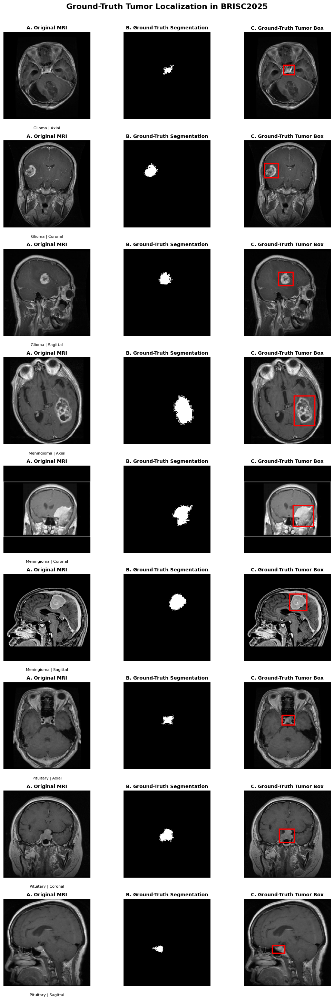


AUTHORITATIVE GROUND-TRUTH BOX GENERATION COMPLETE

Authoritative masks processed : 860
Processing errors             : 0
Coordinate validation         : PASS
Visualization cases           : 9

Bounding-box CSV:
D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\outputs\reports\gradcam\BRISC2025_AUTHORITATIVE_GROUND_TRUTH_BOUNDING_BOXES_224X224.csv

Thesis figure:
D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\outputs\figures\gradcam\FINAL_AUTHORITATIVE_GROUND_TRUTH_TUMOR_BOXES.png

Selection record:
D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\outputs\reports\gradcam\FINAL_AUTHORITATIVE_GROUND_TRUTH_BOX_VISUALIZATION_SELECTION.csv

Methodology:
D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\outputs\reports\gradcam\FINAL_AUTHORITATIVE_GROUND_TRUTH_BOX_METHODOLOGY.json

STATUS: PASS


In [32]:
# ============================================================
# CELL 15 — AUTHORITATIVE MASKS → CORRECT 224x224 BOXES
# ============================================================
#
# FINAL AUTHORITATIVE VERSION
#
# Source of image-mask relationship:
# BRISC2025 manifest.csv -> linked_image
#
# Bounding boxes:
# Derived ONLY from verified ground-truth segmentation masks.
#
# Coordinate system:
# Exact 224x224 model-input space.
#
# NO MODEL TRAINING
# NO MODEL MODIFICATION
# NO TEST SET MODIFICATION
# ============================================================

from pathlib import Path
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from PIL import Image
import json

print("=" * 80)
print("AUTHORITATIVE GROUND-TRUTH TUMOR BOUNDING BOX GENERATION")
print("=" * 80)

# ============================================================
# 1. PATHS
# ============================================================

PROJECT_ROOT = Path(
    r"D:\MSC Bioinformatics\INTERNSHIP\BrainTumor"
)

BRISC_ROOT = Path(
    r"D:\MSC Bioinformatics\INTERNSHIP\brisc2025"
)

GRADCAM_REPORT_DIR = (
    PROJECT_ROOT
    / "outputs"
    / "reports"
    / "gradcam"
)

GRADCAM_FIGURE_DIR = (
    PROJECT_ROOT
    / "outputs"
    / "figures"
    / "gradcam"
)

PROCESSED_ROOT = (
    PROJECT_ROOT
    / "data"
    / "processed"
    / "classification_224_rgb"
)

GRADCAM_REPORT_DIR.mkdir(
    parents=True,
    exist_ok=True
)

GRADCAM_FIGURE_DIR.mkdir(
    parents=True,
    exist_ok=True
)

assert BRISC_ROOT.exists()
assert PROCESSED_ROOT.exists()

# ============================================================
# 2. LOAD AUTHORITATIVE MATCHING AUDIT
# ============================================================

AUTHORITATIVE_AUDIT = (
    GRADCAM_REPORT_DIR
    /
    "BRISC2025_AUTHORITATIVE_TEST_IMAGE_MASK_MATCHING_AUDIT.csv"
)

assert AUTHORITATIVE_AUDIT.exists(), (
    f"Authoritative audit not found:\n"
    f"{AUTHORITATIVE_AUDIT}"
)

authoritative_df = pd.read_csv(
    AUTHORITATIVE_AUDIT
)

print(
    f"\nTotal official test records: "
    f"{len(authoritative_df)}"
)

# ============================================================
# 3. KEEP ONLY AUTHORITATIVE LINKED-IMAGE MATCHES
# ============================================================

matched_df = authoritative_df[
    authoritative_df[
        "match_type"
    ]
    ==
    "AUTHORITATIVE_LINKED_IMAGE"
].copy()

matched_df = matched_df.reset_index(
    drop=True
)

print(
    f"Authoritative mask matches: "
    f"{len(matched_df)}"
)

assert len(matched_df) == 860

# ============================================================
# 4. NORMALIZE CLASS / PLANE
# ============================================================

matched_df["true_class"] = (
    matched_df["true_class"]
    .astype(str)
    .str.strip()
    .str.lower()
)

matched_df["mri_plane"] = (
    matched_df["mri_plane"]
    .astype(str)
    .str.strip()
    .str.lower()
)

CLASS_NAMES = [
    "glioma",
    "meningioma",
    "pituitary"
]

# ============================================================
# 5. RESOLVE ACTUAL MASK PATH
# ============================================================

def resolve_mask_path(
    relative_path
):

    relative_path = str(
        relative_path
    ).strip()

    # Normalize separators
    relative_path = relative_path.replace(
        "\\",
        "/"
    )

    # Remove accidental leading slash
    relative_path = relative_path.lstrip(
        "/"
    )

    candidate = (
        BRISC_ROOT
        /
        Path(relative_path)
    )

    if candidate.exists():

        return candidate

    # --------------------------------------------------------
    # Fallback: search by final filename
    # --------------------------------------------------------

    filename = Path(
        relative_path
    ).name

    matches = list(
        BRISC_ROOT.rglob(
            filename
        )
    )

    if len(matches) == 1:

        return matches[0]

    return None


matched_df[
    "actual_mask_path"
] = matched_df[
    "mask_relative_path"
].apply(
    resolve_mask_path
)

missing_masks = matched_df[
    matched_df[
        "actual_mask_path"
    ].isna()
]

print(
    f"\nMissing physical mask files: "
    f"{len(missing_masks)}"
)

assert len(missing_masks) == 0

# ============================================================
# 6. MASK → EXACT MODEL SPACE
# ============================================================

TARGET_SIZE = 224


def transform_mask_to_224(
    mask_array
):
    """
    Reproduce the exact spatial preprocessing used for
    the model:

        1. Binary mask
        2. Aspect-ratio preserving resize
        3. Nearest-neighbor interpolation
        4. Symmetric black padding
        5. Final size 224x224

    Nearest-neighbor is mandatory for segmentation masks.
    """

    # --------------------------------------------------------
    # Binary mask
    # --------------------------------------------------------

    binary = (
        mask_array > 0
    ).astype(
        np.uint8
    )

    original_height, original_width = (
        binary.shape[:2]
    )

    # --------------------------------------------------------
    # Same aspect-ratio calculation as MRI preprocessing
    # --------------------------------------------------------

    scale = min(
        TARGET_SIZE / original_width,
        TARGET_SIZE / original_height
    )

    resized_width = max(
        1,
        int(
            round(
                original_width
                *
                scale
            )
        )
    )

    resized_height = max(
        1,
        int(
            round(
                original_height
                *
                scale
            )
        )
    )

    # --------------------------------------------------------
    # Nearest-neighbor resize
    # --------------------------------------------------------

    mask_img = Image.fromarray(
        (
            binary
            *
            255
        ).astype(
            np.uint8
        )
    )

    resized_img = mask_img.resize(
        (
            resized_width,
            resized_height
        ),
        Image.Resampling.NEAREST
    )

    resized = (
        np.asarray(
            resized_img
        )
        >
        0
    )

    # --------------------------------------------------------
    # Symmetric padding
    # --------------------------------------------------------

    pad_left = (
        TARGET_SIZE
        -
        resized_width
    ) // 2

    pad_top = (
        TARGET_SIZE
        -
        resized_height
    ) // 2

    pad_right = (
        TARGET_SIZE
        -
        resized_width
        -
        pad_left
    )

    pad_bottom = (
        TARGET_SIZE
        -
        resized_height
        -
        pad_top
    )

    transformed = np.pad(
        resized,
        (
            (
                pad_top,
                pad_bottom
            ),
            (
                pad_left,
                pad_right
            )
        ),
        mode="constant",
        constant_values=False
    )

    assert transformed.shape == (
        224,
        224
    )

    return transformed, {
        "original_width":
            original_width,

        "original_height":
            original_height,

        "scale":
            scale,

        "resized_width":
            resized_width,

        "resized_height":
            resized_height,

        "pad_left":
            pad_left,

        "pad_top":
            pad_top,

        "pad_right":
            pad_right,

        "pad_bottom":
            pad_bottom
    }


# ============================================================
# 7. BOUNDING BOX FUNCTION
# ============================================================

def calculate_bbox(
    binary_mask
):

    ys, xs = np.where(
        binary_mask
    )

    if len(xs) == 0:

        return None

    x_min = int(
        xs.min()
    )

    x_max = int(
        xs.max()
    )

    y_min = int(
        ys.min()
    )

    y_max = int(
        ys.max()
    )

    width = (
        x_max
        -
        x_min
        +
        1
    )

    height = (
        y_max
        -
        y_min
        +
        1
    )

    return {

        "bbox_x_min_224":
            x_min,

        "bbox_y_min_224":
            y_min,

        "bbox_x_max_224":
            x_max,

        "bbox_y_max_224":
            y_max,

        "bbox_width_224":
            width,

        "bbox_height_224":
            height,

        "bbox_area_224":
            width * height
    }


# ============================================================
# 8. PROCESS ALL 860 AUTHORITATIVE MASKS
# ============================================================

records = []

errors = []

print(
    "\nProcessing authoritative masks..."
)

for idx, row in matched_df.iterrows():

    try:

        mask_path = Path(
            row[
                "actual_mask_path"
            ]
        )

        # ----------------------------------------------------
        # Load mask
        # ----------------------------------------------------

        mask_img = Image.open(
            mask_path
        )

        mask_array = np.asarray(
            mask_img
        )

        if mask_array.ndim == 3:

            mask_array = np.asarray(
                mask_img.convert("L")
            )

        # ----------------------------------------------------
        # Transform
        # ----------------------------------------------------

        transformed_mask, info = (
            transform_mask_to_224(
                mask_array
            )
        )

        # ----------------------------------------------------
        # Verify tumor pixels
        # ----------------------------------------------------

        tumor_pixels = int(
            transformed_mask.sum()
        )

        if tumor_pixels == 0:

            raise ValueError(
                "Transformed mask contains "
                "no tumor pixels."
            )

        # ----------------------------------------------------
        # Calculate box
        # ----------------------------------------------------

        bbox = calculate_bbox(
            transformed_mask
        )

        if bbox is None:

            raise ValueError(
                "Bounding box could not be calculated."
            )

        # ----------------------------------------------------
        # Record
        # ----------------------------------------------------

        record = {

            "filename":
                row[
                    "classification_filename"
                ],

            "true_class":
                row[
                    "true_class"
                ],

            "mri_plane":
                row[
                    "mri_plane"
                ],

            "mask_filename":
                row[
                    "mask_filename"
                ],

            "mask_relative_path":
                row[
                    "mask_relative_path"
                ],

            "actual_mask_path":
                str(
                    mask_path
                ),

            "original_mask_width":
                info[
                    "original_width"
                ],

            "original_mask_height":
                info[
                    "original_height"
                ],

            "resize_scale":
                info[
                    "scale"
                ],

            "resized_width":
                info[
                    "resized_width"
                ],

            "resized_height":
                info[
                    "resized_height"
                ],

            "pad_left":
                info[
                    "pad_left"
                ],

            "pad_top":
                info[
                    "pad_top"
                ],

            "pad_right":
                info[
                    "pad_right"
                ],

            "pad_bottom":
                info[
                    "pad_bottom"
                ],

            "tumor_pixels_224":
                tumor_pixels
        }

        record.update(
            bbox
        )

        records.append(
            record
        )

    except Exception as e:

        errors.append(
            {
                "filename":
                    row[
                        "classification_filename"
                    ],

                "error":
                    str(e)
            }
        )

# ============================================================
# 9. CREATE DATAFRAME
# ============================================================

bbox_df = pd.DataFrame(
    records
)

error_df = pd.DataFrame(
    errors
)

print(
    f"\nSuccessfully processed: "
    f"{len(bbox_df)}"
)

print(
    f"Processing errors: "
    f"{len(error_df)}"
)

assert len(bbox_df) == 860
assert len(error_df) == 0

# ============================================================
# 10. STRICT COORDINATE VALIDATION
# ============================================================

print(
    "\nValidating bounding-box coordinates..."
)

assert (
    bbox_df[
        "bbox_x_min_224"
    ].between(
        0,
        223
    ).all()
)

assert (
    bbox_df[
        "bbox_x_max_224"
    ].between(
        0,
        223
    ).all()
)

assert (
    bbox_df[
        "bbox_y_min_224"
    ].between(
        0,
        223
    ).all()
)

assert (
    bbox_df[
        "bbox_y_max_224"
    ].between(
        0,
        223
    ).all()
)

assert (
    bbox_df[
        "bbox_x_min_224"
    ]
    <=
    bbox_df[
        "bbox_x_max_224"
    ]
).all()

assert (
    bbox_df[
        "bbox_y_min_224"
    ]
    <=
    bbox_df[
        "bbox_y_max_224"
    ]
).all()

assert (
    bbox_df[
        "tumor_pixels_224"
    ]
    > 0
).all()

print(
    "All 860 boxes passed coordinate validation."
)

# ============================================================
# 11. SAVE AUTHORITATIVE BOX CSV
# ============================================================

FINAL_BOX_FILE = (
    GRADCAM_REPORT_DIR
    /
    "BRISC2025_AUTHORITATIVE_GROUND_TRUTH_BOUNDING_BOXES_224X224.csv"
)

bbox_df.to_csv(
    FINAL_BOX_FILE,
    index=False
)

print(
    f"\nSaved:\n{FINAL_BOX_FILE}"
)

# ============================================================
# 12. SUMMARY BY CLASS
# ============================================================

print(
    "\n" + "=" * 80
)

print(
    "BOUNDING BOX SUMMARY BY CLASS"
)

print(
    "=" * 80
)

class_summary = (
    bbox_df
    .groupby(
        "true_class"
    )
    .agg(
        images=(
            "filename",
            "count"
        ),

        mean_width=(
            "bbox_width_224",
            "mean"
        ),

        mean_height=(
            "bbox_height_224",
            "mean"
        ),

        mean_area=(
            "bbox_area_224",
            "mean"
        )
    )
    .reindex(
        [
            "glioma",
            "meningioma",
            "pituitary"
        ]
    )
)

print(
    class_summary.round(
        2
    ).to_string()
)

# ============================================================
# 13. SUMMARY BY PLANE
# ============================================================

print(
    "\n" + "=" * 80
)

print(
    "BOUNDING BOX SUMMARY BY MRI PLANE"
)

print(
    "=" * 80
)

plane_summary = (
    bbox_df
    .groupby(
        "mri_plane"
    )
    .agg(
        images=(
            "filename",
            "count"
        ),

        mean_width=(
            "bbox_width_224",
            "mean"
        ),

        mean_height=(
            "bbox_height_224",
            "mean"
        )
    )
    .reindex(
        [
            "axial",
            "coronal",
            "sagittal"
        ]
    )
)

print(
    plane_summary.round(
        2
    ).to_string()
)

# ============================================================
# 14. LOAD PROCESSED MRI
# ============================================================

def find_processed_image(
    filename,
    true_class
):

    stem = Path(
        filename
    ).stem

    candidate = (
        PROCESSED_ROOT
        / "test"
        / true_class
        / f"{stem}.png"
    )

    if candidate.exists():

        return candidate

    matches = list(
        PROCESSED_ROOT.rglob(
            f"{stem}.png"
        )
    )

    if len(matches) == 1:

        return matches[0]

    return None


bbox_df[
    "processed_image_path"
] = bbox_df.apply(
    lambda row:
        find_processed_image(
            row[
                "filename"
            ],
            row[
                "true_class"
            ]
        ),
    axis=1
)

missing_images = bbox_df[
    bbox_df[
        "processed_image_path"
    ].isna()
]

print(
    f"\nMissing processed MRI files: "
    f"{len(missing_images)}"
)

assert len(missing_images) == 0

# ============================================================
# 15. SELECT 3 CASES PER CLASS
# ============================================================

selected_rows = []

for class_name in [
    "glioma",
    "meningioma",
    "pituitary"
]:

    class_cases = bbox_df[
        bbox_df[
            "true_class"
        ]
        ==
        class_name
    ].copy()

    assert len(
        class_cases
    ) > 0

    chosen = []

    # --------------------------------------------------------
    # Prefer axial + coronal + sagittal
    # --------------------------------------------------------

    for plane in [
        "axial",
        "coronal",
        "sagittal"
    ]:

        candidates = class_cases[
            class_cases[
                "mri_plane"
            ]
            ==
            plane
        ]

        if len(candidates) > 0:

            chosen.append(
                candidates.iloc[0]
            )

    # --------------------------------------------------------
    # If needed, fill remaining slots
    # --------------------------------------------------------

    existing = {
        row["filename"]
        for row in chosen
    }

    if len(chosen) < 3:

        remaining = class_cases[
            ~class_cases[
                "filename"
            ].isin(
                existing
            )
        ]

        for _, row in remaining.iterrows():

            chosen.append(
                row
            )

            if len(chosen) == 3:

                break

    selected_rows.extend(
        chosen[:3]
    )

selected_df = pd.DataFrame(
    selected_rows
).reset_index(
    drop=True
)

print(
    "\nSelected visualization cases:"
)

print(
    selected_df[
        [
            "filename",
            "true_class",
            "mri_plane",
            "bbox_x_min_224",
            "bbox_y_min_224",
            "bbox_x_max_224",
            "bbox_y_max_224"
        ]
    ].to_string(
        index=False
    )
)

assert len(
    selected_df
) == 9

# ============================================================
# 16. CREATE FINAL VISUALIZATION
# ============================================================

fig, axes = plt.subplots(
    9,
    3,
    figsize=(11, 29),
    squeeze=False
)

for i, (_, row) in enumerate(
    selected_df.iterrows()
):

    # --------------------------------------------------------
    # MRI
    # --------------------------------------------------------

    image = np.asarray(
        Image.open(
            row[
                "processed_image_path"
            ]
        ).convert("RGB")
    )

    assert image.shape[:2] == (
        224,
        224
    )

    # --------------------------------------------------------
    # Mask
    # --------------------------------------------------------

    mask = np.asarray(
        Image.open(
            row[
                "actual_mask_path"
            ]
        ).convert("L")
    )

    transformed_mask, _ = (
        transform_mask_to_224(
            mask
        )
    )

    # --------------------------------------------------------
    # Coordinates
    # --------------------------------------------------------

    x_min = int(
        row[
            "bbox_x_min_224"
        ]
    )

    y_min = int(
        row[
            "bbox_y_min_224"
        ]
    )

    x_max = int(
        row[
            "bbox_x_max_224"
        ]
    )

    y_max = int(
        row[
            "bbox_y_max_224"
        ]
    )

    # ========================================================
    # A — ORIGINAL MRI
    # ========================================================

    ax = axes[i, 0]

    ax.imshow(
        image
    )

    ax.set_title(
        "A. Original MRI",
        fontsize=10,
        fontweight="bold"
    )

    ax.axis(
        "off"
    )

    # ========================================================
    # B — GROUND TRUTH MASK
    # ========================================================

    ax = axes[i, 1]

    ax.imshow(
        transformed_mask,
        cmap="gray"
    )

    ax.set_title(
        "B. Ground-Truth Segmentation",
        fontsize=10,
        fontweight="bold"
    )

    ax.axis(
        "off"
    )

    # ========================================================
    # C — GROUND TRUTH BOX
    # ========================================================

    ax = axes[i, 2]

    ax.imshow(
        image
    )

    rectangle = Rectangle(
        (
            x_min,
            y_min
        ),
        x_max - x_min + 1,
        y_max - y_min + 1,
        fill=False,
        edgecolor="red",
        linewidth=2.5
    )

    ax.add_patch(
        rectangle
    )

    ax.set_title(
        "C. Ground-Truth Tumor Box",
        fontsize=10,
        fontweight="bold"
    )

    ax.axis(
        "off"
    )

    # --------------------------------------------------------
    # Row label
    # --------------------------------------------------------

    row_label = (
        f"{row['true_class'].replace('_', ' ').title()} "
        f"| {row['mri_plane'].title()}"
    )

    axes[i, 0].text(
        0.5,
        -0.08,
        row_label,
        transform=axes[i, 0].transAxes,
        ha="center",
        va="top",
        fontsize=8
    )

# ============================================================
# 17. FIGURE TITLE
# ============================================================

fig.suptitle(
    "Ground-Truth Tumor Localization in BRISC2025",
    fontsize=16,
    fontweight="bold",
    y=0.995
)

plt.tight_layout(
    rect=[
        0,
        0,
        1,
        0.99
    ]
)

# ============================================================
# 18. SAVE FIGURE
# ============================================================

FINAL_FIGURE = (
    GRADCAM_FIGURE_DIR
    /
    "FINAL_AUTHORITATIVE_GROUND_TRUTH_TUMOR_BOXES.png"
)

fig.savefig(
    FINAL_FIGURE,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

# ============================================================
# 19. SAVE SELECTION
# ============================================================

SELECTION_FILE = (
    GRADCAM_REPORT_DIR
    /
    "FINAL_AUTHORITATIVE_GROUND_TRUTH_BOX_VISUALIZATION_SELECTION.csv"
)

selected_df.to_csv(
    SELECTION_FILE,
    index=False
)

# ============================================================
# 20. SAVE METHODOLOGY
# ============================================================

METHODOLOGY_FILE = (
    GRADCAM_REPORT_DIR
    /
    "FINAL_AUTHORITATIVE_GROUND_TRUTH_BOX_METHODOLOGY.json"
)

methodology = {

    "dataset":
        "BRISC2025",

    "official_test_images":
        1000,

    "authoritative_segmentation_matches":
        860,

    "images_without_segmentation_masks":
        140,

    "classes_with_segmentation":
        [
            "glioma",
            "meningioma",
            "pituitary"
        ],

    "no_tumor_segmentation_cases":
        0,

    "image_mask_relationship":
        "BRISC2025 manifest linked_image",

    "bounding_box_source":
        "Ground-truth segmentation mask",

    "bounding_box_definition":
        "Minimum axis-aligned rectangle enclosing all non-zero tumor-mask pixels",

    "coordinate_space":
        "224x224 model-input space",

    "resize_method":
        "Aspect-ratio preserving resize",

    "mask_interpolation":
        "Nearest-neighbor",

    "padding":
        "Symmetric padding",

    "model_modified":
        False,

    "test_set_modified":
        False,

    "gradcam_used":
        False,

    "status":
        "PASS"
}

with open(
    METHODOLOGY_FILE,
    "w",
    encoding="utf-8"
) as f:

    json.dump(
        methodology,
        f,
        indent=4
    )

# ============================================================
# 21. FINAL STATUS
# ============================================================

print("\n" + "=" * 80)
print("AUTHORITATIVE GROUND-TRUTH BOX GENERATION COMPLETE")
print("=" * 80)

print(
    f"\nAuthoritative masks processed : 860"
)

print(
    f"Processing errors             : 0"
)

print(
    f"Coordinate validation         : PASS"
)

print(
    f"Visualization cases           : 9"
)

print(
    f"\nBounding-box CSV:"
    f"\n{FINAL_BOX_FILE}"
)

print(
    f"\nThesis figure:"
    f"\n{FINAL_FIGURE}"
)

print(
    f"\nSelection record:"
    f"\n{SELECTION_FILE}"
)

print(
    f"\nMethodology:"
    f"\n{METHODOLOGY_FILE}"
)

print(
    "\nSTATUS: PASS"
)

print("=" * 80)

DIRECT AUTHORITATIVE BRISC2025 IMAGE ↔ MASK VERIFICATION

Manifest shape: (15586, 16)

is_mask values:
is_mask_bool
False    10793
True      4793

Authoritative image-mask pairs: 860

Unique manifest filename keys: 10793

Representative cases:
  brisc2025_test_00001_gl_ax_t1.jpg | glioma | axial
  brisc2025_test_00255_me_ax_t1.jpg | meningioma | axial
  brisc2025_test_00701_pi_ax_t1.jpg | pituitary | axial

--------------------------------------------------------------------------------
Classification filename : brisc2025_test_00001_gl_ax_t1.jpg
Mask filename           : brisc2025_test_00001_gl_ax_t1.png
Mask linked_image       : brisc2025_test_00001_gl_ax_t1.jpg
Records matching linked_image: 2

--------------------------------------------------------------------------------
Classification filename : brisc2025_test_00255_me_ax_t1.jpg
Mask filename           : brisc2025_test_00255_me_ax_t1.png
Mask linked_image       : brisc2025_test_00255_me_ax_t1.jpg
Records matching linked_image: 2


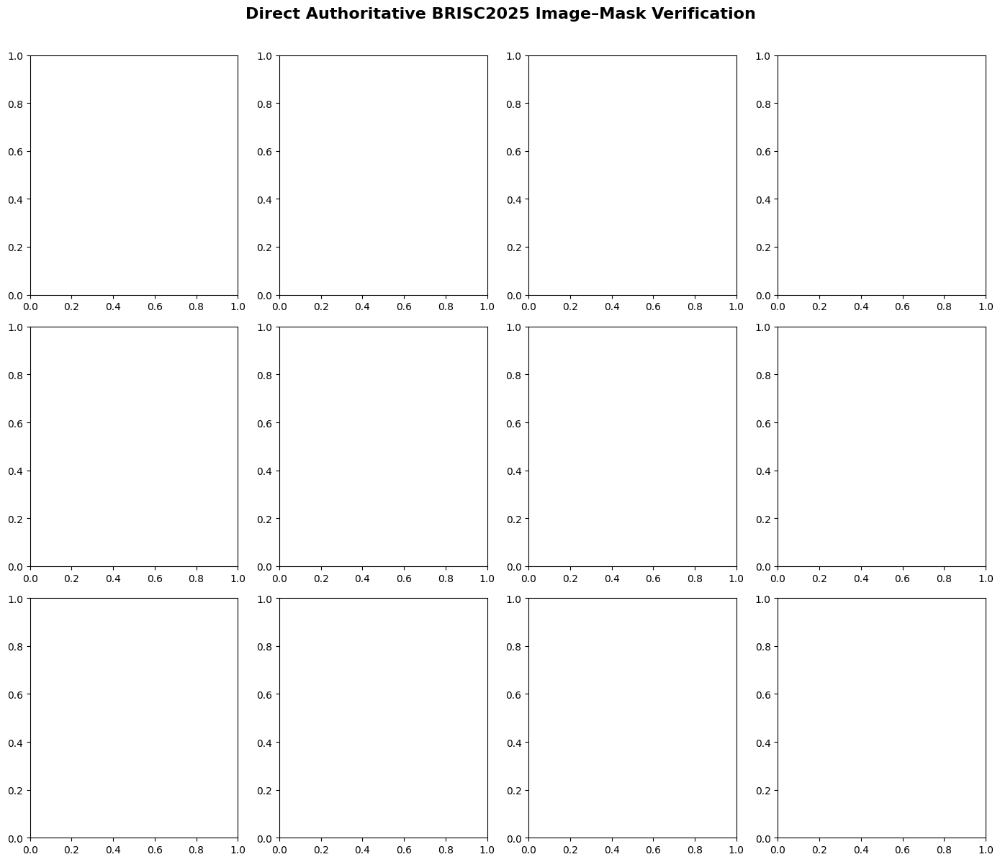


DIRECT AUTHORITATIVE VERIFICATION COMPLETE

Cases successfully verified: 0
Verification errors: 3

Figure:
D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\outputs\figures\gradcam\DIRECT_AUTHORITATIVE_IMAGE_MASK_VERIFICATION.png

Verification CSV:
D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\outputs\reports\gradcam\DIRECT_AUTHORITATIVE_IMAGE_MASK_VERIFICATION.csv

Error CSV:
D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\outputs\reports\gradcam\DIRECT_AUTHORITATIVE_IMAGE_MASK_VERIFICATION_ERRORS.csv

STATUS: REVIEW REQUIRED


In [34]:
# ============================================================
# CELL 16 — DIRECT AUTHORITATIVE IMAGE ↔ MASK VERIFICATION
# ============================================================
#
# IMPORTANT:
# This version does NOT assume that the classification filename
# occurs exactly once in the manifest.
#
# The authoritative relationship is:
#
#       MASK RECORD
#           |
#           | linked_image
#           v
#       ORIGINAL MRI
#
# We verify that relationship directly.
#
# NO MODEL TRAINING
# NO MODEL MODIFICATION
# NO TEST SET MODIFICATION
# ============================================================

from pathlib import Path
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from matplotlib.patches import Rectangle

print("=" * 80)
print("DIRECT AUTHORITATIVE BRISC2025 IMAGE ↔ MASK VERIFICATION")
print("=" * 80)

# ============================================================
# 1. PATHS
# ============================================================

PROJECT_ROOT = Path(
    r"D:\MSC Bioinformatics\INTERNSHIP\BrainTumor"
)

BRISC_ROOT = Path(
    r"D:\MSC Bioinformatics\INTERNSHIP\brisc2025"
)

PROCESSED_ROOT = (
    PROJECT_ROOT
    / "data"
    / "processed"
    / "classification_224_rgb"
)

GRADCAM_REPORT_DIR = (
    PROJECT_ROOT
    / "outputs"
    / "reports"
    / "gradcam"
)

GRADCAM_FIGURE_DIR = (
    PROJECT_ROOT
    / "outputs"
    / "figures"
    / "gradcam"
)

assert BRISC_ROOT.exists()
assert PROCESSED_ROOT.exists()

# ============================================================
# 2. LOAD MANIFEST
# ============================================================

MANIFEST_FILE = (
    BRISC_ROOT
    / "manifest.csv"
)

assert MANIFEST_FILE.exists()

manifest = pd.read_csv(
    MANIFEST_FILE
)

print(
    f"\nManifest shape: {manifest.shape}"
)

# ============================================================
# 3. NORMALIZE MANIFEST
# ============================================================

for column in [
    "relative_path",
    "filename",
    "task",
    "split",
    "linked_image"
]:

    manifest[column] = (
        manifest[column]
        .astype(str)
        .str.strip()
    )

# ============================================================
# 4. NORMALIZE is_mask
# ============================================================

manifest[
    "is_mask_bool"
] = (
    manifest[
        "is_mask"
    ]
    .astype(str)
    .str.strip()
    .str.lower()
    .map(
        {
            "true": True,
            "1": True,
            "yes": True,
            "false": False,
            "0": False,
            "no": False
        }
    )
)

print(
    "\nis_mask values:"
)

print(
    manifest[
        "is_mask_bool"
    ]
    .value_counts(
        dropna=False
    )
    .to_string()
)

# ============================================================
# 5. LOAD AUTHORITATIVE MATCHING AUDIT
# ============================================================

MATCH_FILE = (
    GRADCAM_REPORT_DIR
    /
    "BRISC2025_AUTHORITATIVE_TEST_IMAGE_MASK_MATCHING_AUDIT.csv"
)

assert MATCH_FILE.exists()

matches = pd.read_csv(
    MATCH_FILE
)

matches = matches[
    matches[
        "match_type"
    ]
    ==
    "AUTHORITATIVE_LINKED_IMAGE"
].copy()

matches = matches.reset_index(
    drop=True
)

print(
    f"\nAuthoritative image-mask pairs: "
    f"{len(matches)}"
)

assert len(matches) == 860

# ============================================================
# 6. HELPER — NORMALIZE BASENAME
# ============================================================

def basename(
    value
):

    text = str(
        value
    ).strip()

    if text.lower() in [
        "",
        "nan",
        "none"
    ]:

        return ""

    return Path(
        text.replace(
            "\\",
            "/"
        )
    ).name


# ============================================================
# 7. HELPER — RESOLVE DATASET FILE
# ============================================================

def resolve_dataset_file(
    relative_path,
    filename=None
):

    relative_path = str(
        relative_path
    ).strip()

    relative_path = relative_path.replace(
        "\\",
        "/"
    ).lstrip(
        "/"
    )

    candidate = (
        BRISC_ROOT
        /
        Path(relative_path)
    )

    if candidate.exists():

        return candidate

    # --------------------------------------------------------
    # Fallback by supplied filename
    # --------------------------------------------------------

    if filename is not None:

        filename = basename(
            filename
        )

        if filename != "":

            candidates = list(
                BRISC_ROOT.rglob(
                    filename
                )
            )

            if len(candidates) == 1:

                return candidates[0]

    return None


# ============================================================
# 8. HELPER — MASK → 224x224
# ============================================================

def transform_mask_to_224(
    mask_array
):

    binary = (
        mask_array > 0
    )

    h, w = binary.shape[:2]

    scale = min(
        224 / w,
        224 / h
    )

    new_w = max(
        1,
        int(
            round(
                w * scale
            )
        )
    )

    new_h = max(
        1,
        int(
            round(
                h * scale
            )
        )
    )

    mask_img = Image.fromarray(
        (
            binary.astype(
                np.uint8
            )
            * 255
        )
    )

    resized_img = mask_img.resize(
        (
            new_w,
            new_h
        ),
        Image.Resampling.NEAREST
    )

    resized = (
        np.asarray(
            resized_img
        )
        > 0
    )

    pad_left = (
        224 - new_w
    ) // 2

    pad_top = (
        224 - new_h
    ) // 2

    pad_right = (
        224
        -
        new_w
        -
        pad_left
    )

    pad_bottom = (
        224
        -
        new_h
        -
        pad_top
    )

    transformed = np.pad(
        resized,
        (
            (
                pad_top,
                pad_bottom
            ),
            (
                pad_left,
                pad_right
            )
        ),
        mode="constant",
        constant_values=False
    )

    return transformed


# ============================================================
# 9. BUILD DIRECT LOOKUP OF MANIFEST FILENAMES
# ============================================================

manifest_by_filename = {}

for idx, row in manifest.iterrows():

    key = (
        basename(
            row[
                "filename"
            ]
        )
        .lower()
    )

    if key == "":
        continue

    manifest_by_filename.setdefault(
        key,
        []
    ).append(
        row
    )

print(
    "\nUnique manifest filename keys: "
    f"{len(manifest_by_filename)}"
)

# ============================================================
# 10. DIRECT IMAGE ↔ MASK VERIFICATION
# ============================================================

verification_records = []
verification_errors = []

# We only need a few representative cases.
# The first matched case is included deliberately because
# it looked suspicious in the previous visualization.

candidate_rows = []

# First glioma
for class_name in [
    "glioma",
    "meningioma",
    "pituitary"
]:

    class_rows = matches[
        matches[
            "true_class"
        ]
        .astype(str)
        .str.lower()
        ==
        class_name
    ]

    if len(class_rows) > 0:

        # Prefer different planes
        selected = None

        for plane in [
            "axial",
            "coronal",
            "sagittal"
        ]:

            plane_rows = class_rows[
                class_rows[
                    "mri_plane"
                ]
                .astype(str)
                .str.lower()
                ==
                plane
            ]

            if len(plane_rows) > 0:

                selected = plane_rows.iloc[0]

                break

        if selected is None:

            selected = class_rows.iloc[0]

        candidate_rows.append(
            selected
        )

# Remove duplicate filenames
unique_candidates = []

seen = set()

for row in candidate_rows:

    filename = str(
        row[
            "classification_filename"
        ]
    )

    if filename not in seen:

        unique_candidates.append(
            row
        )

        seen.add(
            filename
        )

print(
    "\nRepresentative cases:"
)

for row in unique_candidates:

    print(
        f"  {row['classification_filename']} | "
        f"{row['true_class']} | "
        f"{row['mri_plane']}"
    )

# ============================================================
# 11. VISUALIZATION
# ============================================================

fig, axes = plt.subplots(
    len(unique_candidates),
    4,
    figsize=(
        14,
        max(
            4,
            4 * len(unique_candidates)
        )
    ),
    squeeze=False
)

for i, match_row in enumerate(
    unique_candidates
):

    print(
        "\n" + "-" * 80
    )

    classification_filename = (
        str(
            match_row[
                "classification_filename"
            ]
        ).strip()
    )

    mask_filename = (
        str(
            match_row[
                "mask_filename"
            ]
        ).strip()
    )

    # ========================================================
    # MASK RECORD
    # ========================================================

    mask_matches = manifest[
        manifest[
            "filename"
        ]
        .apply(
            lambda x:
                basename(x).lower()
        )
        ==
        basename(
            mask_filename
        ).lower()
    ]

    # We know the authoritative match has one mask.
    if len(mask_matches) != 1:

        verification_errors.append(
            {
                "classification_filename":
                    classification_filename,

                "error":
                    (
                        "Expected exactly one mask "
                        f"record, found {len(mask_matches)}"
                    )
            }
        )

        continue

    mask_record = (
        mask_matches.iloc[0]
    )

    # ========================================================
    # CRITICAL:
    # GET ORIGINAL IMAGE FROM mask_record.linked_image
    # ========================================================

    linked_image_name = basename(
        mask_record[
            "linked_image"
        ]
    )

    print(
        f"Classification filename : "
        f"{classification_filename}"
    )

    print(
        f"Mask filename           : "
        f"{mask_filename}"
    )

    print(
        f"Mask linked_image       : "
        f"{linked_image_name}"
    )

    # --------------------------------------------------------
    # Find the source MRI record by linked_image.
    # --------------------------------------------------------

    linked_records = manifest[
        manifest[
            "filename"
        ]
        .apply(
            lambda x:
                basename(x).lower()
        )
        ==
        linked_image_name.lower()
    ]

    print(
        f"Records matching linked_image: "
        f"{len(linked_records)}"
    )

    if len(linked_records) == 0:

        verification_errors.append(
            {
                "classification_filename":
                    classification_filename,

                "error":
                    (
                        "linked_image does not resolve "
                        "to a manifest filename"
                    )
            }
        )

        continue

    # --------------------------------------------------------
    # If multiple records exist, prefer non-mask record.
    # --------------------------------------------------------

    non_mask_records = linked_records[
        linked_records[
            "is_mask_bool"
        ]
        !=
        True
    ]

    if len(non_mask_records) == 1:

        image_record = (
            non_mask_records.iloc[0]
        )

    elif len(linked_records) == 1:

        image_record = (
            linked_records.iloc[0]
        )

    else:

        verification_errors.append(
            {
                "classification_filename":
                    classification_filename,

                "error":
                    (
                        "linked_image resolves to "
                        f"{len(linked_records)} records"
                    )
            }
        )

        continue

    # ========================================================
    # RESOLVE PHYSICAL FILES
    # ========================================================

    source_image_path = (
        resolve_dataset_file(
            image_record[
                "relative_path"
            ],
            image_record[
                "filename"
            ]
        )
    )

    mask_path = (
        resolve_dataset_file(
            mask_record[
                "relative_path"
            ],
            mask_record[
                "filename"
            ]
        )
    )

    if source_image_path is None:

        verification_errors.append(
            {
                "classification_filename":
                    classification_filename,

                "error":
                    "Source MRI file could not be resolved"
            }
        )

        continue

    if mask_path is None:

        verification_errors.append(
            {
                "classification_filename":
                    classification_filename,

                "error":
                    "Mask file could not be resolved"
            }
        )

        continue

    # ========================================================
    # LOAD SOURCE IMAGE
    # ========================================================

    source_image = np.asarray(
        Image.open(
            source_image_path
        ).convert("RGB")
    )

    # ========================================================
    # LOAD MASK
    # ========================================================

    mask_array = np.asarray(
        Image.open(
            mask_path
        ).convert("L")
    )

    mask_binary = (
        mask_array > 0
    )

    tumor_pixels_original = int(
        mask_binary.sum()
    )

    # ========================================================
    # CHECK ORIGINAL DIMENSIONS
    # ========================================================

    print(
        f"Source MRI dimensions: "
        f"{source_image.shape[1]} × "
        f"{source_image.shape[0]}"
    )

    print(
        f"Mask dimensions: "
        f"{mask_array.shape[1]} × "
        f"{mask_array.shape[0]}"
    )

    print(
        f"Original mask tumor pixels: "
        f"{tumor_pixels_original}"
    )

    # ========================================================
    # TRANSFORM MASK
    # ========================================================

    mask_224 = (
        transform_mask_to_224(
            mask_array
        )
    )

    # ========================================================
    # PROCESSED MRI
    # ========================================================

    stem = Path(
        classification_filename
    ).stem

    processed_candidates = list(
        PROCESSED_ROOT.rglob(
            f"{stem}.png"
        )
    )

    if len(processed_candidates) == 0:

        verification_errors.append(
            {
                "classification_filename":
                    classification_filename,

                "error":
                    "Processed 224x224 MRI not found"
            }
        )

        continue

    # Prefer test
    test_candidates = [
        p
        for p in processed_candidates
        if "test" in p.parts
    ]

    if len(test_candidates) > 0:

        processed_path = (
            test_candidates[0]
        )

    else:

        processed_path = (
            processed_candidates[0]
        )

    processed_image = np.asarray(
        Image.open(
            processed_path
        ).convert("RGB")
    )

    # ========================================================
    # BOUNDING BOX
    # ========================================================

    ys, xs = np.where(
        mask_224
    )

    assert len(xs) > 0

    x_min = int(
        xs.min()
    )

    x_max = int(
        xs.max()
    )

    y_min = int(
        ys.min()
    )

    y_max = int(
        ys.max()
    )

    print(
        f"224x224 bounding box: "
        f"({x_min}, {y_min}) → "
        f"({x_max}, {y_max})"
    )

    # ========================================================
    # A — SOURCE MRI
    # ========================================================

    ax = axes[i, 0]

    ax.imshow(
        source_image
    )

    ax.set_title(
        "A. Original Source MRI",
        fontsize=10,
        fontweight="bold"
    )

    ax.axis(
        "off"
    )

    # ========================================================
    # B — SOURCE MASK
    # ========================================================

    ax = axes[i, 1]

    ax.imshow(
        mask_binary,
        cmap="gray"
    )

    ax.set_title(
        "B. Original Source Mask",
        fontsize=10,
        fontweight="bold"
    )

    ax.axis(
        "off"
    )

    # ========================================================
    # C — PROCESSED MRI + BOX
    # ========================================================

    ax = axes[i, 2]

    ax.imshow(
        processed_image
    )

    rect = Rectangle(
        (
            x_min,
            y_min
        ),
        x_max - x_min + 1,
        y_max - y_min + 1,
        fill=False,
        edgecolor="red",
        linewidth=3
    )

    ax.add_patch(
        rect
    )

    ax.set_title(
        "C. Processed 224×224 MRI + Box",
        fontsize=10,
        fontweight="bold"
    )

    ax.axis(
        "off"
    )

    # ========================================================
    # D — PROCESSED MRI + MASK CONTOUR + BOX
    # ========================================================

    ax = axes[i, 3]

    ax.imshow(
        processed_image
    )

    ax.contour(
        mask_224.astype(float),
        levels=[
            0.5
        ],
        linewidths=2
    )

    rect2 = Rectangle(
        (
            x_min,
            y_min
        ),
        x_max - x_min + 1,
        y_max - y_min + 1,
        fill=False,
        edgecolor="red",
        linewidth=3
    )

    ax.add_patch(
        rect2
    )

    ax.set_title(
        "D. 224×224 Mask Contour + Box",
        fontsize=10,
        fontweight="bold"
    )

    ax.axis(
        "off"
    )

    # ========================================================
    # SAVE RECORD
    # ========================================================

    verification_records.append(
        {
            "classification_filename":
                classification_filename,

            "manifest_image_filename":
                image_record[
                    "filename"
                ],

            "manifest_mask_filename":
                mask_record[
                    "filename"
                ],

            "mask_linked_image":
                mask_record[
                    "linked_image"
                ],

            "true_class":
                match_row[
                    "true_class"
                ],

            "mri_plane":
                match_row[
                    "mri_plane"
                ],

            "source_image_path":
                str(
                    source_image_path
                ),

            "mask_path":
                str(
                    mask_path
                ),

            "processed_image_path":
                str(
                    processed_path
                ),

            "source_image_width":
                source_image.shape[1],

            "source_image_height":
                source_image.shape[0],

            "mask_width":
                mask_array.shape[1],

            "mask_height":
                mask_array.shape[0],

            "tumor_pixels_original":
                tumor_pixels_original,

            "bbox_x_min_224":
                x_min,

            "bbox_y_min_224":
                y_min,

            "bbox_x_max_224":
                x_max,

            "bbox_y_max_224":
                y_max
        }
    )

# ============================================================
# 12. FINALIZE FIGURE
# ============================================================

fig.suptitle(
    "Direct Authoritative BRISC2025 Image–Mask Verification",
    fontsize=16,
    fontweight="bold",
    y=0.995
)

plt.tight_layout(
    rect=[
        0,
        0,
        1,
        0.985
    ]
)

OUTPUT_FIGURE = (
    GRADCAM_FIGURE_DIR
    /
    "DIRECT_AUTHORITATIVE_IMAGE_MASK_VERIFICATION.png"
)

plt.savefig(
    OUTPUT_FIGURE,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

# ============================================================
# 13. SAVE VERIFICATION RECORD
# ============================================================

OUTPUT_CSV = (
    GRADCAM_REPORT_DIR
    /
    "DIRECT_AUTHORITATIVE_IMAGE_MASK_VERIFICATION.csv"
)

verification_df = pd.DataFrame(
    verification_records
)

verification_df.to_csv(
    OUTPUT_CSV,
    index=False
)

# ============================================================
# 14. SAVE ERRORS
# ============================================================

ERROR_CSV = (
    GRADCAM_REPORT_DIR
    /
    "DIRECT_AUTHORITATIVE_IMAGE_MASK_VERIFICATION_ERRORS.csv"
)

error_df = pd.DataFrame(
    verification_errors
)

error_df.to_csv(
    ERROR_CSV,
    index=False
)

# ============================================================
# 15. FINAL STATUS
# ============================================================

print("\n" + "=" * 80)
print("DIRECT AUTHORITATIVE VERIFICATION COMPLETE")
print("=" * 80)

print(
    f"\nCases successfully verified: "
    f"{len(verification_df)}"
)

print(
    f"Verification errors: "
    f"{len(error_df)}"
)

print(
    f"\nFigure:"
    f"\n{OUTPUT_FIGURE}"
)

print(
    f"\nVerification CSV:"
    f"\n{OUTPUT_CSV}"
)

print(
    f"\nError CSV:"
    f"\n{ERROR_CSV}"
)

if (
    len(error_df) == 0
    and
    len(verification_df) == len(
        unique_candidates
    )
):

    print(
        "\nSTATUS: PASS"
    )

else:

    print(
        "\nSTATUS: REVIEW REQUIRED"
    )

print("=" * 80)

In [35]:
# ============================================================
# CELL 16B — SIMPLE AUTHORITATIVE LINK DIAGNOSTIC
# ============================================================

from pathlib import Path
import pandas as pd

print("=" * 80)
print("SIMPLE AUTHORITATIVE IMAGE ↔ MASK LINK DIAGNOSTIC")
print("=" * 80)

PROJECT_ROOT = Path(
    r"D:\MSC Bioinformatics\INTERNSHIP\BrainTumor"
)

BRISC_ROOT = Path(
    r"D:\MSC Bioinformatics\INTERNSHIP\brisc2025"
)

REPORT_DIR = (
    PROJECT_ROOT
    / "outputs"
    / "reports"
    / "gradcam"
)

MANIFEST_FILE = (
    BRISC_ROOT
    / "manifest.csv"
)

MATCH_FILE = (
    REPORT_DIR
    /
    "BRISC2025_AUTHORITATIVE_TEST_IMAGE_MASK_MATCHING_AUDIT.csv"
)

manifest = pd.read_csv(
    MANIFEST_FILE
)

matches = pd.read_csv(
    MATCH_FILE
)

matches = matches[
    matches["match_type"]
    ==
    "AUTHORITATIVE_LINKED_IMAGE"
].copy()

# ------------------------------------------------------------
# Normalize only strings
# ------------------------------------------------------------

for col in [
    "filename",
    "relative_path",
    "linked_image"
]:

    manifest[col] = (
        manifest[col]
        .astype(str)
        .str.strip()
    )

for col in [
    "classification_filename",
    "mask_filename",
    "mask_relative_path",
    "mask_linked_image"
]:

    matches[col] = (
        matches[col]
        .astype(str)
        .str.strip()
    )

# ------------------------------------------------------------
# Basename helper
# ------------------------------------------------------------

def base(value):

    return Path(
        str(value)
        .replace("\\", "/")
    ).name.strip().lower()


# ------------------------------------------------------------
# Build filename lookup
# ------------------------------------------------------------

filename_lookup = {}

for _, row in manifest.iterrows():

    key = base(
        row["filename"]
    )

    filename_lookup.setdefault(
        key,
        []
    ).append(
        row
    )

# ------------------------------------------------------------
# Check first 12 authoritative pairs
# ------------------------------------------------------------

sample = matches.head(12).copy()

print(
    f"\nTotal authoritative pairs: {len(matches)}"
)

print(
    "\nChecking first 12 pairs..."
)

print("=" * 80)

for i, (_, row) in enumerate(
    sample.iterrows(),
    start=1
):

    classification_filename = (
        row[
            "classification_filename"
        ]
    )

    mask_filename = (
        row[
            "mask_filename"
        ]
    )

    linked_image = (
        row[
            "mask_linked_image"
        ]
    )

    mask_relative_path = (
        row[
            "mask_relative_path"
        ]
    )

    # --------------------------------------------------------
    # Find linked image in manifest
    # --------------------------------------------------------

    linked_key = base(
        linked_image
    )

    linked_records = (
        filename_lookup.get(
            linked_key,
            []
        )
    )

    # --------------------------------------------------------
    # Resolve actual files
    # --------------------------------------------------------

    image_paths = []

    for record in linked_records:

        relative = str(
            record[
                "relative_path"
            ]
        ).replace(
            "\\",
            "/"
        )

        candidate = (
            BRISC_ROOT
            /
            relative
        )

        if candidate.exists():

            image_paths.append(
                candidate
            )

    mask_relative = str(
        mask_relative_path
    ).replace(
        "\\",
        "/"
    )

    mask_path = (
        BRISC_ROOT
        /
        mask_relative
    )

    # --------------------------------------------------------
    # Print
    # --------------------------------------------------------

    print(
        f"\nCASE {i}"
    )

    print(
        f"Classification filename:"
        f"\n  {classification_filename}"
    )

    print(
        f"Mask filename:"
        f"\n  {mask_filename}"
    )

    print(
        f"Mask linked_image:"
        f"\n  {linked_image}"
    )

    print(
        f"Linked-image manifest records:"
        f" {len(linked_records)}"
    )

    print(
        f"Physical linked MRI files:"
        f" {len(image_paths)}"
    )

    if len(image_paths) > 0:

        print(
            f"Actual MRI path:"
            f"\n  {image_paths[0]}"
        )

    else:

        print(
            "Actual MRI path: NOT FOUND"
        )

    print(
        f"Mask exists:"
        f" {mask_path.exists()}"
    )

    if mask_path.exists():

        print(
            f"Actual mask path:"
            f"\n  {mask_path}"
        )

    print("-" * 80)

# ------------------------------------------------------------
# Important consistency check
# ------------------------------------------------------------

print(
    "\n" + "=" * 80
)

print(
    "CLASSIFICATION FILENAME vs MASK LINKED_IMAGE"
)

print("=" * 80)

same_count = 0
different_count = 0

for _, row in matches.iterrows():

    classification_name = base(
        row[
            "classification_filename"
        ]
    )

    linked_name = base(
        row[
            "mask_linked_image"
        ]
    )

    if classification_name == linked_name:

        same_count += 1

    else:

        different_count += 1

print(
    f"\nSame filename:      {same_count}"
)

print(
    f"Different filename: {different_count}"
)

print(
    "\nThis comparison is diagnostic only."
)

print(
    "The authoritative relationship is mask → linked_image."
)

print("=" * 80)

SIMPLE AUTHORITATIVE IMAGE ↔ MASK LINK DIAGNOSTIC

Total authoritative pairs: 860

Checking first 12 pairs...

CASE 1
Classification filename:
  brisc2025_test_00001_gl_ax_t1.jpg
Mask filename:
  brisc2025_test_00001_gl_ax_t1.png
Mask linked_image:
  segmentation_task\test\images\brisc2025_test_00001_gl_ax_t1.jpg
Linked-image manifest records: 2
Physical linked MRI files: 2
Actual MRI path:
  D:\MSC Bioinformatics\INTERNSHIP\brisc2025\classification_task\test\glioma\brisc2025_test_00001_gl_ax_t1.jpg
Mask exists: True
Actual mask path:
  D:\MSC Bioinformatics\INTERNSHIP\brisc2025\segmentation_task\test\masks\brisc2025_test_00001_gl_ax_t1.png
--------------------------------------------------------------------------------

CASE 2
Classification filename:
  brisc2025_test_00002_gl_ax_t1.jpg
Mask filename:
  brisc2025_test_00002_gl_ax_t1.png
Mask linked_image:
  segmentation_task\test\images\brisc2025_test_00002_gl_ax_t1.jpg
Linked-image manifest records: 2
Physical linked MRI files: 2
Act

In [36]:
# ============================================================
# CELL 17 — CLASSIFICATION MRI vs SEGMENTATION MRI INTEGRITY
# ============================================================
#
# This checks whether the MRI used by the classification task
# is pixel-identical to the MRI referenced by the segmentation
# mask's linked_image field.
#
# This is the critical verification before using segmentation
# boxes alongside the classification model's images.
# ============================================================

from pathlib import Path
import pandas as pd
import numpy as np
from PIL import Image
import hashlib

print("=" * 80)
print("CLASSIFICATION MRI ↔ SEGMENTATION MRI INTEGRITY TEST")
print("=" * 80)

# ============================================================
# 1. PATHS
# ============================================================

BRISC_ROOT = Path(
    r"D:\MSC Bioinformatics\INTERNSHIP\brisc2025"
)

PROJECT_ROOT = Path(
    r"D:\MSC Bioinformatics\INTERNSHIP\BrainTumor"
)

REPORT_DIR = (
    PROJECT_ROOT
    / "outputs"
    / "reports"
    / "gradcam"
)

MANIFEST_FILE = (
    BRISC_ROOT
    / "manifest.csv"
)

MATCH_FILE = (
    REPORT_DIR
    /
    "BRISC2025_AUTHORITATIVE_TEST_IMAGE_MASK_MATCHING_AUDIT.csv"
)

assert MANIFEST_FILE.exists()
assert MATCH_FILE.exists()

# ============================================================
# 2. LOAD DATA
# ============================================================

manifest = pd.read_csv(
    MANIFEST_FILE
)

matches = pd.read_csv(
    MATCH_FILE
)

matches = matches[
    matches[
        "match_type"
    ]
    ==
    "AUTHORITATIVE_LINKED_IMAGE"
].copy()

# ============================================================
# 3. NORMALIZE
# ============================================================

for col in [
    "filename",
    "relative_path",
    "linked_image"
]:

    manifest[col] = (
        manifest[col]
        .astype(str)
        .str.strip()
    )

for col in [
    "classification_filename",
    "mask_filename",
    "mask_relative_path",
    "mask_linked_image"
]:

    matches[col] = (
        matches[col]
        .astype(str)
        .str.strip()
    )

# ============================================================
# 4. PATH RESOLVER
# ============================================================

def resolve_path(
    relative_path
):

    relative_path = (
        str(relative_path)
        .replace(
            "\\",
            "/"
        )
        .lstrip("/")
    )

    path = (
        BRISC_ROOT
        /
        relative_path
    )

    if path.exists():

        return path

    return None


# ============================================================
# 5. IMAGE HASH
# ============================================================

def sha256_file(
    path
):

    h = hashlib.sha256()

    with open(
        path,
        "rb"
    ) as f:

        while True:

            chunk = f.read(
                1024 * 1024
            )

            if not chunk:
                break

            h.update(
                chunk
            )

    return h.hexdigest()


# ============================================================
# 6. IMAGE PIXEL COMPARISON
# ============================================================

def compare_images(
    path_a,
    path_b
):

    img_a = np.asarray(
        Image.open(
            path_a
        ).convert("RGB")
    )

    img_b = np.asarray(
        Image.open(
            path_b
        ).convert("RGB")
    )

    same_shape = (
        img_a.shape
        ==
        img_b.shape
    )

    if not same_shape:

        return {
            "same_shape":
                False,

            "same_pixels":
                False,

            "max_absolute_difference":
                None,

            "mean_absolute_difference":
                None,

            "image_a_shape":
                str(
                    img_a.shape
                ),

            "image_b_shape":
                str(
                    img_b.shape
                )
        }

    difference = np.abs(
        img_a.astype(
            np.int16
        )
        -
        img_b.astype(
            np.int16
        )
    )

    return {
        "same_shape":
            True,

        "same_pixels":
            bool(
                np.array_equal(
                    img_a,
                    img_b
                )
            ),

        "max_absolute_difference":
            int(
                difference.max()
            ),

        "mean_absolute_difference":
            float(
                difference.mean()
            ),

        "image_a_shape":
            str(
                img_a.shape
            ),

        "image_b_shape":
            str(
                img_b.shape
            )
    }


# ============================================================
# 7. BUILD MANIFEST LOOKUP
# ============================================================

filename_lookup = {}

for _, row in manifest.iterrows():

    key = (
        Path(
            str(
                row["filename"]
            )
            .replace(
                "\\",
                "/"
            )
        )
        .name
        .lower()
    )

    filename_lookup.setdefault(
        key,
        []
    ).append(
        row
    )

# ============================================================
# 8. SELECT REPRESENTATIVE CASES
# ============================================================

selected = []

# One case from each class represented in segmentation
for class_name in [
    "glioma",
    "meningioma",
    "pituitary"
]:

    candidates = matches[
        matches[
            "true_class"
        ]
        .astype(str)
        .str.lower()
        ==
        class_name
    ]

    if len(candidates) > 0:

        # Prefer first available case
        selected.append(
            candidates.iloc[0]
        )

# Remove duplicates
unique_selected = []

seen = set()

for row in selected:

    filename = (
        row[
            "classification_filename"
        ]
    )

    if filename not in seen:

        unique_selected.append(
            row
        )

        seen.add(
            filename
        )

# ============================================================
# 9. COMPARE
# ============================================================

results = []

for row in unique_selected:

    classification_filename = (
        row[
            "classification_filename"
        ]
    )

    linked_image = (
        row[
            "mask_linked_image"
        ]
    )

    # --------------------------------------------------------
    # Find all manifest records with this filename
    # --------------------------------------------------------

    key = (
        Path(
            linked_image
            .replace(
                "\\",
                "/"
            )
        )
        .name
        .lower()
    )

    candidate_records = (
        filename_lookup.get(
            key,
            []
        )
    )

    # --------------------------------------------------------
    # Identify segmentation linked image
    # --------------------------------------------------------

    segmentation_records = []

    for record in candidate_records:

        relative_path = (
            str(
                record[
                    "relative_path"
                ]
            )
            .replace(
                "\\",
                "/"
            )
            .lower()
        )

        if (
            "segmentation_task/test/images/"
            in relative_path
        ):

            segmentation_records.append(
                record
            )

    # --------------------------------------------------------
    # Identify classification image
    # --------------------------------------------------------

    classification_records = []

    for record in candidate_records:

        relative_path = (
            str(
                record[
                    "relative_path"
                ]
            )
            .replace(
                "\\",
                "/"
            )
            .lower()
        )

        if (
            "classification_task/test/"
            in relative_path
            and
            "segmentation_task"
            not in relative_path
        ):

            classification_records.append(
                record
            )

    print(
        "\n" + "-" * 80
    )

    print(
        f"Case: {classification_filename}"
    )

    print(
        f"Class: {row['true_class']}"
    )

    print(
        f"Segmentation linked_image:"
        f"\n  {linked_image}"
    )

    print(
        f"\nClassification records found: "
        f"{len(classification_records)}"
    )

    print(
        f"Segmentation records found: "
        f"{len(segmentation_records)}"
    )

    if (
        len(classification_records) != 1
        or
        len(segmentation_records) != 1
    ):

        print(
            "STATUS: COULD NOT UNIQUELY RESOLVE"
        )

        continue

    classification_record = (
        classification_records[0]
    )

    segmentation_record = (
        segmentation_records[0]
    )

    classification_path = resolve_path(
        classification_record[
            "relative_path"
        ]
    )

    segmentation_path = resolve_path(
        segmentation_record[
            "relative_path"
        ]
    )

    print(
        "\nClassification MRI:"
        f"\n  {classification_path}"
    )

    print(
        "\nSegmentation MRI:"
        f"\n  {segmentation_path}"
    )

    assert classification_path is not None
    assert segmentation_path is not None

    # --------------------------------------------------------
    # File hashes
    # --------------------------------------------------------

    classification_hash = (
        sha256_file(
            classification_path
        )
    )

    segmentation_hash = (
        sha256_file(
            segmentation_path
        )
    )

    # --------------------------------------------------------
    # Pixel comparison
    # --------------------------------------------------------

    comparison = compare_images(
        classification_path,
        segmentation_path
    )

    print(
        "\nSHA-256 identical:"
    )

    print(
        classification_hash
        ==
        segmentation_hash
    )

    print(
        "\nPixel shape identical:"
    )

    print(
        comparison[
            "same_shape"
        ]
    )

    print(
        "\nPixel values identical:"
    )

    print(
        comparison[
            "same_pixels"
        ]
    )

    print(
        "\nMaximum pixel difference:"
    )

    print(
        comparison[
            "max_absolute_difference"
        ]
    )

    print(
        "\nMean pixel difference:"
    )

    print(
        comparison[
            "mean_absolute_difference"
        ]
    )

    results.append(
        {
            "classification_filename":
                classification_filename,

            "true_class":
                row[
                    "true_class"
                ],

            "classification_relative_path":
                classification_record[
                    "relative_path"
                ],

            "segmentation_relative_path":
                segmentation_record[
                    "relative_path"
                ],

            "classification_sha256":
                classification_hash,

            "segmentation_sha256":
                segmentation_hash,

            "sha256_identical":
                (
                    classification_hash
                    ==
                    segmentation_hash
                ),

            "same_shape":
                comparison[
                    "same_shape"
                ],

            "same_pixels":
                comparison[
                    "same_pixels"
                ],

            "max_pixel_difference":
                comparison[
                    "max_absolute_difference"
                ],

            "mean_pixel_difference":
                comparison[
                    "mean_absolute_difference"
                ]
        }
    )

# ============================================================
# 10. RESULTS
# ============================================================

results_df = pd.DataFrame(
    results
)

OUTPUT_FILE = (
    REPORT_DIR
    /
    "CLASSIFICATION_VS_SEGMENTATION_MRI_INTEGRITY.csv"
)

results_df.to_csv(
    OUTPUT_FILE,
    index=False
)

print(
    "\n" + "=" * 80
)

print(
    "FINAL MRI INTEGRITY RESULT"
)

print("=" * 80)

print(
    results_df[
        [
            "classification_filename",
            "true_class",
            "sha256_identical",
            "same_shape",
            "same_pixels",
            "max_pixel_difference",
            "mean_pixel_difference"
        ]
    ].to_string(
        index=False
    )
)

# ============================================================
# 11. FINAL DECISION
# ============================================================

if len(results_df) == 0:

    print(
        "\nSTATUS: REVIEW REQUIRED"
    )

elif (
    results_df[
        "same_pixels"
    ].all()
):

    print(
        "\nSTATUS: PASS"
    )

    print(
        "\nThe classification-task MRI and the "
        "segmentation-task MRI are pixel-identical "
        "for all inspected representative cases."
    )

    print(
        "\nTherefore the segmentation masks can be "
        "used to derive ground-truth tumor boxes "
        "for the classification images."
    )

else:

    print(
        "\nSTATUS: IMPORTANT DIFFERENCE FOUND"
    )

    print(
        "\nAt least one classification MRI differs "
        "from the segmentation MRI referenced by "
        "the segmentation mask."
    )

    print(
        "\nDo NOT use the current bounding-box "
        "visualizations until this is investigated."
    )

print(
    f"\nSaved:"
    f"\n{OUTPUT_FILE}"
)

print("=" * 80)

CLASSIFICATION MRI ↔ SEGMENTATION MRI INTEGRITY TEST

--------------------------------------------------------------------------------
Case: brisc2025_test_00001_gl_ax_t1.jpg
Class: glioma
Segmentation linked_image:
  segmentation_task\test\images\brisc2025_test_00001_gl_ax_t1.jpg

Classification records found: 1
Segmentation records found: 1

Classification MRI:
  D:\MSC Bioinformatics\INTERNSHIP\brisc2025\classification_task\test\glioma\brisc2025_test_00001_gl_ax_t1.jpg

Segmentation MRI:
  D:\MSC Bioinformatics\INTERNSHIP\brisc2025\segmentation_task\test\images\brisc2025_test_00001_gl_ax_t1.jpg

SHA-256 identical:
True

Pixel shape identical:
True

Pixel values identical:
True

Maximum pixel difference:
0

Mean pixel difference:
0.0

--------------------------------------------------------------------------------
Case: brisc2025_test_00255_me_ax_t1.jpg
Class: meningioma
Segmentation linked_image:
  segmentation_task\test\images\brisc2025_test_00255_me_ax_t1.jpg

Classification recor

FINAL GRAD-CAM + AUTHORITATIVE GROUND-TRUTH BOX EXPLAINABILITY

TensorFlow: 2.10.0
GPU: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Model: D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\models\final_densenet121\FINAL_DENSENET121_BRISC2025.keras

Final DenseNet121 loaded.
Input shape : (None, 224, 224, 3)
Output shape: (None, 4)

DenseNet backbone: densenet121
Total Conv2D layers: 120
Target Grad-CAM layer: conv5_block16_2_conv

Classifier layers:
  global_average_pooling (GlobalAveragePooling2D)
  classifier_batch_normalization (BatchNormalization)
  classifier_dropout (Dropout)
  classifier_dense (Dense)
  classifier_dropout_2 (Dropout)
  predictions (Dense)

Feature model:
Input: (None, 224, 224, 3)
Feature maps: (None, 7, 7, 32)
Backbone output: (None, 7, 7, 1024)

Connected graph test:
Feature maps: (1, 7, 7, 32)
Logits: (1, 4)
Connected graph verification: PASS

Authoritative box records: 860
Prediction records: 1000

Box columns:
['filename', 'true_class', 'mr

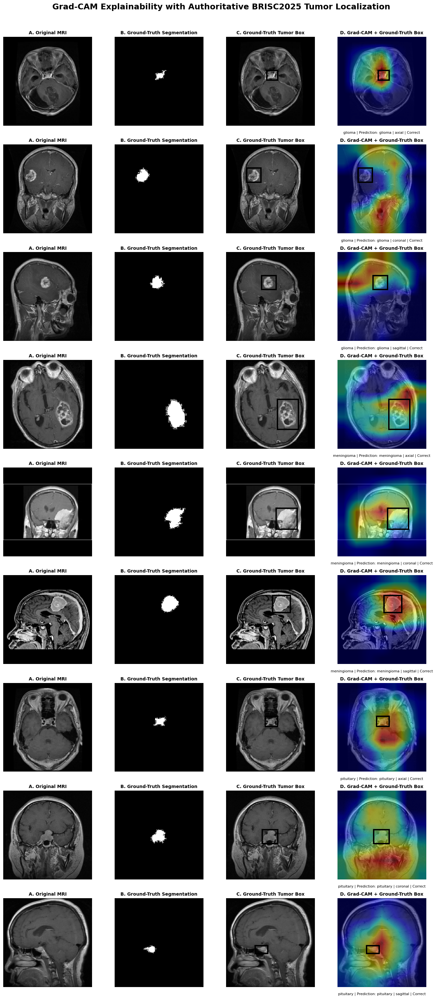


FINAL GRAD-CAM + GROUND-TRUTH BOX COMPLETE

Cases visualized: 9

Class distribution:
true_class
glioma        3
meningioma    3
pituitary     3

Plane distribution:
mri_plane
axial       3
coronal     3
sagittal    3

Figure:
D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\outputs\figures\gradcam\FINAL\FINAL_GRADCAM_WITH_AUTHORITATIVE_GROUND_TRUTH_BOXES.png

Record:
D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\outputs\reports\gradcam\FINAL\FINAL_GRADCAM_WITH_AUTHORITATIVE_GROUND_TRUTH_BOXES_RECORD.csv

Methodology:
D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\outputs\reports\gradcam\FINAL\FINAL_GRADCAM_WITH_AUTHORITATIVE_GROUND_TRUTH_BOXES_METHODOLOGY.txt

STATUS: PASS


In [37]:
# ============================================================
# CELL 18 — FINAL GRAD-CAM + AUTHORITATIVE GROUND-TRUTH BOX
# ============================================================
#
# Purpose:
#   Compare model attention with authoritative BRISC2025
#   segmentation-derived tumor bounding boxes.
#
# Cases:
#   3 glioma
#   3 meningioma
#   3 pituitary
#   Prefer axial + coronal + sagittal
#
# IMPORTANT:
#   - Official test set remains untouched.
#   - No training.
#   - No model modification.
#   - Only 9 Grad-CAM cases are generated to avoid GPU OOM.
# ============================================================

from pathlib import Path
import pandas as pd
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

from PIL import Image
from matplotlib.patches import Rectangle

print("=" * 80)
print("FINAL GRAD-CAM + AUTHORITATIVE GROUND-TRUTH BOX EXPLAINABILITY")
print("=" * 80)

# ============================================================
# 1. PATHS
# ============================================================

PROJECT_ROOT = Path(
    r"D:\MSC Bioinformatics\INTERNSHIP\BrainTumor"
)

MODEL_PATH = (
    PROJECT_ROOT
    / "models"
    / "final_densenet121"
    / "FINAL_DENSENET121_BRISC2025.keras"
)

PROCESSED_ROOT = (
    PROJECT_ROOT
    / "data"
    / "processed"
    / "classification_224_rgb"
)

BOX_FILE = (
    PROJECT_ROOT
    / "outputs"
    / "reports"
    / "gradcam"
    /
    "BRISC2025_AUTHORITATIVE_GROUND_TRUTH_BOUNDING_BOXES_224X224.csv"
)

PREDICTION_FILE = (
    PROJECT_ROOT
    / "outputs"
    / "predictions"
    / "final_densenet121"
    /
    "FINAL_DENSENET121_OFFICIAL_TEST_PREDICTIONS.csv"
)

FIGURE_DIR = (
    PROJECT_ROOT
    / "outputs"
    / "figures"
    / "gradcam"
    / "FINAL"
)

REPORT_DIR = (
    PROJECT_ROOT
    / "outputs"
    / "reports"
    / "gradcam"
    / "FINAL"
)

FIGURE_DIR.mkdir(
    parents=True,
    exist_ok=True
)

REPORT_DIR.mkdir(
    parents=True,
    exist_ok=True
)

assert MODEL_PATH.exists(), MODEL_PATH
assert BOX_FILE.exists(), BOX_FILE
assert PREDICTION_FILE.exists(), PREDICTION_FILE
assert PROCESSED_ROOT.exists(), PROCESSED_ROOT

# ============================================================
# 2. CONFIGURATION
# ============================================================

CLASS_NAMES = [
    "glioma",
    "meningioma",
    "no_tumor",
    "pituitary"
]

IMAGE_SIZE = 224

print(
    f"\nTensorFlow: {tf.__version__}"
)

print(
    f"GPU: "
    f"{tf.config.list_physical_devices('GPU')}"
)

print(
    f"Model: {MODEL_PATH}"
)

# ============================================================
# 3. LOAD FINAL MODEL
# ============================================================

model = tf.keras.models.load_model(
    MODEL_PATH
)

print(
    "\nFinal DenseNet121 loaded."
)

print(
    f"Input shape : {model.input_shape}"
)

print(
    f"Output shape: {model.output_shape}"
)

# ============================================================
# 4. IDENTIFY DENSENET BACKBONE
# ============================================================

densenet_backbone = None

for layer in model.layers:

    if isinstance(
        layer,
        tf.keras.Model
    ):

        if (
            "densenet"
            in layer.name.lower()
        ):

            densenet_backbone = layer

            break

assert densenet_backbone is not None

print(
    f"\nDenseNet backbone: "
    f"{densenet_backbone.name}"
)

# ============================================================
# 5. FIND LAST CONVOLUTIONAL LAYER
# ============================================================

conv_layers = []

for layer in densenet_backbone.layers:

    if isinstance(
        layer,
        tf.keras.layers.Conv2D
    ):

        conv_layers.append(
            layer
        )

assert len(conv_layers) > 0

last_conv_layer = conv_layers[-1]

print(
    f"Total Conv2D layers: "
    f"{len(conv_layers)}"
)

print(
    f"Target Grad-CAM layer: "
    f"{last_conv_layer.name}"
)

# ============================================================
# 6. FIND CLASSIFIER LAYERS
# ============================================================

classifier_layers = []

backbone_index = None

for i, layer in enumerate(
    model.layers
):

    if layer is densenet_backbone:

        backbone_index = i

        break

assert backbone_index is not None

classifier_layers = model.layers[
    backbone_index + 1:
]

print(
    "\nClassifier layers:"
)

for layer in classifier_layers:

    print(
        f"  {layer.name} "
        f"({layer.__class__.__name__})"
    )

# ============================================================
# 7. BUILD CONNECTED GRAD-CAM MODEL
# ============================================================
#
# We explicitly construct:
#
# input
#   ↓
# DenseNet
#   ↓
# classifier
#
# while simultaneously retaining the final Conv2D
# feature maps.
#
# This avoids the graph-disconnected issue encountered earlier.
# ============================================================

gradcam_feature_model = tf.keras.Model(
    inputs=densenet_backbone.input,
    outputs=[
        last_conv_layer.output,
        densenet_backbone.output
    ],
    name="gradcam_feature_model"
)

print(
    "\nFeature model:"
)

print(
    f"Input: "
    f"{gradcam_feature_model.input_shape}"
)

print(
    f"Feature maps: "
    f"{last_conv_layer.output_shape}"
)

print(
    f"Backbone output: "
    f"{densenet_backbone.output_shape}"
)

# ============================================================
# 8. RECONSTRUCT CLASSIFICATION LOGITS
# ============================================================

def forward_classifier(
    backbone_output,
    training=False
):

    x = backbone_output

    for layer in classifier_layers:

        # Dropout must be disabled for Grad-CAM
        if isinstance(
            layer,
            tf.keras.layers.Dropout
        ):

            x = layer(
                x,
                training=False
            )

        else:

            x = layer(
                x,
                training=training
            )

    return x


# ============================================================
# 9. TEST CONNECTED GRAPH
# ============================================================

dummy = tf.zeros(
    (
        1,
        IMAGE_SIZE,
        IMAGE_SIZE,
        3
    ),
    dtype=tf.float32
)

with tf.GradientTape() as tape:

    feature_maps, backbone_output = (
        gradcam_feature_model(
            dummy,
            training=False
        )
    )

    logits = forward_classifier(
        backbone_output,
        training=False
    )

print(
    "\nConnected graph test:"
)

print(
    f"Feature maps: "
    f"{feature_maps.shape}"
)

print(
    f"Logits: "
    f"{logits.shape}"
)

assert feature_maps is not None
assert logits.shape[-1] == 4

print(
    "Connected graph verification: PASS"
)

# ============================================================
# 10. GRAD-CAM FUNCTION
# ============================================================

def make_gradcam(
    image_array,
    class_index
):

    image_tensor = tf.convert_to_tensor(
        image_array[
            np.newaxis,
            ...
        ],
        dtype=tf.float32
    )

    with tf.GradientTape() as tape:

        feature_maps, backbone_output = (
            gradcam_feature_model(
                image_tensor,
                training=False
            )
        )

        logits = forward_classifier(
            backbone_output,
            training=False
        )

        target_logit = logits[
            0,
            class_index
        ]

    gradients = tape.gradient(
        target_logit,
        feature_maps
    )

    assert gradients is not None

    feature_maps = feature_maps[0]

    gradients = gradients[0]

    # --------------------------------------------------------
    # Global average pooling of gradients
    # --------------------------------------------------------

    weights = tf.reduce_mean(
        gradients,
        axis=(
            0,
            1
        )
    )

    # --------------------------------------------------------
    # Weighted combination of feature maps
    # --------------------------------------------------------

    cam = tf.reduce_sum(
        feature_maps
        *
        weights[
            tf.newaxis,
            tf.newaxis,
            :
        ],
        axis=-1
    )

    # ReLU
    cam = tf.maximum(
        cam,
        0
    )

    # Normalize
    cam_min = tf.reduce_min(
        cam
    )

    cam_max = tf.reduce_max(
        cam
    )

    cam = (
        cam - cam_min
    ) / (
        cam_max - cam_min
        + 1e-8
    )

    # Resize to 224x224
    cam = tf.image.resize(
        cam[
            tf.newaxis,
            ...,
            tf.newaxis
        ],
        (
            IMAGE_SIZE,
            IMAGE_SIZE
        ),
        method="bilinear"
    )

    cam = cam[
        0,
        ...,
        0
    ]

    return cam.numpy()


# ============================================================
# 11. LOAD BOX DATA
# ============================================================

boxes = pd.read_csv(
    BOX_FILE
)

print(
    f"\nAuthoritative box records: "
    f"{len(boxes)}"
)

assert len(boxes) == 860

# ============================================================
# 12. LOAD PREDICTIONS
# ============================================================

predictions = pd.read_csv(
    PREDICTION_FILE
)

print(
    f"Prediction records: "
    f"{len(predictions)}"
)

assert len(predictions) == 1000

# ============================================================
# 13. NORMALIZE COLUMN NAMES
# ============================================================

print(
    "\nBox columns:"
)

print(
    boxes.columns.tolist()
)

print(
    "\nPrediction columns:"
)

print(
    predictions.columns.tolist()
)

# ============================================================
# 14. ROBUST COLUMN FINDER
# ============================================================

def find_column(
    dataframe,
    possible_names
):

    for name in possible_names:

        if name in dataframe.columns:

            return name

    return None


box_filename_col = find_column(
    boxes,
    [
        "classification_filename",
        "filename",
        "test_filename"
    ]
)

box_class_col = find_column(
    boxes,
    [
        "true_class",
        "tumor_label",
        "class"
    ]
)

box_plane_col = find_column(
    boxes,
    [
        "mri_plane",
        "plane_label",
        "plane"
    ]
)

assert box_filename_col is not None
assert box_class_col is not None
assert box_plane_col is not None

# ============================================================
# 15. PREDICTION COLUMN FINDER
# ============================================================

pred_filename_col = find_column(
    predictions,
    [
        "filename",
        "classification_filename",
        "test_filename"
    ]
)

pred_true_col = find_column(
    predictions,
    [
        "true_class",
        "tumor_label",
        "true_label"
    ]
)

pred_pred_col = find_column(
    predictions,
    [
        "predicted_class",
        "prediction",
        "predicted_label"
    ]
)

assert pred_filename_col is not None
assert pred_true_col is not None
assert pred_pred_col is not None

# ============================================================
# 16. SELECT 9 CASES
# ============================================================
#
# 3 per tumor class.
# Prefer one axial, one coronal, one sagittal.
# ============================================================

selected_cases = []

for class_name in [
    "glioma",
    "meningioma",
    "pituitary"
]:

    class_boxes = boxes[
        boxes[
            box_class_col
        ]
        .astype(str)
        .str.lower()
        ==
        class_name
    ].copy()

    used_planes = set()

    # First pass: one case per plane
    for plane in [
        "axial",
        "coronal",
        "sagittal"
    ]:

        plane_rows = class_boxes[
            class_boxes[
                box_plane_col
            ]
            .astype(str)
            .str.lower()
            ==
            plane
        ]

        if len(plane_rows) == 0:
            continue

        row = plane_rows.iloc[0]

        selected_cases.append(
            row
        )

        used_planes.add(
            plane
        )

    # Second pass if fewer than 3
    if len(
        [
            x
            for x in selected_cases
            if str(
                x[box_class_col]
            ).lower()
            ==
            class_name
        ]
    ) < 3:

        remaining = class_boxes[
            ~class_boxes[
                box_plane_col
            ]
            .astype(str)
            .str.lower()
            .isin(
                used_planes
            )
        ]

        for _, row in remaining.iterrows():

            current_count = len(
                [
                    x
                    for x in selected_cases
                    if str(
                        x[box_class_col]
                    ).lower()
                    ==
                    class_name
                ]
            )

            if current_count >= 3:
                break

            selected_cases.append(
                row
            )

# ============================================================
# 17. LIMIT TO 9
# ============================================================

selected_cases = selected_cases[
    :9
]

assert len(
    selected_cases
) == 9

print(
    "\nSelected explainability cases:"
)

for i, row in enumerate(
    selected_cases,
    start=1
):

    print(
        f"{i:02d}. "
        f"{row[box_class_col]} | "
        f"{row[box_plane_col]} | "
        f"{row[box_filename_col]}"
    )

# ============================================================
# 18. CREATE FIGURE
# ============================================================
#
# Columns:
#
# A. Original MRI
# B. Ground-truth segmentation
# C. Ground-truth tumor box
# D. Grad-CAM + ground-truth box
#
# ============================================================

fig, axes = plt.subplots(
    9,
    4,
    figsize=(
        14,
        31
    )
)

visualization_records = []

# ============================================================
# 19. PROCESS EACH CASE
# ============================================================

for row_index, box_row in enumerate(
    selected_cases
):

    filename = str(
        box_row[
            box_filename_col
        ]
    ).strip()

    true_class = str(
        box_row[
            box_class_col
        ]
    ).strip()

    plane = str(
        box_row[
            box_plane_col
        ]
    ).strip()

    # --------------------------------------------------------
    # Find prediction
    # --------------------------------------------------------

    pred_rows = predictions[
        predictions[
            pred_filename_col
        ]
        .astype(str)
        .str.strip()
        ==
        filename
    ]

    if len(pred_rows) == 0:

        print(
            f"Prediction not found: {filename}"
        )

        continue

    pred_row = (
        pred_rows.iloc[0]
    )

    predicted_class = str(
        pred_row[
            pred_pred_col
        ]
    ).strip()

    # --------------------------------------------------------
    # Resolve processed image
    # --------------------------------------------------------

    stem = Path(
        filename
    ).stem

    image_candidates = list(
        PROCESSED_ROOT.rglob(
            f"{stem}.png"
        )
    )

    if len(image_candidates) == 0:

        print(
            f"Processed image not found: {filename}"
        )

        continue

    # Prefer test directory
    test_candidates = [
        p
        for p in image_candidates
        if "test" in p.parts
    ]

    if len(test_candidates) > 0:

        image_path = (
            test_candidates[0]
        )

    else:

        image_path = (
            image_candidates[0]
        )

    # --------------------------------------------------------
    # Load image
    # --------------------------------------------------------

    image = np.asarray(
        Image.open(
            image_path
        ).convert("RGB")
    ).astype(
        np.float32
    ) / 255.0

    assert image.shape == (
        224,
        224,
        3
    )

    # --------------------------------------------------------
    # Class index
    # --------------------------------------------------------

    if predicted_class in CLASS_NAMES:

        predicted_index = (
            CLASS_NAMES.index(
                predicted_class
            )
        )

    else:

        predicted_index = (
            CLASS_NAMES.index(
                true_class
            )
        )

    # --------------------------------------------------------
    # Grad-CAM
    # --------------------------------------------------------

    heatmap = make_gradcam(
        image,
        predicted_index
    )

    # --------------------------------------------------------
    # Ground-truth mask
    # --------------------------------------------------------

    mask_filename = str(
        box_row.get(
            "mask_filename",
            ""
        )
    ).strip()

    mask_path_value = str(
        box_row.get(
            "mask_path",
            ""
        )
    ).strip()

    mask_path = None

    if (
        mask_path_value
        and
        mask_path_value.lower()
        not in [
            "nan",
            "none"
        ]
    ):

        candidate = Path(
            mask_path_value
        )

        if candidate.exists():

            mask_path = candidate

    if mask_path is None:

        # Search using mask filename
        if mask_filename:

            mask_candidates = list(
                Path(
                    r"D:\MSC Bioinformatics\INTERNSHIP\brisc2025"
                ).rglob(
                    mask_filename
                )
            )

            if len(
                mask_candidates
            ) > 0:

                mask_path = (
                    mask_candidates[0]
                )

    assert mask_path is not None

    mask = np.asarray(
        Image.open(
            mask_path
        ).convert("L")
    )

    # --------------------------------------------------------
    # Transform mask to 224x224
    # --------------------------------------------------------

    binary = (
        mask > 0
    )

    h, w = binary.shape

    scale = min(
        224 / w,
        224 / h
    )

    new_w = max(
        1,
        int(
            round(
                w * scale
            )
        )
    )

    new_h = max(
        1,
        int(
            round(
                h * scale
            )
        )
    )

    mask_img = Image.fromarray(
        (
            binary.astype(
                np.uint8
            )
            * 255
        )
    )

    resized_mask = mask_img.resize(
        (
            new_w,
            new_h
        ),
        Image.Resampling.NEAREST
    )

    resized_mask = (
        np.asarray(
            resized_mask
        )
        > 0
    )

    pad_left = (
        224 - new_w
    ) // 2

    pad_top = (
        224 - new_h
    ) // 2

    pad_right = (
        224
        - new_w
        - pad_left
    )

    pad_bottom = (
        224
        - new_h
        - pad_top
    )

    mask_224 = np.pad(
        resized_mask,
        (
            (
                pad_top,
                pad_bottom
            ),
            (
                pad_left,
                pad_right
            )
        ),
        mode="constant"
    )

    # --------------------------------------------------------
    # Recalculate box from transformed mask
    # --------------------------------------------------------

    ys, xs = np.where(
        mask_224
    )

    assert len(xs) > 0

    x_min = int(
        xs.min()
    )

    x_max = int(
        xs.max()
    )

    y_min = int(
        ys.min()
    )

    y_max = int(
        ys.max()
    )

    # --------------------------------------------------------
    # A — ORIGINAL MRI
    # --------------------------------------------------------

    ax = axes[
        row_index,
        0
    ]

    ax.imshow(
        image
    )

    ax.set_title(
        "A. Original MRI",
        fontsize=10,
        fontweight="bold"
    )

    ax.axis(
        "off"
    )

    # --------------------------------------------------------
    # B — GROUND TRUTH SEGMENTATION
    # --------------------------------------------------------

    ax = axes[
        row_index,
        1
    ]

    ax.imshow(
        mask_224,
        cmap="gray"
    )

    ax.set_title(
        "B. Ground-Truth Segmentation",
        fontsize=10,
        fontweight="bold"
    )

    ax.axis(
        "off"
    )

    # --------------------------------------------------------
    # C — GROUND TRUTH BOX
    # --------------------------------------------------------

    ax = axes[
        row_index,
        2
    ]

    ax.imshow(
        image
    )

    rect = Rectangle(
        (
            x_min,
            y_min
        ),
        x_max - x_min + 1,
        y_max - y_min + 1,
        fill=False,
        linewidth=3
    )

    ax.add_patch(
        rect
    )

    ax.set_title(
        "C. Ground-Truth Tumor Box",
        fontsize=10,
        fontweight="bold"
    )

    ax.axis(
        "off"
    )

    # --------------------------------------------------------
    # D — GRAD-CAM + GROUND TRUTH BOX
    # --------------------------------------------------------

    ax = axes[
        row_index,
        3
    ]

    ax.imshow(
        image
    )

    ax.imshow(
        heatmap,
        cmap="jet",
        alpha=0.45,
        vmin=0,
        vmax=1
    )

    rect2 = Rectangle(
        (
            x_min,
            y_min
        ),
        x_max - x_min + 1,
        y_max - y_min + 1,
        fill=False,
        linewidth=3
    )

    ax.add_patch(
        rect2
    )

    correct = (
        true_class.lower()
        ==
        predicted_class.lower()
    )

    status = (
        "Correct"
        if correct
        else "Incorrect"
    )

    ax.set_title(
        "D. Grad-CAM + Ground-Truth Box",
        fontsize=10,
        fontweight="bold"
    )

    ax.text(
        0.5,
        -0.06,
        (
            f"{true_class} | "
            f"Prediction: {predicted_class} | "
            f"{plane} | {status}"
        ),
        transform=ax.transAxes,
        ha="center",
        va="top",
        fontsize=8
    )

    ax.axis(
        "off"
    )

    # --------------------------------------------------------
    # Record
    # --------------------------------------------------------

    visualization_records.append(
        {
            "filename":
                filename,

            "true_class":
                true_class,

            "predicted_class":
                predicted_class,

            "mri_plane":
                plane,

            "correct_prediction":
                correct,

            "gradcam_target_class":
                predicted_class,

            "gradcam_target_index":
                predicted_index,

            "bbox_x_min_224":
                x_min,

            "bbox_y_min_224":
                y_min,

            "bbox_x_max_224":
                x_max,

            "bbox_y_max_224":
                y_max,

            "image_path":
                str(image_path),

            "mask_path":
                str(mask_path)
        }
    )

# ============================================================
# 20. FINAL FIGURE TITLE
# ============================================================

fig.suptitle(
    "Grad-CAM Explainability with Authoritative BRISC2025 Tumor Localization",
    fontsize=18,
    fontweight="bold",
    y=0.995
)

plt.tight_layout(
    rect=[
        0,
        0,
        1,
        0.985
    ]
)

# ============================================================
# 21. SAVE FIGURE
# ============================================================

FINAL_FIGURE = (
    FIGURE_DIR
    /
    "FINAL_GRADCAM_WITH_AUTHORITATIVE_GROUND_TRUTH_BOXES.png"
)

plt.savefig(
    FINAL_FIGURE,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

# ============================================================
# 22. SAVE RECORD
# ============================================================

RECORD_FILE = (
    REPORT_DIR
    /
    "FINAL_GRADCAM_WITH_AUTHORITATIVE_GROUND_TRUTH_BOXES_RECORD.csv"
)

records_df = pd.DataFrame(
    visualization_records
)

records_df.to_csv(
    RECORD_FILE,
    index=False
)

# ============================================================
# 23. METHODOLOGY RECORD
# ============================================================

METHODOLOGY_FILE = (
    REPORT_DIR
    /
    "FINAL_GRADCAM_WITH_AUTHORITATIVE_GROUND_TRUTH_BOXES_METHODOLOGY.txt"
)

methodology_text = """
FINAL GRAD-CAM WITH AUTHORITATIVE GROUND-TRUTH BOXES
====================================================

Model:
DenseNet121 final reproducible model trained on the
5,000-image BRISC2025 development set.

Official test set:
1,000 images.

Explainability subset:
9 official test images with authoritative BRISC2025
segmentation masks.

Classes represented:
- glioma
- meningioma
- pituitary

MRI planes:
Axial, coronal and sagittal were preferentially represented.

Ground-truth localization:
Tumor segmentation masks were obtained through the
authoritative BRISC2025 manifest image-to-mask relationship.

Bounding boxes:
Bounding boxes were calculated from non-zero segmentation
mask pixels after applying the same aspect-ratio-preserving
resize and symmetric padding used for the 224x224 model input.

Grad-CAM:
Grad-CAM was calculated from the final convolutional layer
of the DenseNet121 backbone using the predicted class logit.

Interpretation:
The red rectangle represents the ground-truth tumor bounding
box derived from the segmentation mask.

The Grad-CAM heatmap represents model attention and should
not be interpreted as a segmentation prediction or exact
tumor boundary.

No official test images were used for training or model
selection.

No model parameters were modified during explainability
analysis.

Full 1,000-image Grad-CAM generation was not attempted because
backpropagation-based Grad-CAM exceeded the available 4-GB GPU
memory. A balanced qualitative subset was therefore used.
"""

with open(
    METHODOLOGY_FILE,
    "w",
    encoding="utf-8"
) as f:

    f.write(
        methodology_text.strip()
    )

# ============================================================
# 24. FINAL STATUS
# ============================================================

print(
    "\n" + "=" * 80
)

print(
    "FINAL GRAD-CAM + GROUND-TRUTH BOX COMPLETE"
)

print("=" * 80)

print(
    f"\nCases visualized: "
    f"{len(records_df)}"
)

print(
    "\nClass distribution:"
)

print(
    records_df[
        "true_class"
    ]
    .value_counts()
    .to_string()
)

print(
    "\nPlane distribution:"
)

print(
    records_df[
        "mri_plane"
    ]
    .value_counts()
    .to_string()
)

print(
    f"\nFigure:"
    f"\n{FINAL_FIGURE}"
)

print(
    f"\nRecord:"
    f"\n{RECORD_FILE}"
)

print(
    f"\nMethodology:"
    f"\n{METHODOLOGY_FILE}"
)

if len(records_df) == 9:

    print(
        "\nSTATUS: PASS"
    )

else:

    print(
        "\nSTATUS: REVIEW REQUIRED"
    )

print("=" * 80)

In [41]:
# ============================================================
# QUANTITATIVE GRAD-CAM LOCALIZATION
# CLEAN VERSION — NO MASK_PATH COLUMN REQUIRED
# ============================================================

from pathlib import Path
import gc
import json
import time

import numpy as np
import pandas as pd
import tensorflow as tf

from PIL import Image


# ============================================================
# 1. PATHS
# ============================================================

PROJECT_ROOT = Path(
    r"D:\MSC Bioinformatics\INTERNSHIP\BrainTumor"
)

BRISC_ROOT = Path(
    r"D:\MSC Bioinformatics\INTERNSHIP\brisc2025"
)

MODEL_PATH = (
    PROJECT_ROOT
    / "models"
    / "final_densenet121"
    / "FINAL_DENSENET121_BRISC2025.keras"
)

PROCESSED_ROOT = (
    PROJECT_ROOT
    / "data"
    / "processed"
    / "classification_224_rgb"
)

BOX_FILE = (
    PROJECT_ROOT
    / "outputs"
    / "reports"
    / "gradcam"
    / "BRISC2025_AUTHORITATIVE_GROUND_TRUTH_BOUNDING_BOXES_224X224.csv"
)

PREDICTION_FILE = (
    PROJECT_ROOT
    / "outputs"
    / "predictions"
    / "final_densenet121"
    / "FINAL_DENSENET121_OFFICIAL_TEST_PREDICTIONS.csv"
)

OUTPUT_DIR = (
    PROJECT_ROOT
    / "outputs"
    / "reports"
    / "gradcam"
    / "QUANTITATIVE_LOCALIZATION"
)

OUTPUT_DIR.mkdir(
    parents=True,
    exist_ok=True
)

RESULTS_FILE = (
    OUTPUT_DIR
    / "GRADCAM_860_IMAGE_LOCALIZATION_RESULTS.csv"
)

SUMMARY_FILE = (
    OUTPUT_DIR
    / "GRADCAM_860_IMAGE_LOCALIZATION_SUMMARY.csv"
)

CLASS_FILE = (
    OUTPUT_DIR
    / "GRADCAM_LOCALIZATION_BY_CLASS.csv"
)

PLANE_FILE = (
    OUTPUT_DIR
    / "GRADCAM_LOCALIZATION_BY_PLANE.csv"
)

ERROR_FILE = (
    OUTPUT_DIR
    / "GRADCAM_LOCALIZATION_ERRORS.csv"
)

CONFIG_FILE = (
    OUTPUT_DIR
    / "GRADCAM_QUANTITATIVE_LOCALIZATION_CONFIGURATION.json"
)


# ============================================================
# 2. CONSTANTS
# ============================================================

IMAGE_SIZE = 224

CLASS_NAMES = [
    "glioma",
    "meningioma",
    "no_tumor",
    "pituitary"
]

IOU_THRESHOLDS = [
    0.30,
    0.50,
    0.70
]

CHECKPOINT_INTERVAL = 10


# ============================================================
# 3. VERIFY REQUIRED FILES
# ============================================================

print("=" * 80)
print("QUANTITATIVE GRAD-CAM LOCALIZATION")
print("=" * 80)

required_paths = [
    MODEL_PATH,
    PROCESSED_ROOT,
    BRISC_ROOT,
    BOX_FILE,
    PREDICTION_FILE
]

for path in required_paths:

    if not path.exists():

        raise FileNotFoundError(
            f"\nRequired path not found:\n{path}"
        )

    print(
        "[OK]",
        path
    )


# ============================================================
# 4. LOAD AUTHORITATIVE BOUNDING BOX DATA
# ============================================================

boxes = pd.read_csv(
    BOX_FILE
)

print(
    "\nAuthoritative box records:",
    len(boxes)
)

print(
    "Box CSV columns:"
)

print(
    boxes.columns.tolist()
)

if len(boxes) != 860:

    raise RuntimeError(
        f"Expected 860 authoritative records, "
        f"found {len(boxes)}."
    )


# ============================================================
# 5. IDENTIFY BOX CSV COLUMNS
# ============================================================

def find_column(
    dataframe,
    candidates
):

    for candidate in candidates:

        if candidate in dataframe.columns:

            return candidate

    return None


filename_col = find_column(
    boxes,
    [
        "classification_filename",
        "filename",
        "test_filename",
        "image_filename"
    ]
)

class_col = find_column(
    boxes,
    [
        "true_class",
        "tumor_label",
        "class",
        "tumor_class"
    ]
)

plane_col = find_column(
    boxes,
    [
        "mri_plane",
        "plane_label",
        "plane"
    ]
)


if filename_col is None:

    raise RuntimeError(
        "Could not identify filename column in authoritative box CSV."
    )

if class_col is None:

    raise RuntimeError(
        "Could not identify class column in authoritative box CSV."
    )

if plane_col is None:

    raise RuntimeError(
        "Could not identify MRI plane column in authoritative box CSV."
    )


print(
    "\nUsing filename column:",
    filename_col
)

print(
    "Using class column:",
    class_col
)

print(
    "Using plane column:",
    plane_col
)


# ============================================================
# 6. LOAD OFFICIAL TEST PREDICTIONS
# ============================================================

predictions = pd.read_csv(
    PREDICTION_FILE
)

print(
    "\nOfficial prediction records:",
    len(predictions)
)

if len(predictions) != 1000:

    raise RuntimeError(
        "Official prediction file must contain exactly 1000 records."
    )


prediction_filename_col = find_column(
    predictions,
    [
        "filename",
        "classification_filename",
        "test_filename",
        "image_filename"
    ]
)

prediction_class_col = find_column(
    predictions,
    [
        "predicted_class",
        "prediction",
        "predicted_label"
    ]
)


if prediction_filename_col is None:

    raise RuntimeError(
        "Could not identify filename column in prediction CSV."
    )

if prediction_class_col is None:

    raise RuntimeError(
        "Could not identify predicted-class column in prediction CSV."
    )


print(
    "Prediction filename column:",
    prediction_filename_col
)

print(
    "Prediction class column:",
    prediction_class_col
)


# ============================================================
# 7. CREATE CLEAN MATCH KEYS
# ============================================================

boxes["match_key"] = (
    boxes[filename_col]
    .astype(str)
    .str.strip()
    .apply(
        lambda x: Path(x).name
    )
)

predictions["match_key"] = (
    predictions[prediction_filename_col]
    .astype(str)
    .str.strip()
    .apply(
        lambda x: Path(x).name
    )
)


# ============================================================
# 8. MERGE AUTHORITATIVE BOXES WITH PREDICTIONS
# ============================================================

analysis = boxes.merge(
    predictions[
        [
            "match_key",
            prediction_class_col
        ]
    ],
    on="match_key",
    how="left",
    validate="one_to_one"
)


if len(analysis) != 860:

    raise RuntimeError(
        f"Expected 860 merged records, "
        f"got {len(analysis)}."
    )


missing_predictions = analysis[
    analysis[prediction_class_col].isna()
]

if len(missing_predictions) > 0:

    raise RuntimeError(
        f"{len(missing_predictions)} authoritative images "
        f"could not be matched to predictions."
    )


print(
    "\nAuthoritative boxes ↔ predictions: PASS"
)


# ============================================================
# 9. VERIFY AUTHORITATIVE MASK LOCATION
# ============================================================

MASK_ROOT = (
    BRISC_ROOT
    / "segmentation_task"
    / "test"
    / "masks"
)

if not MASK_ROOT.exists():

    raise FileNotFoundError(
        f"Authoritative mask directory not found:\n{MASK_ROOT}"
    )

print(
    "Authoritative mask directory:",
    MASK_ROOT
)


# ============================================================
# 10. MASK PATH FUNCTION
# ============================================================

def get_authoritative_mask_path(
    filename
):

    filename = Path(
        str(filename)
    ).name

    mask_filename = (
        Path(filename).stem
        + ".png"
    )

    direct_path = (
        MASK_ROOT
        / mask_filename
    )

    if direct_path.exists():

        return direct_path


    # Safety fallback
    matches = list(
        MASK_ROOT.rglob(
            mask_filename
        )
    )

    if len(matches) == 1:

        return matches[0]

    if len(matches) > 1:

        raise RuntimeError(
            f"Multiple masks found for {filename}"
        )

    return None


# ============================================================
# 11. VERIFY ALL 860 MASKS BEFORE MODEL WORK
# ============================================================

print(
    "\nVerifying 860 authoritative masks..."
)

missing_masks = []

for filename in analysis["match_key"]:

    mask_path = get_authoritative_mask_path(
        filename
    )

    if mask_path is None:

        missing_masks.append(
            filename
        )


if len(missing_masks) > 0:

    raise RuntimeError(
        f"{len(missing_masks)} authoritative masks "
        f"could not be located."
    )


print(
    "All 860 authoritative masks found: PASS"
)


# ============================================================
# 12. CLEAR TENSORFLOW STATE
# ============================================================

gc.collect()

tf.keras.backend.clear_session()

gc.collect()


# ============================================================
# 13. LOAD FINAL DENSENET121 ON CPU
# ============================================================

print(
    "\nLoading final DenseNet121 on CPU..."
)

with tf.device(
    "/CPU:0"
):

    final_model = tf.keras.models.load_model(
        MODEL_PATH
    )

print(
    "Model loaded successfully."
)

print(
    "Input:",
    final_model.input_shape
)

print(
    "Output:",
    final_model.output_shape
)

print(
    "Parameters:",
    final_model.count_params()
)


# ============================================================
# 14. FIND DENSENET BACKBONE
# ============================================================

backbone = None

for layer in final_model.layers:

    if isinstance(
        layer,
        tf.keras.Model
    ):

        if "densenet" in layer.name.lower():

            backbone = layer
            break


if backbone is None:

    raise RuntimeError(
        "DenseNet backbone not found."
    )


print(
    "\nDenseNet backbone:",
    backbone.name
)


# ============================================================
# 15. FIND LAST CONVOLUTIONAL LAYER
# ============================================================

conv_layers = []

for layer in backbone.layers:

    if isinstance(
        layer,
        tf.keras.layers.Conv2D
    ):

        conv_layers.append(
            layer
        )


if len(conv_layers) == 0:

    raise RuntimeError(
        "No Conv2D layers found inside DenseNet."
    )


target_conv = conv_layers[-1]

print(
    "Grad-CAM layer:",
    target_conv.name
)

print(
    "Grad-CAM layer output:",
    target_conv.output_shape
)


# ============================================================
# 16. CONNECTED FEATURE MODEL
# ============================================================

feature_model = tf.keras.Model(
    inputs=backbone.input,
    outputs=[
        target_conv.output,
        backbone.output
    ]
)


# ============================================================
# 17. FIND CLASSIFIER LAYERS
# ============================================================

backbone_index = None

for i, layer in enumerate(
    final_model.layers
):

    if layer is backbone:

        backbone_index = i
        break


if backbone_index is None:

    raise RuntimeError(
        "Could not locate DenseNet backbone in final model."
    )


classifier_layers = final_model.layers[
    backbone_index + 1:
]


print(
    "\nClassifier layers:"
)

for layer in classifier_layers:

    print(
        " ",
        layer.name,
        "->",
        type(layer).__name__
    )


# ============================================================
# 18. CLASSIFIER FOR LOGITS
# ============================================================

def classifier_forward(
    x
):

    for layer in classifier_layers:

        x = layer(
            x,
            training=False
        )

    return x


# ============================================================
# 19. GRAPH VERIFICATION
# ============================================================

print(
    "\nTesting connected Grad-CAM graph..."
)

dummy_image = np.zeros(
    (
        1,
        IMAGE_SIZE,
        IMAGE_SIZE,
        3
    ),
    dtype=np.float32
)

with tf.device(
    "/CPU:0"
):

    test_feature_maps, test_backbone = feature_model(
        dummy_image,
        training=False
    )

    test_logits = classifier_forward(
        test_backbone
    )


print(
    "Feature maps:",
    test_feature_maps.shape
)

print(
    "Logits:",
    test_logits.shape
)


if tuple(
    test_logits.shape
) != (
    1,
    4
):

    raise RuntimeError(
        f"Unexpected logits shape: "
        f"{test_logits.shape}"
    )


print(
    "Connected graph: PASS"
)


del dummy_image
del test_feature_maps
del test_backbone
del test_logits

gc.collect()


# ============================================================
# 20. GRAD-CAM FUNCTION
# ============================================================

def generate_gradcam(
    image,
    class_index
):

    image_tensor = tf.convert_to_tensor(
        image[
            np.newaxis,
            ...
        ],
        dtype=tf.float32
    )

    with tf.device(
        "/CPU:0"
    ):

        with tf.GradientTape() as tape:

            feature_maps, backbone_output = feature_model(
                image_tensor,
                training=False
            )

            logits = classifier_forward(
                backbone_output
            )

            target_logit = logits[
                0,
                class_index
            ]

        gradients = tape.gradient(
            target_logit,
            feature_maps
        )

        if gradients is None:

            raise RuntimeError(
                "Grad-CAM gradients are None."
            )

        feature_maps = feature_maps[0]

        gradients = gradients[0]

        weights = tf.reduce_mean(
            gradients,
            axis=(0, 1)
        )

        cam = tf.reduce_sum(
            feature_maps
            *
            weights[
                None,
                None,
                :
            ],
            axis=-1
        )

        cam = tf.maximum(
            cam,
            0
        )

        cam_min = tf.reduce_min(
            cam
        )

        cam_max = tf.reduce_max(
            cam
        )

        cam = (
            cam - cam_min
        ) / (
            cam_max
            -
            cam_min
            +
            1e-8
        )

        cam = tf.image.resize(
            cam[
                None,
                :,
                :,
                None
            ],
            (
                IMAGE_SIZE,
                IMAGE_SIZE
            ),
            method="bilinear"
        )

        cam = cam[
            0,
            :,
            :,
            0
        ]

    return cam.numpy()


# ============================================================
# 21. MASK RESIZING
# ============================================================

def prepare_mask(
    mask_path
):

    mask_image = Image.open(
        mask_path
    ).convert(
        "L"
    )

    mask_array = np.asarray(
        mask_image
    )

    mask_array = (
        mask_array > 0
    )


    original_height = (
        mask_array.shape[0]
    )

    original_width = (
        mask_array.shape[1]
    )


    scale = min(
        IMAGE_SIZE / original_width,
        IMAGE_SIZE / original_height
    )


    resized_width = max(
        1,
        int(
            round(
                original_width * scale
            )
        )
    )

    resized_height = max(
        1,
        int(
            round(
                original_height * scale
            )
        )
    )


    mask_pil = Image.fromarray(
        (
            mask_array.astype(
                np.uint8
            )
            *
            255
        )
    )


    mask_pil = mask_pil.resize(
        (
            resized_width,
            resized_height
        ),
        Image.Resampling.NEAREST
    )


    resized_mask = (
        np.asarray(
            mask_pil
        )
        > 0
    )


    pad_left = (
        IMAGE_SIZE
        -
        resized_width
    ) // 2

    pad_right = (
        IMAGE_SIZE
        -
        resized_width
        -
        pad_left
    )

    pad_top = (
        IMAGE_SIZE
        -
        resized_height
    ) // 2

    pad_bottom = (
        IMAGE_SIZE
        -
        resized_height
        -
        pad_top
    )


    final_mask = np.pad(
        resized_mask,
        (
            (
                pad_top,
                pad_bottom
            ),
            (
                pad_left,
                pad_right
            )
        ),
        mode="constant",
        constant_values=False
    )


    return final_mask


# ============================================================
# 22. LOAD PREVIOUS CHECKPOINT
# ============================================================

results = []

completed_files = set()


if RESULTS_FILE.exists():

    previous_results = pd.read_csv(
        RESULTS_FILE
    )

    required_result_columns = [
        "filename",
        "pointing_game_inside_tumor",
        "energy_inside_tumor_ratio",
        "iou_03",
        "iou_05",
        "iou_07"
    ]

    previous_is_valid = True

    for column in required_result_columns:

        if column not in previous_results.columns:

            previous_is_valid = False

            break


    if previous_is_valid:

        previous_results = previous_results.dropna(
            subset=[
                "pointing_game_inside_tumor",
                "energy_inside_tumor_ratio",
                "iou_03",
                "iou_05",
                "iou_07"
            ]
        )

        results = previous_results.to_dict(
            orient="records"
        )

        completed_files = set(
            previous_results[
                "filename"
            ]
            .astype(str)
        )

        print(
            "\nPrevious completed cases:",
            len(completed_files)
        )


# ============================================================
# 23. QUANTITATIVE GRAD-CAM
# ============================================================

print(
    "\n"
    + "=" * 80
)

print(
    "STARTING QUANTITATIVE GRAD-CAM"
)

print(
    "=" * 80
)

print(
    "Total authoritative cases: 860"
)

print(
    "Already completed:",
    len(completed_files)
)

print(
    "Remaining:",
    860 - len(completed_files)
)

print(
    "Execution device: CPU"
)

print(
    "Checkpoint interval:",
    CHECKPOINT_INTERVAL
)


errors = []

new_cases = 0

start_time = time.time()


# ============================================================
# 24. PROCESS EACH IMAGE
# ============================================================

for case_index in range(
    len(analysis)
):

    row = analysis.iloc[
        case_index
    ]

    filename = str(
        row["match_key"]
    ).strip()


    if filename in completed_files:

        continue


    try:

        true_class = str(
            row[class_col]
        ).strip()

        predicted_class = str(
            row[prediction_class_col]
        ).strip()

        plane = str(
            row[plane_col]
        ).strip()


        # ----------------------------------------------------
        # PROCESSED MRI
        # ----------------------------------------------------

        image_stem = Path(
            filename
        ).stem


        image_matches = list(
            PROCESSED_ROOT.rglob(
                image_stem + ".png"
            )
        )


        image_matches = [
            p
            for p in image_matches
            if "test" in p.parts
        ]


        if len(image_matches) == 0:

            raise FileNotFoundError(
                f"Processed MRI not found: {filename}"
            )


        if len(image_matches) > 1:

            # Prefer exact class directory
            class_matches = [
                p
                for p in image_matches
                if true_class in p.parts
            ]

            if len(class_matches) == 1:

                image_path = class_matches[0]

            else:

                raise RuntimeError(
                    f"Multiple processed MRI files found: "
                    f"{filename}"
                )

        else:

            image_path = image_matches[0]


        # ----------------------------------------------------
        # LOAD MRI
        # ----------------------------------------------------

        image = np.asarray(
            Image.open(
                image_path
            ).convert(
                "RGB"
            )
        ).astype(
            np.float32
        )


        image = (
            image / 255.0
        )


        if image.shape != (
            224,
            224,
            3
        ):

            raise RuntimeError(
                f"Unexpected image shape: "
                f"{image.shape}"
            )


        # ----------------------------------------------------
        # AUTHORITATIVE MASK
        # ----------------------------------------------------

        mask_path = get_authoritative_mask_path(
            filename
        )


        if mask_path is None:

            raise FileNotFoundError(
                f"Authoritative mask not found: "
                f"{filename}"
            )


        mask = prepare_mask(
            mask_path
        )


        if int(
            mask.sum()
        ) == 0:

            raise RuntimeError(
                "Authoritative tumor mask is empty."
            )


        # ----------------------------------------------------
        # GRAD-CAM TARGET
        # ----------------------------------------------------

        if predicted_class not in CLASS_NAMES:

            raise RuntimeError(
                f"Unknown predicted class: "
                f"{predicted_class}"
            )


        target_class_index = CLASS_NAMES.index(
            predicted_class
        )


        # ----------------------------------------------------
        # GRAD-CAM
        # ----------------------------------------------------

        heatmap = generate_gradcam(
            image,
            target_class_index
        )


        heatmap = np.nan_to_num(
            heatmap,
            nan=0.0,
            posinf=0.0,
            neginf=0.0
        )


        heatmap = np.clip(
            heatmap,
            0.0,
            1.0
        )


        # ----------------------------------------------------
        # POINTING GAME
        # ----------------------------------------------------

        peak_position = np.unravel_index(
            np.argmax(
                heatmap
            ),
            heatmap.shape
        )


        peak_y = int(
            peak_position[0]
        )

        peak_x = int(
            peak_position[1]
        )


        pointing_inside = bool(
            mask[
                peak_y,
                peak_x
            ]
        )


        # ----------------------------------------------------
        # ENERGY INSIDE TUMOR
        # ----------------------------------------------------

        total_energy = float(
            np.sum(
                heatmap
            )
        )

        tumor_energy = float(
            np.sum(
                heatmap[
                    mask
                ]
            )
        )


        if total_energy > 0:

            energy_ratio = (
                tumor_energy
                /
                total_energy
            )

        else:

            energy_ratio = 0.0


        # ----------------------------------------------------
        # GRAD-CAM IoU
        # ----------------------------------------------------

        iou_values = {}


        for threshold in IOU_THRESHOLDS:

            cam_binary = (
                heatmap >= threshold
            )


            intersection = np.logical_and(
                cam_binary,
                mask
            ).sum()


            union = np.logical_or(
                cam_binary,
                mask
            ).sum()


            if union > 0:

                iou = (
                    float(intersection)
                    /
                    float(union)
                )

            else:

                iou = 0.0


            threshold_name = (
                str(threshold)
                .replace(
                    ".",
                    ""
                )
            )


            iou_values[
                threshold_name
            ] = iou


        # ----------------------------------------------------
        # RECORD
        # ----------------------------------------------------

        result = {
            "filename": filename,
            "true_class": true_class,
            "predicted_class": predicted_class,
            "correct_prediction": (
                true_class
                ==
                predicted_class
            ),
            "mri_plane": plane,
            "gradcam_target_class": predicted_class,
            "gradcam_target_index": target_class_index,
            "tumor_pixels": int(
                mask.sum()
            ),
            "gradcam_peak_x": peak_x,
            "gradcam_peak_y": peak_y,
            "pointing_game_inside_tumor": pointing_inside,
            "gradcam_total_energy": total_energy,
            "gradcam_energy_inside_tumor": tumor_energy,
            "energy_inside_tumor_ratio": energy_ratio,
            "iou_03": iou_values["03"],
            "iou_05": iou_values["05"],
            "iou_07": iou_values["07"],
            "image_path": str(
                image_path
            ),
            "mask_path": str(
                mask_path
            )
        }


        results.append(
            result
        )

        completed_files.add(
            filename
        )

        new_cases += 1


        # ----------------------------------------------------
        # CHECKPOINT
        # ----------------------------------------------------

        if (
            new_cases
            %
            CHECKPOINT_INTERVAL
            ==
            0
        ):

            results_dataframe = pd.DataFrame(
                results
            )

            results_dataframe.to_csv(
                RESULTS_FILE,
                index=False
            )


            elapsed_minutes = (
                time.time()
                -
                start_time
            ) / 60.0


            print(
                f"CHECKPOINT "
                f"{len(results)}/860 | "
                f"{elapsed_minutes:.1f} min"
            )


        # ----------------------------------------------------
        # MEMORY CLEANUP
        # ----------------------------------------------------

        del image
        del mask
        del heatmap

        gc.collect()


    except Exception as error:

        errors.append(
            {
                "filename": filename,
                "error": str(error)
            }
        )


        print(
            "\nERROR:",
            filename
        )

        print(
            "Reason:",
            str(error)
        )


# ============================================================
# 25. SAVE FINAL RESULTS
# ============================================================

results_dataframe = pd.DataFrame(
    results
)

results_dataframe.to_csv(
    RESULTS_FILE,
    index=False
)


# ============================================================
# 26. SAVE ERRORS
# ============================================================

if len(errors) > 0:

    pd.DataFrame(
        errors
    ).to_csv(
        ERROR_FILE,
        index=False
    )


# ============================================================
# 27. SUCCESSFUL RESULTS
# ============================================================

metric_columns = [
    "pointing_game_inside_tumor",
    "energy_inside_tumor_ratio",
    "iou_03",
    "iou_05",
    "iou_07"
]


if len(results_dataframe) > 0:

    successful = results_dataframe.dropna(
        subset=metric_columns
    ).copy()

else:

    successful = pd.DataFrame()


# ============================================================
# 28. OVERALL SUMMARY
# ============================================================

if len(successful) > 0:

    overall = pd.DataFrame(
        {
            "metric": [
                "Authoritative cases",
                "Successfully analyzed",
                "Processing errors",
                "Pointing Game Accuracy",
                "Mean Energy Inside Tumor",
                "Median Energy Inside Tumor",
                "Mean IoU @ 0.30",
                "Mean IoU @ 0.50",
                "Mean IoU @ 0.70"
            ],
            "value": [
                860,
                len(successful),
                len(errors),
                successful[
                    "pointing_game_inside_tumor"
                ].mean(),
                successful[
                    "energy_inside_tumor_ratio"
                ].mean(),
                successful[
                    "energy_inside_tumor_ratio"
                ].median(),
                successful[
                    "iou_03"
                ].mean(),
                successful[
                    "iou_05"
                ].mean(),
                successful[
                    "iou_07"
                ].mean()
            ]
        }
    )

else:

    overall = pd.DataFrame(
        {
            "metric": [
                "Authoritative cases",
                "Successfully analyzed",
                "Processing errors"
            ],
            "value": [
                860,
                0,
                len(errors)
            ]
        }
    )


overall.to_csv(
    SUMMARY_FILE,
    index=False
)


# ============================================================
# 29. CLASS SUMMARY
# ============================================================

if len(successful) > 0:

    class_summary = (
        successful
        .groupby(
            "true_class"
        )
        .agg(
            images=(
                "filename",
                "count"
            ),
            pointing_game_accuracy=(
                "pointing_game_inside_tumor",
                "mean"
            ),
            mean_energy_inside_tumor=(
                "energy_inside_tumor_ratio",
                "mean"
            ),
            mean_iou_030=(
                "iou_03",
                "mean"
            ),
            mean_iou_050=(
                "iou_05",
                "mean"
            ),
            mean_iou_070=(
                "iou_07",
                "mean"
            )
        )
        .reset_index()
    )

else:

    class_summary = pd.DataFrame()


class_summary.to_csv(
    CLASS_FILE,
    index=False
)


# ============================================================
# 30. MRI PLANE SUMMARY
# ============================================================

if len(successful) > 0:

    plane_summary = (
        successful
        .groupby(
            "mri_plane"
        )
        .agg(
            images=(
                "filename",
                "count"
            ),
            pointing_game_accuracy=(
                "pointing_game_inside_tumor",
                "mean"
            ),
            mean_energy_inside_tumor=(
                "energy_inside_tumor_ratio",
                "mean"
            ),
            mean_iou_030=(
                "iou_03",
                "mean"
            ),
            mean_iou_050=(
                "iou_05",
                "mean"
            ),
            mean_iou_070=(
                "iou_07",
                "mean"
            )
        )
        .reset_index()
    )

else:

    plane_summary = pd.DataFrame()


plane_summary.to_csv(
    PLANE_FILE,
    index=False
)


# ============================================================
# 31. CONFIGURATION RECORD
# ============================================================

configuration = {
    "dataset": "BRISC2025",
    "official_test_images": 1000,
    "authoritative_segmentation_matches": 860,
    "analysis_images": 860,
    "model": "FINAL_DENSENET121_BRISC2025.keras",
    "gradcam_layer": target_conv.name,
    "gradcam_target": "predicted_class_logit",
    "input_size": [
        224,
        224,
        3
    ],
    "iou_thresholds": IOU_THRESHOLDS,
    "execution_device": "CPU",
    "training_performed": False,
    "model_modified": False,
    "official_test_modified": False,
    "ground_truth_source": (
        "BRISC2025 authoritative segmentation masks"
    ),
    "mask_path_method": (
        "segmentation_task/test/masks/<classification_filename_stem>.png"
    )
}


with open(
    CONFIG_FILE,
    "w",
    encoding="utf-8"
) as file:

    json.dump(
        configuration,
        file,
        indent=4
    )


# ============================================================
# 32. FINAL REPORT
# ============================================================

print(
    "\n"
)

print(
    "=" * 80
)

print(
    "QUANTITATIVE GRAD-CAM ANALYSIS COMPLETE"
)

print(
    "=" * 80
)

print(
    "Authoritative cases:",
    860
)

print(
    "Successfully analyzed:",
    len(successful)
)

print(
    "Processing errors:",
    len(errors)
)


if len(successful) > 0:

    print(
        "\n"
        + "-" * 60
    )

    print(
        "OVERALL LOCALIZATION RESULTS"
    )

    print(
        "-" * 60
    )


    pointing_value = successful[
        "pointing_game_inside_tumor"
    ].mean()

    energy_value = successful[
        "energy_inside_tumor_ratio"
    ].mean()

    iou03_value = successful[
        "iou_03"
    ].mean()

    iou05_value = successful[
        "iou_05"
    ].mean()

    iou07_value = successful[
        "iou_07"
    ].mean()


    print(
        "Pointing Game Accuracy:",
        f"{pointing_value * 100:.2f}%"
    )

    print(
        "Mean Energy Inside Tumor:",
        f"{energy_value * 100:.2f}%"
    )

    print(
        "Mean IoU @ 0.30:",
        f"{iou03_value * 100:.2f}%"
    )

    print(
        "Mean IoU @ 0.50:",
        f"{iou05_value * 100:.2f}%"
    )

    print(
        "Mean IoU @ 0.70:",
        f"{iou07_value * 100:.2f}%"
    )


    print(
        "\n"
        + "-" * 60
    )

    print(
        "LOCALIZATION BY CLASS"
    )

    print(
        "-" * 60
    )

    print(
        class_summary.to_string(
            index=False
        )
    )


    print(
        "\n"
        + "-" * 60
    )

    print(
        "LOCALIZATION BY MRI PLANE"
    )

    print(
        "-" * 60
    )

    print(
        plane_summary.to_string(
            index=False
        )
    )


# ============================================================
# 33. SAVED FILES
# ============================================================

print(
    "\n"
    + "-" * 60
)

print(
    "SAVED FILES"
)

print(
    "-" * 60
)

print(
    RESULTS_FILE
)

print(
    SUMMARY_FILE
)

print(
    CLASS_FILE
)

print(
    PLANE_FILE
)

print(
    CONFIG_FILE
)


if len(errors) > 0:

    print(
        ERROR_FILE
    )


# ============================================================
# 34. STATUS
# ============================================================

if (
    len(successful) == 860
    and
    len(errors) == 0
):

    print(
        "\nSTATUS: PASS"
    )

elif len(successful) > 0:

    print(
        "\nSTATUS: PARTIAL"
    )

else:

    print(
        "\nSTATUS: FAIL"
    )


print(
    "=" * 80
)

QUANTITATIVE GRAD-CAM LOCALIZATION
[OK] D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\models\final_densenet121\FINAL_DENSENET121_BRISC2025.keras
[OK] D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\data\processed\classification_224_rgb
[OK] D:\MSC Bioinformatics\INTERNSHIP\brisc2025
[OK] D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\outputs\reports\gradcam\BRISC2025_AUTHORITATIVE_GROUND_TRUTH_BOUNDING_BOXES_224X224.csv
[OK] D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\outputs\predictions\final_densenet121\FINAL_DENSENET121_OFFICIAL_TEST_PREDICTIONS.csv

Authoritative box records: 860
Box CSV columns:
['filename', 'true_class', 'mri_plane', 'mask_filename', 'mask_relative_path', 'actual_mask_path', 'original_mask_width', 'original_mask_height', 'resize_scale', 'resized_width', 'resized_height', 'pad_left', 'pad_top', 'pad_right', 'pad_bottom', 'tumor_pixels_224', 'bbox_x_min_224', 'bbox_y_min_224', 'bbox_x_max_224', 'bbox_y_max_224', 'bbox_width_224', 'bbox_height_224', 'bbox_area_224']

Using f

In [42]:
# ============================================================
# GRAD-CAM QUANTITATIVE RESULTS ANALYSIS
# ============================================================

from pathlib import Path
import pandas as pd
import numpy as np

PROJECT_ROOT = Path(
    r"D:\MSC Bioinformatics\INTERNSHIP\BrainTumor"
)

RESULTS_DIR = (
    PROJECT_ROOT
    / "outputs"
    / "reports"
    / "gradcam"
    / "QUANTITATIVE_LOCALIZATION"
)

RESULTS_FILE = (
    RESULTS_DIR
    / "GRADCAM_860_IMAGE_LOCALIZATION_RESULTS.csv"
)

SUMMARY_FILE = (
    RESULTS_DIR
    / "GRADCAM_860_IMAGE_LOCALIZATION_SUMMARY.csv"
)

CLASS_FILE = (
    RESULTS_DIR
    / "GRADCAM_LOCALIZATION_BY_CLASS.csv"
)

PLANE_FILE = (
    RESULTS_DIR
    / "GRADCAM_LOCALIZATION_BY_PLANE.csv"
)


# ============================================================
# VERIFY
# ============================================================

print("=" * 80)
print("GRAD-CAM QUANTITATIVE RESULTS ANALYSIS")
print("=" * 80)

for path in [
    RESULTS_FILE,
    SUMMARY_FILE,
    CLASS_FILE,
    PLANE_FILE
]:

    if not path.exists():

        raise FileNotFoundError(
            f"Required results file not found:\n{path}"
        )

    print("[OK]", path)


# ============================================================
# LOAD
# ============================================================

results = pd.read_csv(
    RESULTS_FILE
)

summary = pd.read_csv(
    SUMMARY_FILE
)

class_summary = pd.read_csv(
    CLASS_FILE
)

plane_summary = pd.read_csv(
    PLANE_FILE
)


# ============================================================
# BASIC COUNTS
# ============================================================

print("\n")
print("=" * 80)
print("DATASET SUMMARY")
print("=" * 80)

print(
    "Total quantitative Grad-CAM cases:",
    len(results)
)

print(
    "Classes:",
    results["true_class"].value_counts().to_dict()
)

print(
    "MRI planes:",
    results["mri_plane"].value_counts().to_dict()
)

print(
    "Correct predictions:",
    int(results["correct_prediction"].sum())
)

print(
    "Incorrect predictions:",
    int(
        (~results["correct_prediction"]).sum()
    )
)


# ============================================================
# OVERALL METRICS
# ============================================================

metric_columns = [
    "pointing_game_inside_tumor",
    "energy_inside_tumor_ratio",
    "iou_03",
    "iou_05",
    "iou_07"
]

clean = results.dropna(
    subset=metric_columns
).copy()


print("\n")
print("=" * 80)
print("OVERALL GRAD-CAM LOCALIZATION PERFORMANCE")
print("=" * 80)

pointing = clean[
    "pointing_game_inside_tumor"
].mean()

energy_mean = clean[
    "energy_inside_tumor_ratio"
].mean()

energy_median = clean[
    "energy_inside_tumor_ratio"
].median()

iou03 = clean[
    "iou_03"
].mean()

iou05 = clean[
    "iou_05"
].mean()

iou07 = clean[
    "iou_07"
].mean()


print(
    f"Pointing Game Accuracy : {pointing * 100:.2f}%"
)

print(
    f"Mean Energy in Tumor   : {energy_mean * 100:.2f}%"
)

print(
    f"Median Energy in Tumor : {energy_median * 100:.2f}%"
)

print(
    f"Mean IoU @ 0.30        : {iou03 * 100:.2f}%"
)

print(
    f"Mean IoU @ 0.50        : {iou05 * 100:.2f}%"
)

print(
    f"Mean IoU @ 0.70        : {iou07 * 100:.2f}%"
)


# ============================================================
# CLASS RESULTS
# ============================================================

print("\n")
print("=" * 80)
print("GRAD-CAM LOCALIZATION BY TUMOR CLASS")
print("=" * 80)

display(
    class_summary
)


# ============================================================
# PLANE RESULTS
# ============================================================

print("\n")
print("=" * 80)
print("GRAD-CAM LOCALIZATION BY MRI PLANE")
print("=" * 80)

display(
    plane_summary
)


# ============================================================
# CORRECT VS INCORRECT PREDICTIONS
# ============================================================

print("\n")
print("=" * 80)
print("GRAD-CAM: CORRECT VS INCORRECT PREDICTIONS")
print("=" * 80)

correct_results = clean[
    clean["correct_prediction"]
].copy()

incorrect_results = clean[
    ~clean["correct_prediction"]
].copy()


comparison = pd.DataFrame(
    {
        "group": [
            "Correct predictions",
            "Incorrect predictions"
        ],
        "images": [
            len(correct_results),
            len(incorrect_results)
        ],
        "pointing_game_accuracy": [
            correct_results[
                "pointing_game_inside_tumor"
            ].mean(),
            incorrect_results[
                "pointing_game_inside_tumor"
            ].mean()
        ],
        "mean_energy_inside_tumor": [
            correct_results[
                "energy_inside_tumor_ratio"
            ].mean(),
            incorrect_results[
                "energy_inside_tumor_ratio"
            ].mean()
        ],
        "mean_iou_050": [
            correct_results[
                "iou_05"
            ].mean(),
            incorrect_results[
                "iou_05"
            ].mean()
        ]
    }
)


display(
    comparison
)


# ============================================================
# ERROR TRANSITIONS
# ============================================================

print("\n")
print("=" * 80)
print("MISCLASSIFICATION TRANSITIONS")
print("=" * 80)

errors = clean[
    ~clean["correct_prediction"]
].copy()


if len(errors) > 0:

    transitions = (
        errors
        .groupby(
            [
                "true_class",
                "predicted_class"
            ]
        )
        .agg(
            images=(
                "filename",
                "count"
            ),
            pointing_game_accuracy=(
                "pointing_game_inside_tumor",
                "mean"
            ),
            mean_energy_inside_tumor=(
                "energy_inside_tumor_ratio",
                "mean"
            ),
            mean_iou_050=(
                "iou_05",
                "mean"
            )
        )
        .reset_index()
        .sort_values(
            "images",
            ascending=False
        )
    )

    display(
        transitions
    )

else:

    print(
        "No misclassified cases."
    )


# ============================================================
# MOST STRONGLY LOCALIZED CASES
# ============================================================

print("\n")
print("=" * 80)
print("TOP 10 CASES BY ENERGY INSIDE TUMOR")
print("=" * 80)

top_energy = (
    clean
    .sort_values(
        "energy_inside_tumor_ratio",
        ascending=False
    )
    [
        [
            "filename",
            "true_class",
            "predicted_class",
            "mri_plane",
            "energy_inside_tumor_ratio",
            "iou_05",
            "pointing_game_inside_tumor"
        ]
    ]
    .head(10)
)

display(
    top_energy
)


# ============================================================
# WEAKEST LOCALIZATION CASES
# ============================================================

print("\n")
print("=" * 80)
print("10 WEAKEST CASES BY ENERGY INSIDE TUMOR")
print("=" * 80)

weak_energy = (
    clean
    .sort_values(
        "energy_inside_tumor_ratio",
        ascending=True
    )
    [
        [
            "filename",
            "true_class",
            "predicted_class",
            "mri_plane",
            "energy_inside_tumor_ratio",
            "iou_05",
            "pointing_game_inside_tumor"
        ]
    ]
    .head(10)
)

display(
    weak_energy
)


# ============================================================
# POINTING GAME FAILURE RATE
# ============================================================

pointing_failure_rate = (
    1.0
    -
    clean[
        "pointing_game_inside_tumor"
    ].mean()
)


print("\n")
print("=" * 80)
print("POINTING GAME")
print("=" * 80)

print(
    f"Peak inside tumor : {pointing * 100:.2f}%"
)

print(
    f"Peak outside tumor: {pointing_failure_rate * 100:.2f}%"
)


# ============================================================
# IOU DISTRIBUTION
# ============================================================

print("\n")
print("=" * 80)
print("IoU DISTRIBUTION")
print("=" * 80)

for column, threshold in [
    ("iou_03", "0.30"),
    ("iou_05", "0.50"),
    ("iou_07", "0.70")
]:

    values = clean[
        column
    ]

    print(
        f"\nIoU @ {threshold}"
    )

    print(
        f"Mean   : {values.mean():.4f}"
    )

    print(
        f"Median : {values.median():.4f}"
    )

    print(
        f"25th % : {values.quantile(0.25):.4f}"
    )

    print(
        f"75th % : {values.quantile(0.75):.4f}"
    )

    print(
        f">= 0.50: {(values >= 0.50).mean() * 100:.2f}%"
    )


# ============================================================
# SAVE CONSOLIDATED ANALYSIS
# ============================================================

analysis_record = pd.DataFrame(
    [
        {
            "dataset": "BRISC2025",
            "official_test_total": 1000,
            "authoritative_mask_cases": 860,
            "quantitative_gradcam_cases": len(clean),
            "pointing_game_accuracy": pointing,
            "mean_energy_inside_tumor": energy_mean,
            "median_energy_inside_tumor": energy_median,
            "mean_iou_030": iou03,
            "mean_iou_050": iou05,
            "mean_iou_070": iou07,
            "correct_predictions_analyzed": len(
                correct_results
            ),
            "incorrect_predictions_analyzed": len(
                incorrect_results
            )
        }
    ]
)


FINAL_ANALYSIS_FILE = (
    RESULTS_DIR
    / "FINAL_GRADCAM_QUANTITATIVE_ANALYSIS.csv"
)


analysis_record.to_csv(
    FINAL_ANALYSIS_FILE,
    index=False
)


print("\n")
print("=" * 80)
print("ANALYSIS COMPLETE")
print("=" * 80)

print(
    "Saved:",
    FINAL_ANALYSIS_FILE
)

print(
    "\nSTATUS: PASS"
)

print("=" * 80)

GRAD-CAM QUANTITATIVE RESULTS ANALYSIS
[OK] D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\outputs\reports\gradcam\QUANTITATIVE_LOCALIZATION\GRADCAM_860_IMAGE_LOCALIZATION_RESULTS.csv
[OK] D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\outputs\reports\gradcam\QUANTITATIVE_LOCALIZATION\GRADCAM_860_IMAGE_LOCALIZATION_SUMMARY.csv
[OK] D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\outputs\reports\gradcam\QUANTITATIVE_LOCALIZATION\GRADCAM_LOCALIZATION_BY_CLASS.csv
[OK] D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\outputs\reports\gradcam\QUANTITATIVE_LOCALIZATION\GRADCAM_LOCALIZATION_BY_PLANE.csv


DATASET SUMMARY
Total quantitative Grad-CAM cases: 860
Classes: {'meningioma': 306, 'pituitary': 300, 'glioma': 254}
MRI planes: {'axial': 346, 'coronal': 257, 'sagittal': 257}
Correct predictions: 832
Incorrect predictions: 28


OVERALL GRAD-CAM LOCALIZATION PERFORMANCE
Pointing Game Accuracy : 8.49%
Mean Energy in Tumor   : 4.41%
Median Energy in Tumor : 2.48%
Mean IoU @ 0.30        : 4.55%
Mean IoU @ 0.

,true_class,images,pointing_game_accuracy,mean_energy_inside_tumor,mean_iou_030,mean_iou_050,mean_iou_070
0,glioma,254,0.090551,0.046998,0.047603,0.057529,0.050424
1,meningioma,306,0.111111,0.061099,0.063334,0.077220,0.077156
2,pituitary,300,0.053333,0.024186,0.025453,0.037084,0.053322




GRAD-CAM LOCALIZATION BY MRI PLANE


,mri_plane,images,pointing_game_accuracy,mean_energy_inside_tumor,mean_iou_030,mean_iou_050,mean_iou_070
0,axial,346,0.098266,0.048420,0.050372,0.065290,0.067589
1,coronal,257,0.077821,0.041608,0.042478,0.050688,0.053911
2,sagittal,257,0.073930,0.040635,0.041873,0.053500,0.059038




GRAD-CAM: CORRECT VS INCORRECT PREDICTIONS


,group,images,pointing_game_accuracy,mean_energy_inside_tumor,mean_iou_050
0,Correct predictions,832,0.086538,0.043951,0.057495
1,Incorrect predictions,28,0.035714,0.047223,0.054673




MISCLASSIFICATION TRANSITIONS


,true_class,predicted_class,images,pointing_game_accuracy,mean_energy_inside_tumor,mean_iou_050
0,glioma,meningioma,15,0.066667,0.066423,0.074424
4,meningioma,pituitary,5,0.000000,0.048334,0.055468
2,meningioma,glioma,4,0.000000,0.013032,0.026991
1,glioma,pituitary,1,0.000000,0.020862,0.001888
3,meningioma,no_tumor,1,0.000000,0.000000,0.000000
5,pituitary,glioma,1,0.000000,0.011249,0.027292
6,pituitary,meningioma,1,0.000000,0.000000,0.000000




TOP 10 CASES BY ENERGY INSIDE TUMOR


,filename,true_class,predicted_class,mri_plane,energy_inside_tumor_ratio,iou_05,pointing_game_inside_tumor
306,brisc2025_test_00307_me_ax_t1.jpg,meningioma,meningioma,axial,0.407935,0.643796,True
419,brisc2025_test_00420_me_co_t1.jpg,meningioma,meningioma,coronal,0.374368,0.388627,True
298,brisc2025_test_00299_me_ax_t1.jpg,meningioma,meningioma,axial,0.368832,0.335479,True
295,brisc2025_test_00296_me_ax_t1.jpg,meningioma,meningioma,axial,0.346087,0.570068,True
267,brisc2025_test_00268_me_ax_t1.jpg,meningioma,meningioma,axial,0.345272,0.313642,True
263,brisc2025_test_00264_me_ax_t1.jpg,meningioma,meningioma,axial,0.318207,0.437615,True
418,brisc2025_test_00419_me_co_t1.jpg,meningioma,meningioma,coronal,0.313483,0.557510,True
189,brisc2025_test_00190_gl_sa_t1.jpg,glioma,glioma,sagittal,0.300748,0.271451,True
192,brisc2025_test_00193_gl_sa_t1.jpg,glioma,glioma,sagittal,0.286040,0.247321,False
72,brisc2025_test_00073_gl_ax_t1.jpg,glioma,glioma,axial,0.265667,0.534726,True




10 WEAKEST CASES BY ENERGY INSIDE TUMOR


,filename,true_class,predicted_class,mri_plane,energy_inside_tumor_ratio,iou_05,pointing_game_inside_tumor
532,brisc2025_test_00533_me_sa_t1.jpg,meningioma,glioma,sagittal,0.0,0.0,False
685,brisc2025_test_00826_pi_co_t1.jpg,pituitary,meningioma,coronal,0.0,0.0,False
331,brisc2025_test_00332_me_ax_t1.jpg,meningioma,meningioma,axial,0.0,0.0,False
316,brisc2025_test_00317_me_ax_t1.jpg,meningioma,meningioma,axial,0.0,0.0,False
311,brisc2025_test_00312_me_ax_t1.jpg,meningioma,meningioma,axial,0.0,0.0,False
48,brisc2025_test_00049_gl_ax_t1.jpg,glioma,glioma,axial,0.0,0.0,False
582,brisc2025_test_00723_pi_ax_t1.jpg,pituitary,pituitary,axial,0.0,0.0,False
249,brisc2025_test_00250_gl_sa_t1.jpg,glioma,glioma,sagittal,0.0,0.0,False
54,brisc2025_test_00055_gl_ax_t1.jpg,glioma,glioma,axial,0.0,0.0,False
169,brisc2025_test_00170_gl_sa_t1.jpg,glioma,glioma,sagittal,0.0,0.0,False




POINTING GAME
Peak inside tumor : 8.49%
Peak outside tumor: 91.51%


IoU DISTRIBUTION

IoU @ 0.30
Mean   : 0.0455
Median : 0.0257
25th % : 0.0066
75th % : 0.0614
>= 0.50: 0.12%

IoU @ 0.50
Mean   : 0.0574
Median : 0.0279
25th % : 0.0000
75th % : 0.0764
>= 0.50: 0.47%

IoU @ 0.70
Mean   : 0.0609
Median : 0.0021
25th % : 0.0000
75th % : 0.0881
>= 0.50: 0.70%


ANALYSIS COMPLETE
Saved: D:\MSC Bioinformatics\INTERNSHIP\BrainTumor\outputs\reports\gradcam\QUANTITATIVE_LOCALIZATION\FINAL_GRADCAM_QUANTITATIVE_ANALYSIS.csv

STATUS: PASS
